# Images of the beam on the grid mirrors:

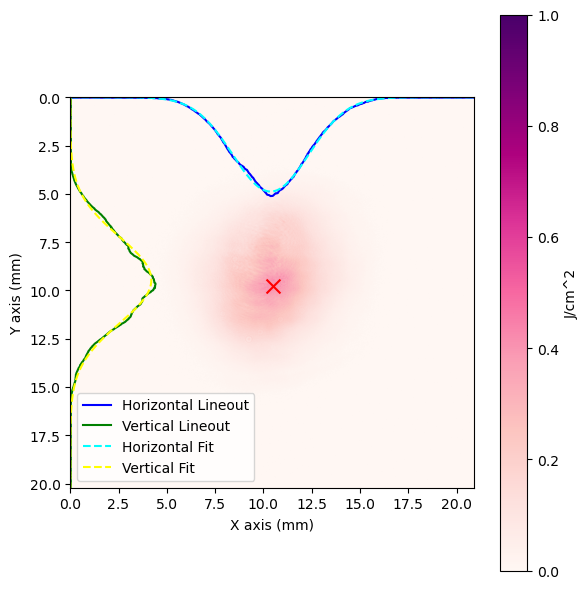

File: 6_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.8885 mm
Vertical 1/e^2 Diameter: 8.9751 mm


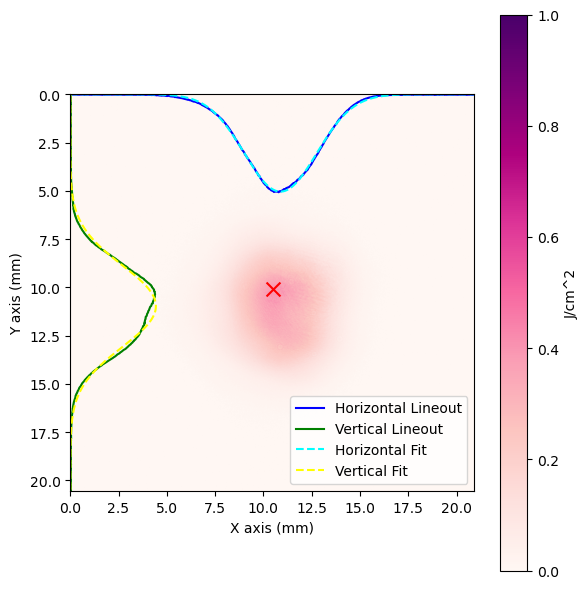

File: 7_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.4886 mm
Vertical 1/e^2 Diameter: 8.4809 mm


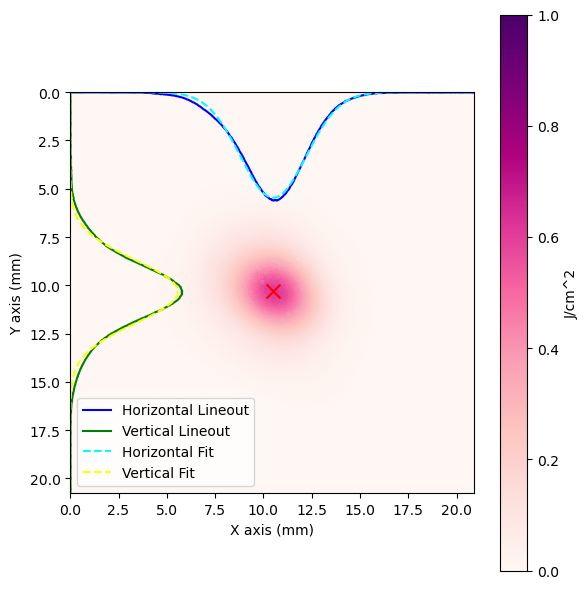

File: 8_0001.ascii.csv
Horizontal 1/e^2 Diameter: 6.8262 mm
Vertical 1/e^2 Diameter: 6.5465 mm


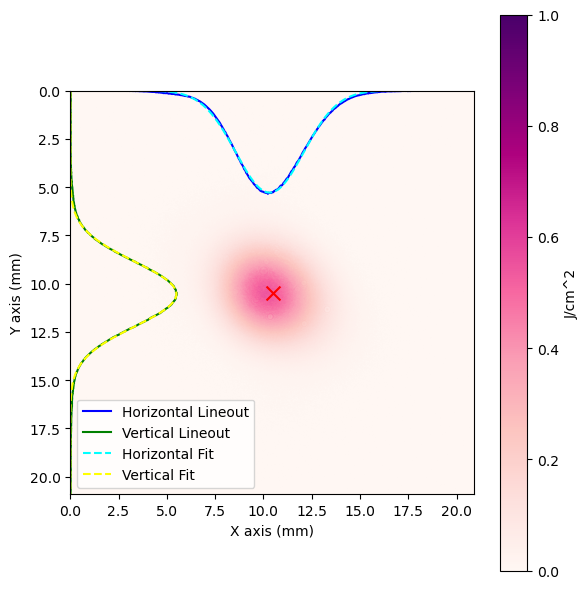

File: 9_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.0107 mm
Vertical 1/e^2 Diameter: 6.7317 mm


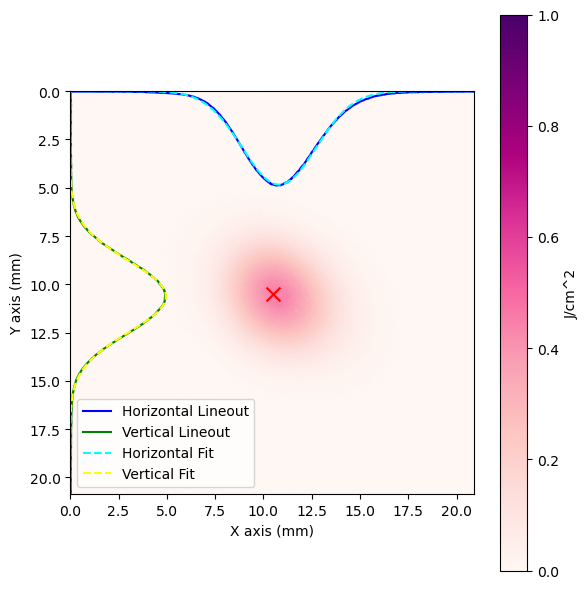

File: 10_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.6142 mm
Vertical 1/e^2 Diameter: 7.4885 mm
ValueError: Could not process 11_0001.ascii.csv: 'utf-8' codec can't decode byte 0x8a in position 0: invalid start byte


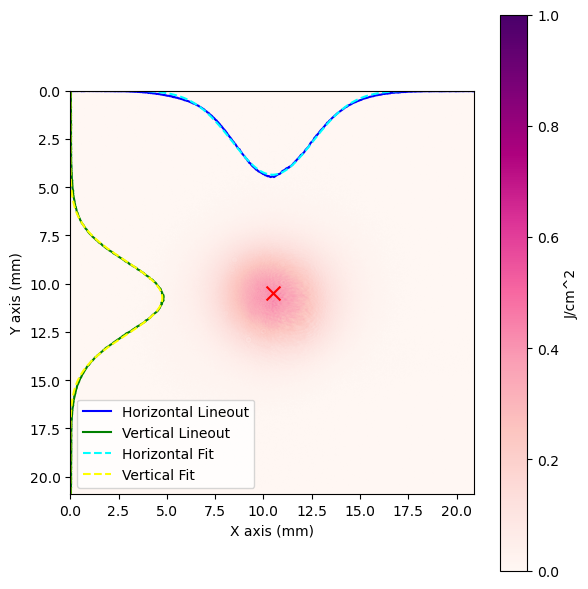

File: 12_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.3296 mm
Vertical 1/e^2 Diameter: 7.6303 mm


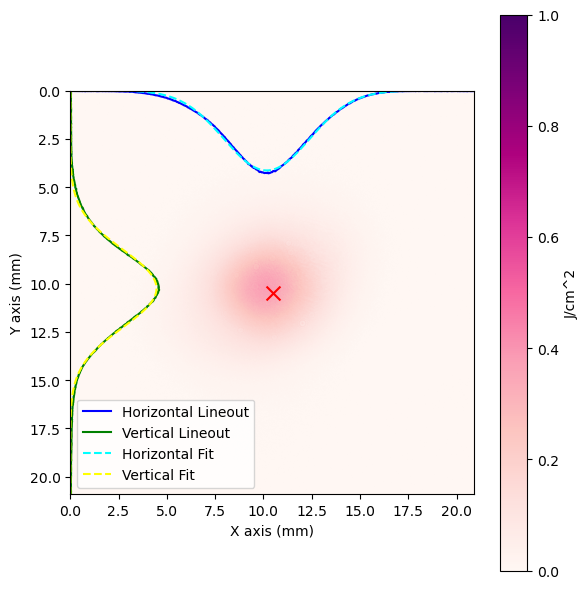

File: 13_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.8580 mm
Vertical 1/e^2 Diameter: 8.1031 mm


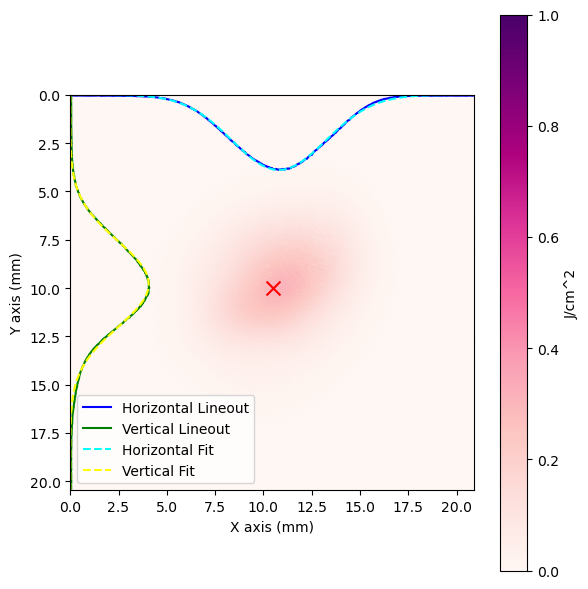

File: 14_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.7404 mm
Vertical 1/e^2 Diameter: 8.9427 mm


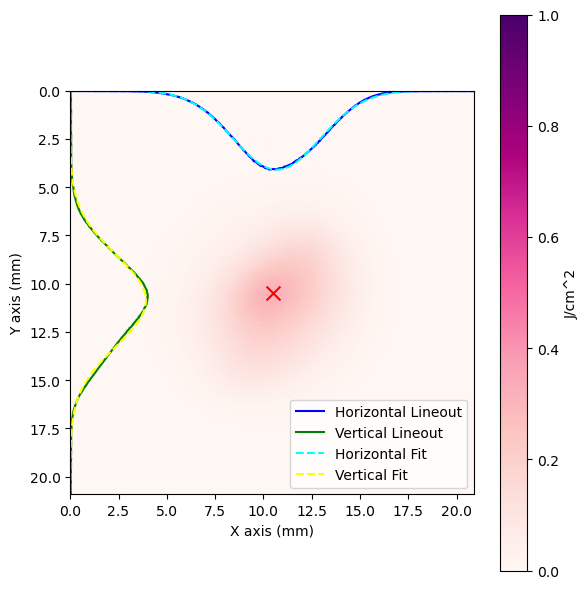

File: 15_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.0464 mm
Vertical 1/e^2 Diameter: 9.4534 mm


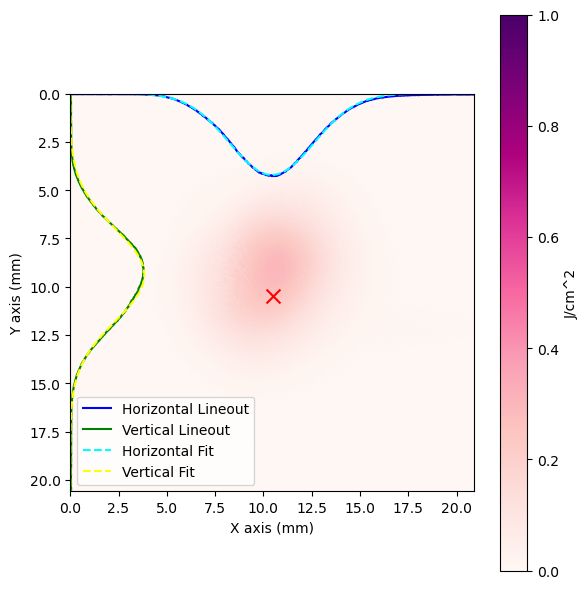

File: 16_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.7308 mm
Vertical 1/e^2 Diameter: 9.6301 mm


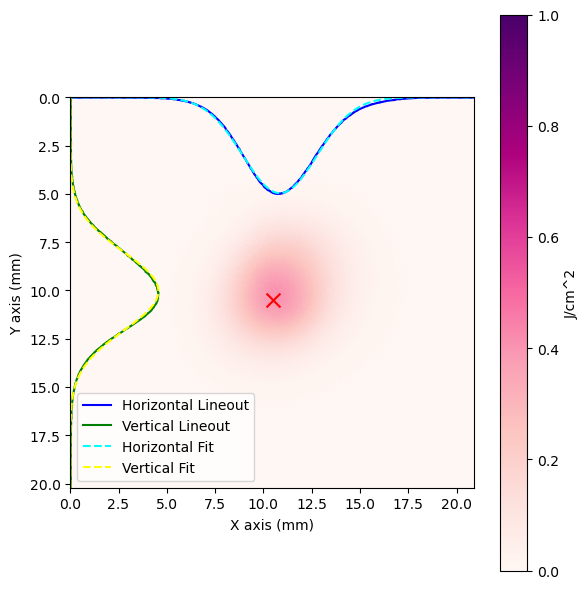

File: 17_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.6767 mm
Vertical 1/e^2 Diameter: 8.1394 mm


In [291]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

#
E_beam = 100e-3  # 100 mJ in a pulse
dx = 4*8.73e-6  # pixel size of the spiricon camera (9 microns) - and 4 pixel binning!
A_pix_cm = dx**2 * 1e4  # pixel area in cm^2

def gaussian(x, a, x0, sigma):
    return a * np.exp(-(x - x0)**2 / (2 * sigma**2))

def fit_gaussian(data):
    x = np.arange(len(data))
    initial_guess = [np.max(data), len(data) // 2, len(data) / 10]
    try:
        popt, _ = curve_fit(gaussian, x, data, p0=initial_guess)
        return popt
    except RuntimeError:
        return None

def plot_ascii_csv_files_with_peak(folder_path,ascii_csv_files):

    max_fluences = []
    h_diams = []
    v_diams = []

    # Plot each ASCII CSV file
    for csv_file in ascii_csv_files:
        file_path = os.path.join(folder_path, csv_file)
        try:
            # Load the CSV file into a numpy array
            data = np.genfromtxt(file_path, delimiter=',')

            # Replace NaN or inf values with zeros
            data = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)

            # Find the peak value in the data
            peak_value = np.max(data)

            # Replace all pixel values less than 1% of the peak value with zeros
            threshold = 0.01 * peak_value
            data[data < threshold] = 0

            sum_vals = np.sum(data)  # sum of all the pixel counts
            E_per_pixcount = E_beam / sum_vals  # energy per one pixel count

            # Find the peak in the data
            max_loc = np.unravel_index(np.argmax(data), data.shape)

            # Create a mask for a circle with radius 5 pixels around the peak location
            y, x = np.ogrid[:data.shape[0], :data.shape[1]]
            center_y, center_x = max_loc
            mask = (x - center_x)**2 + (y - center_y)**2 <= 5**2

            # Apply the mask to the data to get the values within the circle
            values_in_circle = data[mask]

            # Calculate the average value within the peak circle
            avg_peak = np.mean(values_in_circle)

            #save the peak fluence
            max_fluences.append(avg_peak * E_per_pixcount / A_pix_cm)

            # Crop the data to a 600x600 pixel square centered on the peak
            center_y, center_x = max_loc
            start_x = max(center_x - 300, 0)
            end_x = min(center_x + 300, data.shape[1])
            start_y = max(center_y - 300, 0)
            end_y = min(center_y + 300, data.shape[0])
            cropped_data = data[start_y:end_y, start_x:end_x]

            # Calculate the fluence
            fluence_map = cropped_data * E_per_pixcount / A_pix_cm

            # Extract the lineouts for gaussian fitting (sum along axis)
            horizontal_lineout = np.mean(fluence_map,axis=0)
            vertical_lineout = np.mean(fluence_map,axis=1)

            # Fit Gaussian to the lineouts
            h_fit_params = fit_gaussian(horizontal_lineout)
            v_fit_params = fit_gaussian(vertical_lineout)

            # Calculate the 1/e^2 diameters
            if h_fit_params is not None:
                h_fwhm = 2 * np.sqrt(2*np.log(2)) * h_fit_params[2] #calculate FWHM from sigma
                h_esqr_mm = 1.699 * h_fwhm * dx * 1e3  # convert FWHM to 1/e^2 diameter, and into mm
                h_diams.append(h_esqr_mm)
            else:
                h_esqr_mm = None

            if v_fit_params is not None:
                v_fwhm = 2 * np.sqrt(2) * np.sqrt(np.log(2)) * v_fit_params[2] #calculate FWHM from sigma
                v_esqr_mm = 1.699 * v_fwhm * dx * 1e3 # convert FWHM to 1/e^2 diameter, and into mm
                v_diams.append(v_esqr_mm)
            else:
                v_esqr_mm = None

            # Create mm scales for the axes
            x_mm = np.arange(fluence_map.shape[1]) * dx * 1e3
            y_mm = np.arange(fluence_map.shape[0]) * dx * 1e3

            # Plot the data using matplotlib
            fig, ax = plt.subplots(figsize=(6, 6))

            # Plot the fluence map
            im = ax.imshow(fluence_map, extent=[x_mm[0], x_mm[-1], y_mm[-1], y_mm[0]], cmap='RdPu', vmin=0, vmax=1)
            ax.scatter((center_x-start_x) * dx * 1e3, (center_y-start_y) * dx * 1e3, color='red', s=100, marker='x')
            ax.set_xlabel('X axis (mm)')
            ax.set_ylabel('Y axis (mm)')
            plt.colorbar(im, ax=ax, label='J/cm^2')

            lfactor = 50
            # Overlay the lineouts
            ax.plot(x_mm, horizontal_lineout * lfactor, color='blue', label='Horizontal Lineout')
            ax.plot(vertical_lineout * lfactor, y_mm, color='green', label='Vertical Lineout')

            # Overlay the Gaussian fits
            if h_fit_params is not None:
                ax.plot(x_mm, gaussian(np.arange(len(x_mm)), *h_fit_params)*lfactor, color='cyan', linestyle='--', label='Horizontal Fit')
            if v_fit_params is not None:
                ax.plot(gaussian(np.arange(len(y_mm)), *v_fit_params) * lfactor, y_mm, color='yellow', linestyle='--', label='Vertical Fit')

            ax.legend()

            plt.tight_layout()
            plt.show()

            print(f"File: {csv_file}")
            print(f"Horizontal 1/e^2 Diameter: {h_esqr_mm:.4f} mm" if h_esqr_mm else "Horizontal fit failed")
            print(f"Vertical 1/e^2 Diameter: {v_esqr_mm:.4f} mm" if v_esqr_mm else "Vertical fit failed")

        except ValueError as ve:
            print(f"ValueError: Could not process {csv_file}: {ve}")
        except Exception as e:
            print(f"Could not process {csv_file}: {e}")

    return max_fluences,h_diams,v_diams

# Example usage:
folder_path_1 = '/Users/sebastiankalos/Documents/OXFORD/CALA/Expt_June2024/21062024/grid1'
ascii_csv_files_1 = ['6_0001.ascii.csv',
                        '7_0001.ascii.csv',
                        '8_0001.ascii.csv',
                        '9_0001.ascii.csv',
                        '10_0001.ascii.csv',
                        '11_0001.ascii.csv',
                        '12_0001.ascii.csv',
                        '13_0001.ascii.csv',
                        '14_0001.ascii.csv',
                        '15_0001.ascii.csv',
                        '16_0001.ascii.csv',
                        '17_0001.ascii.csv']
max_fluences_1,h_diams_1,v_diams_1 = plot_ascii_csv_files_with_peak(folder_path_1, ascii_csv_files_1)


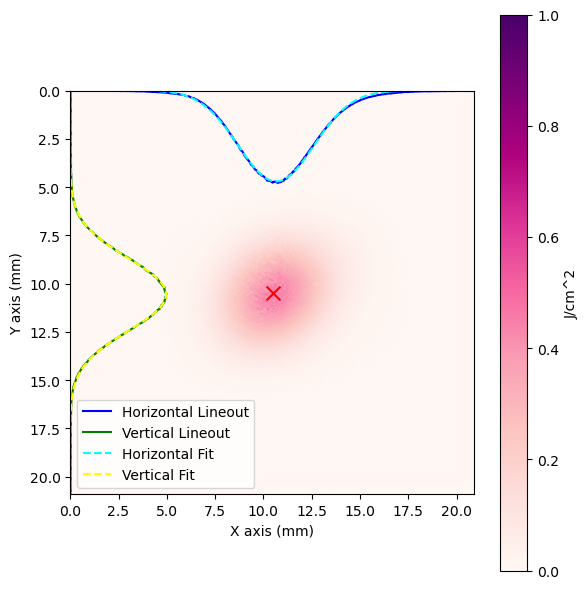

File: 1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.8229 mm
Vertical 1/e^2 Diameter: 7.5154 mm


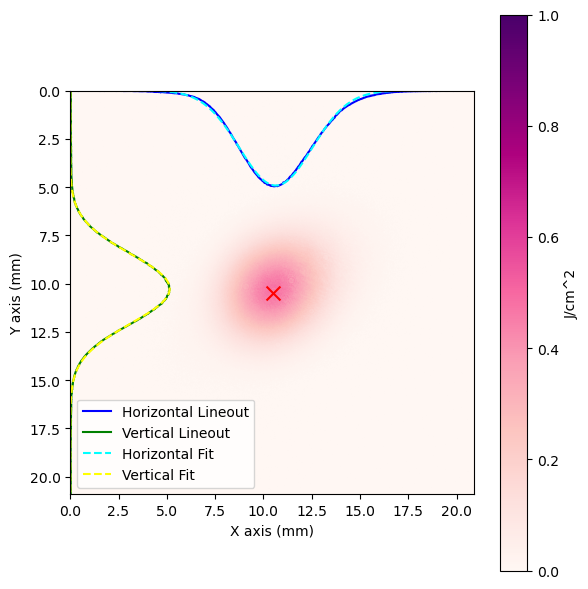

File: 2_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.5059 mm
Vertical 1/e^2 Diameter: 7.2233 mm


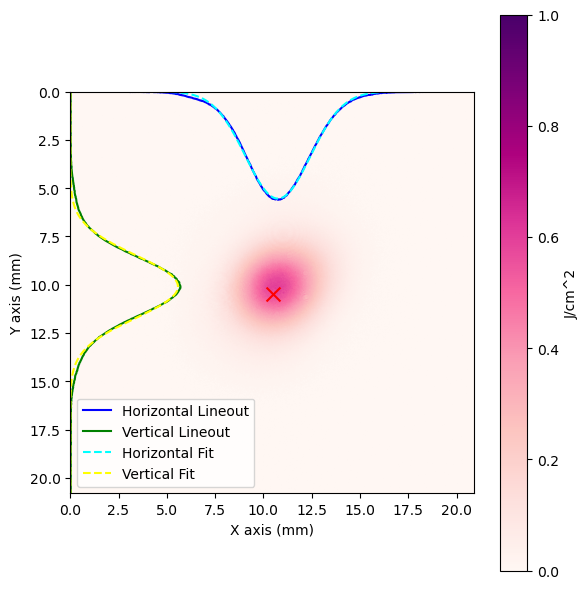

File: 3_0001.ascii.csv
Horizontal 1/e^2 Diameter: 6.6868 mm
Vertical 1/e^2 Diameter: 6.5232 mm


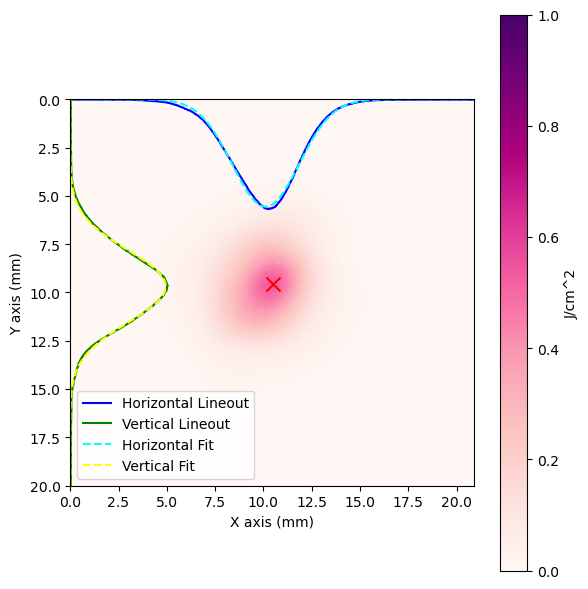

File: 4_0001.ascii.csv
Horizontal 1/e^2 Diameter: 6.9016 mm
Vertical 1/e^2 Diameter: 7.4630 mm


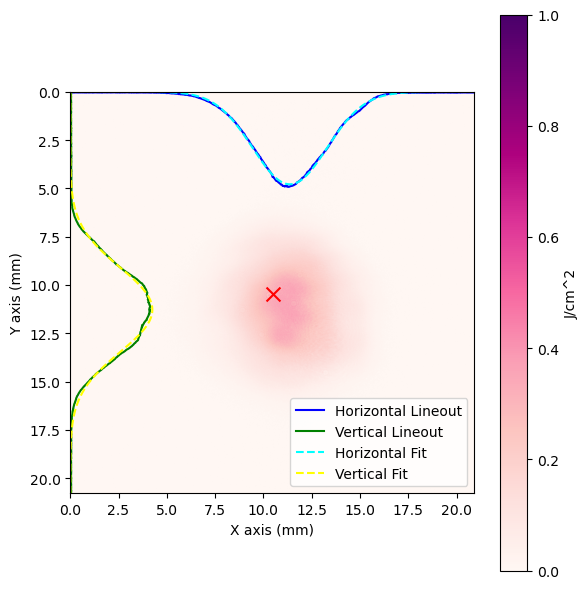

File: 5_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.6990 mm
Vertical 1/e^2 Diameter: 8.7752 mm


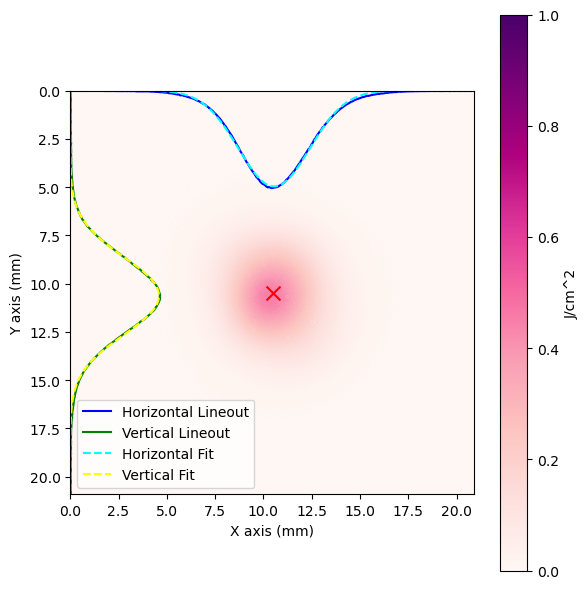

File: 6_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.3588 mm
Vertical 1/e^2 Diameter: 8.0140 mm


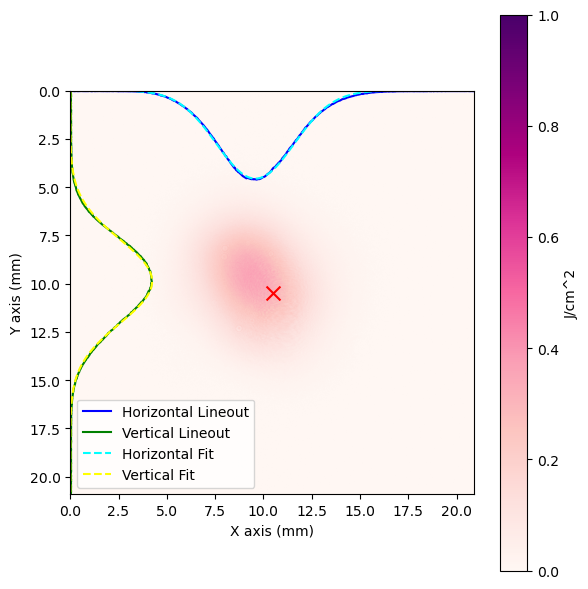

File: 7_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.0156 mm
Vertical 1/e^2 Diameter: 8.7025 mm
ValueError: Could not process 8_0001.ascii.csv: 'utf-8' codec can't decode byte 0xf5 in position 4096: invalid start byte
ValueError: Could not process 9_0001.ascii.csv: 'utf-8' codec can't decode byte 0xd1 in position 4096: invalid continuation byte


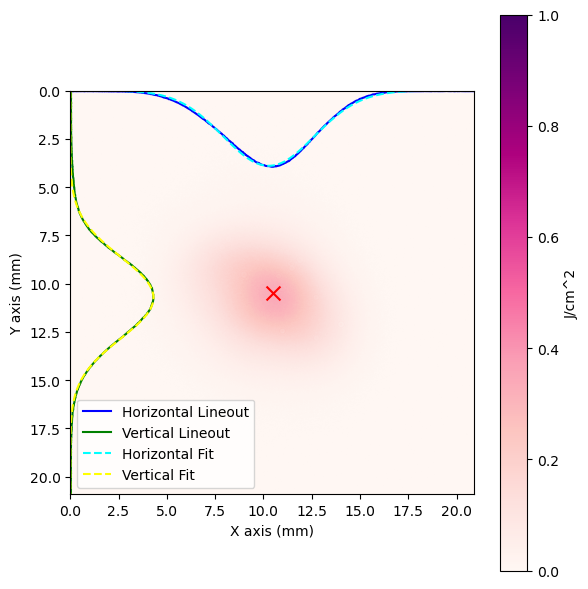

File: 10_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.4694 mm
Vertical 1/e^2 Diameter: 8.4513 mm


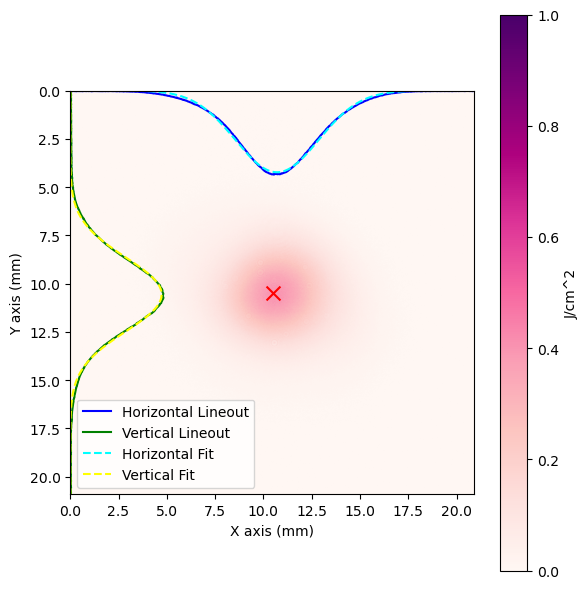

File: 11_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.5985 mm
Vertical 1/e^2 Diameter: 7.6807 mm


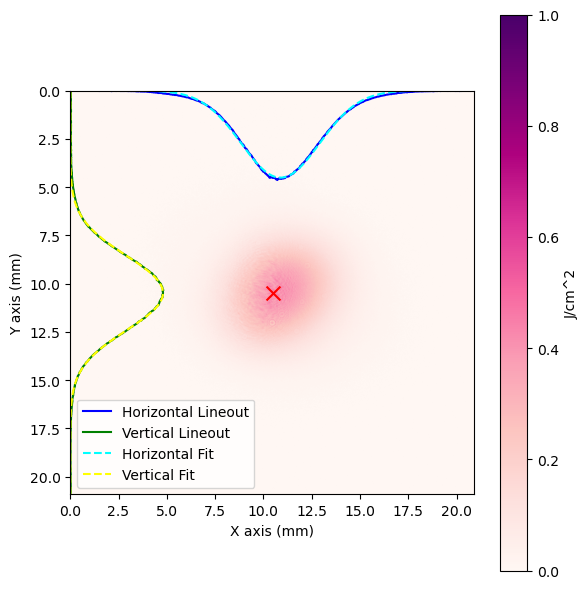

File: 12_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.1224 mm
Vertical 1/e^2 Diameter: 7.7169 mm


In [292]:
# Example usage:
folder_path_2 = '/Users/sebastiankalos/Documents/OXFORD/CALA/Expt_June2024/21062024/grid2'
ascii_csv_files_2 = ['1_0001.ascii.csv',
                        '2_0001.ascii.csv',
                        '3_0001.ascii.csv',
                        '4_0001.ascii.csv',
                        '5_0001.ascii.csv',
                        '6_0001.ascii.csv',
                        '7_0001.ascii.csv',
                        '8_0001.ascii.csv',
                        '9_0001.ascii.csv',
                        '10_0001.ascii.csv',
                        '11_0001.ascii.csv',
                        '12_0001.ascii.csv']
max_fluences_2,h_diams_2,v_diams_2 = plot_ascii_csv_files_with_peak(folder_path_2, ascii_csv_files_2)

(0.0, 0.5)

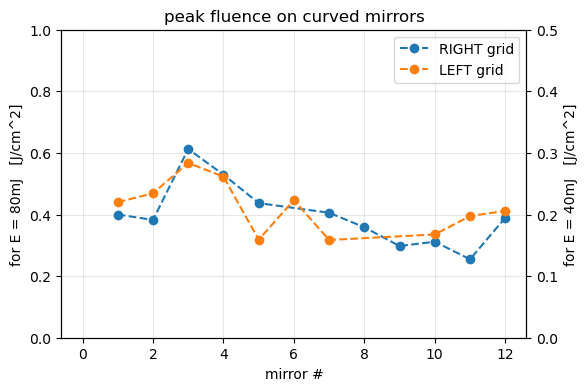

In [293]:
fig, ax = plt.subplots(figsize=(6, 4))

mirrs_1 = [1,2,3,4,5,7,8,9,10,11,12]
mirrs_2 = [1,2,3,4,5,6,7,10,11,12]

ax.plot(mirrs_1,max_fluences_1,'--o',label='RIGHT grid')
ax.plot(mirrs_2,max_fluences_2,'--o',label='LEFT grid')
ax.set_xlabel('mirror #')
ax.set_ylabel(r'for E = 80mJ   [J/cm^2]')
ax.set_ylim(0,1)
ax.set_title('peak fluence on curved mirrors')
ax.grid(alpha=0.3)
ax.legend()

ax1 = ax.twinx()
ax1.plot(np.array(max_fluences_1)/2,alpha=0)
ax1.plot(np.array(max_fluences_2)/2,alpha=0)
ax1.set_ylabel(r'for E = 40mJ   [J/cm^2]')

ax1.set_ylim(0,0.5)



Could not process G1M6n1_0001.ascii.csv: /Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/beam diameter on grids 28-06-2024/G1M6n1_0001.ascii.csv not found.


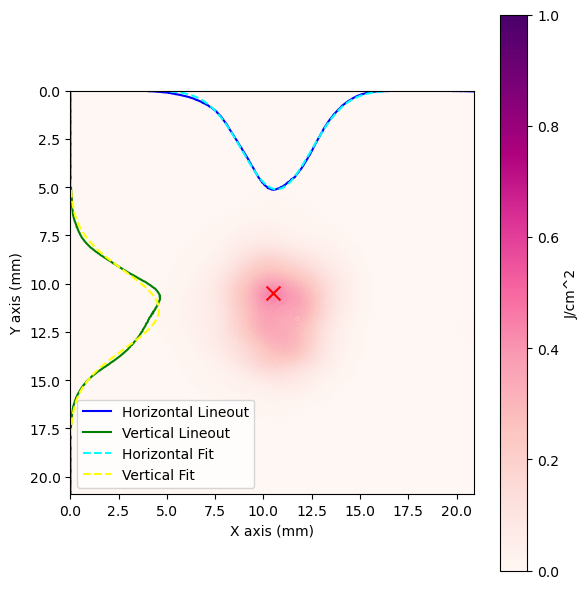

File: G1M7n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.1553 mm
Vertical 1/e^2 Diameter: 8.1163 mm


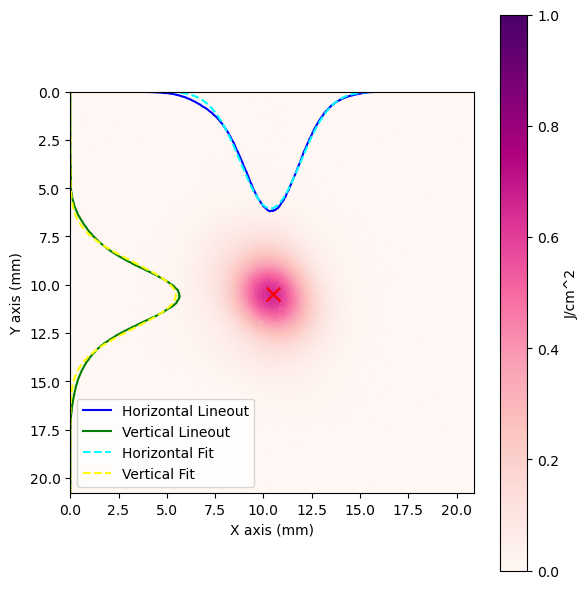

File: G1M8n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 6.1710 mm
Vertical 1/e^2 Diameter: 6.7816 mm


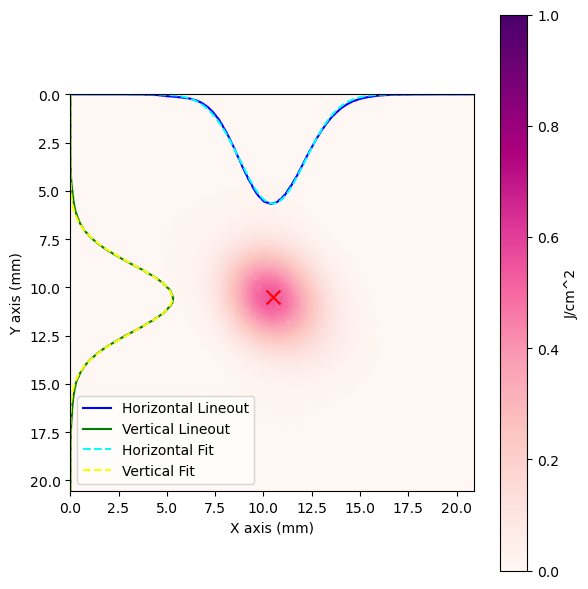

File: G1M9n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 6.7483 mm
Vertical 1/e^2 Diameter: 7.0690 mm


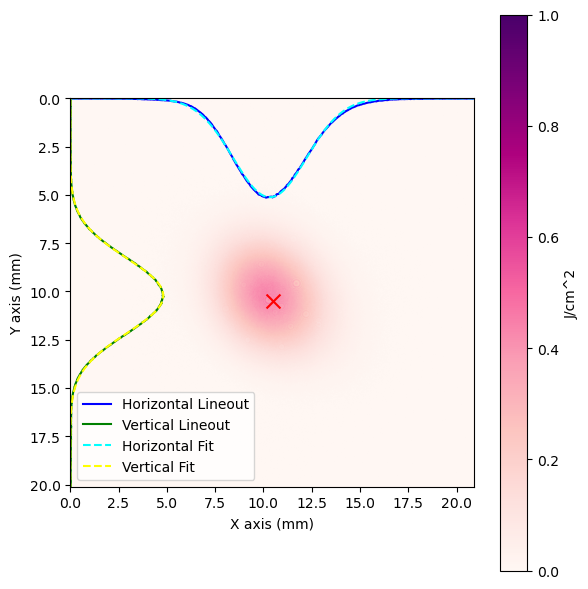

File: G1M10n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.5437 mm
Vertical 1/e^2 Diameter: 7.7934 mm


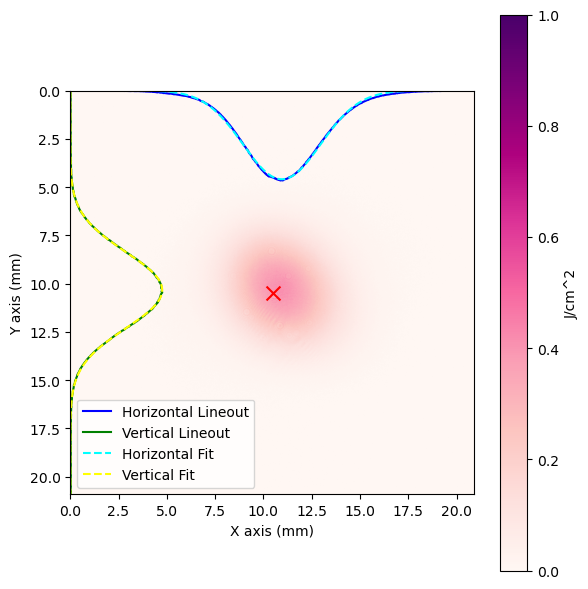

File: G1M11n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.0327 mm
Vertical 1/e^2 Diameter: 7.8672 mm


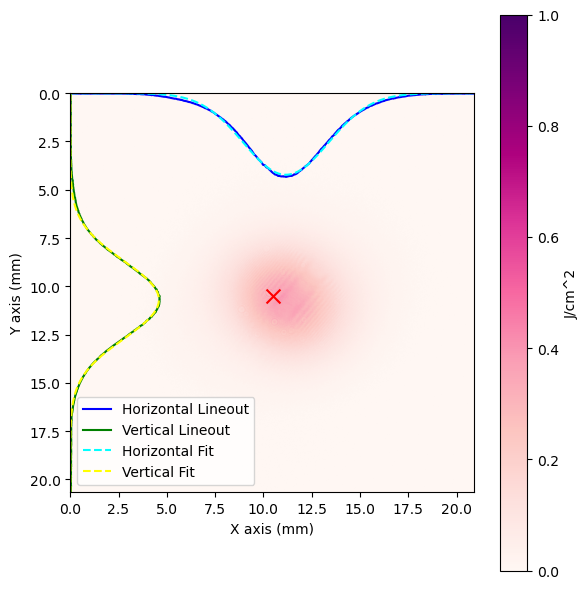

File: G1M12n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.8097 mm
Vertical 1/e^2 Diameter: 8.0328 mm


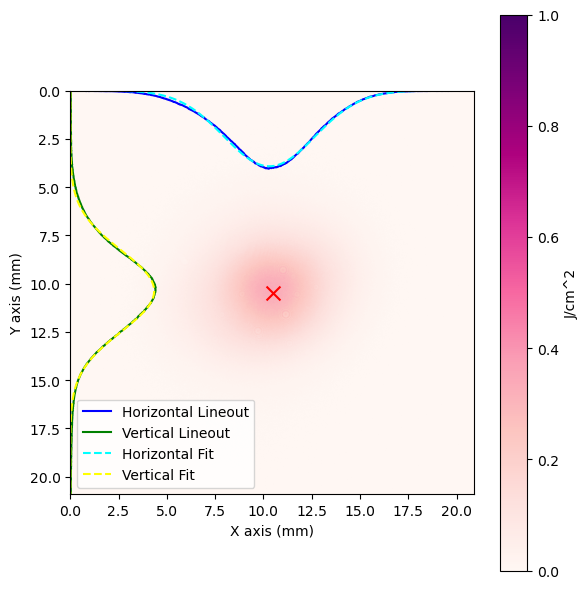

File: G1M13n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.4248 mm
Vertical 1/e^2 Diameter: 8.4337 mm


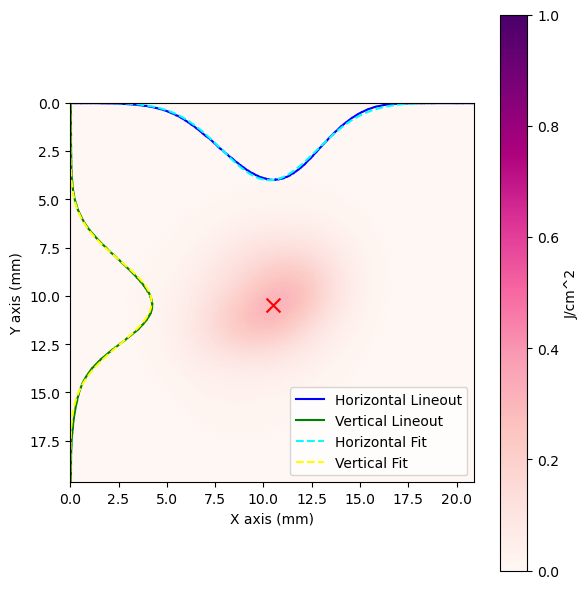

File: G1M14n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.8845 mm
Vertical 1/e^2 Diameter: 8.7239 mm


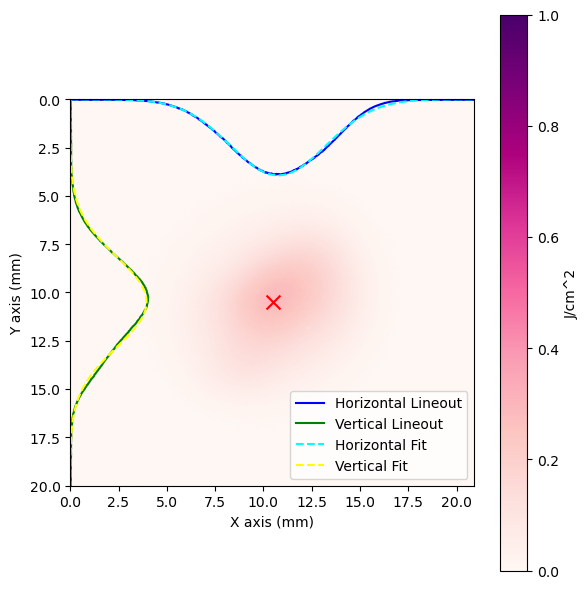

File: G1M15n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.9363 mm
Vertical 1/e^2 Diameter: 9.4058 mm


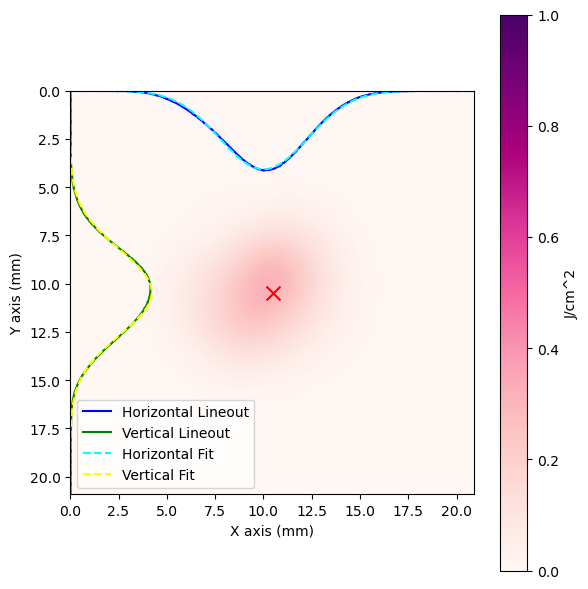

File: G1M16n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.1285 mm
Vertical 1/e^2 Diameter: 8.8699 mm


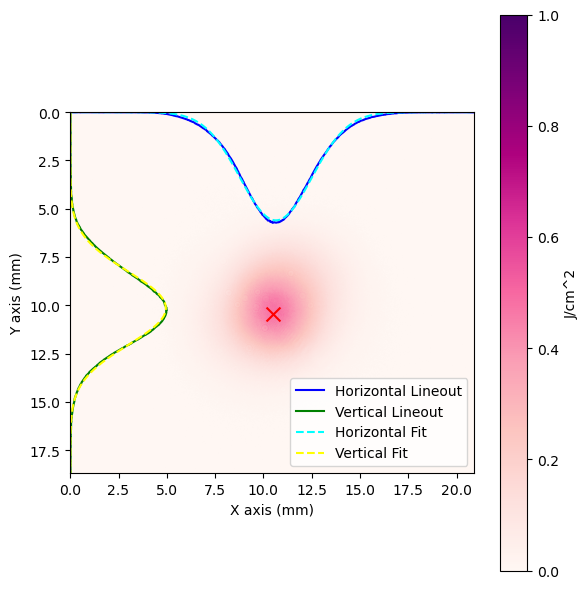

File: G1M17n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.4148 mm
Vertical 1/e^2 Diameter: 7.5960 mm


In [363]:
folder_path_fri = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/beam diameter on grids 28-06-2024'
ascii_csv_files_1_fri =['G1M6n1_0001.ascii.csv',
                        'G1M7n1_0001.ascii.csv',
                        'G1M8n1_0001.ascii.csv',
                        'G1M9n1_0001.ascii.csv',
                        'G1M10n1_0001.ascii.csv',
                        'G1M11n1_0001.ascii.csv',
                        'G1M12n1_0001.ascii.csv',
                        'G1M13n1_0001.ascii.csv',
                        'G1M14n1_0001.ascii.csv',
                        'G1M15n1_0001.ascii.csv',
                        'G1M16n1_0001.ascii.csv',
                        'G1M17n1_0001.ascii.csv']
max_fluences_grid_1_fri,h_diams_grid_1_fri,v_diams_grid_1_fri = plot_ascii_csv_files_with_peak(folder_path_fri, ascii_csv_files_1_fri)

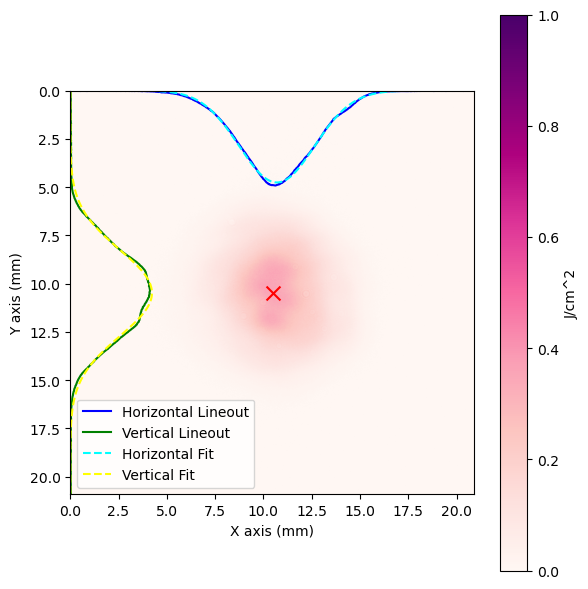

File: G2M17n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.7805 mm
Vertical 1/e^2 Diameter: 8.9441 mm


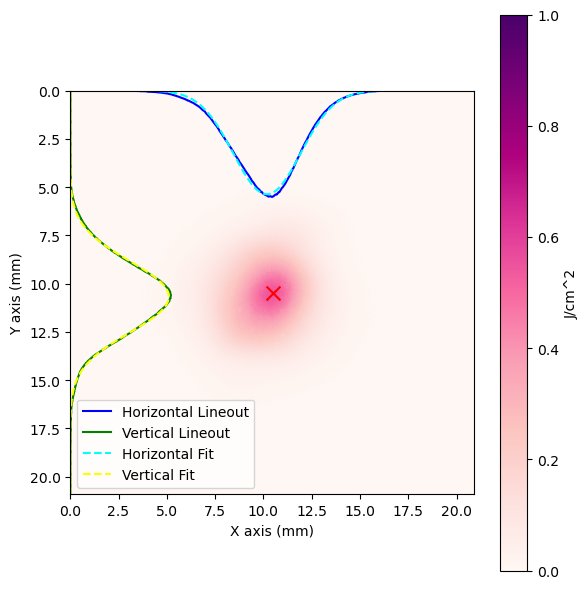

File: G2M16n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 6.9653 mm
Vertical 1/e^2 Diameter: 7.3649 mm


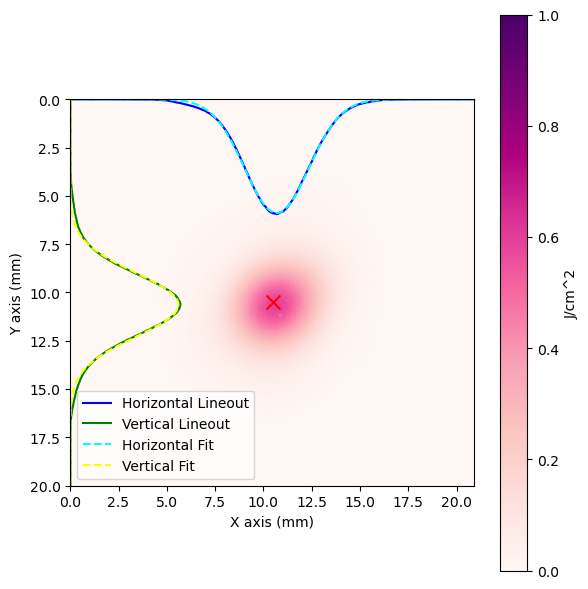

File: G2M15n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 6.6534 mm
Vertical 1/e^2 Diameter: 6.6102 mm


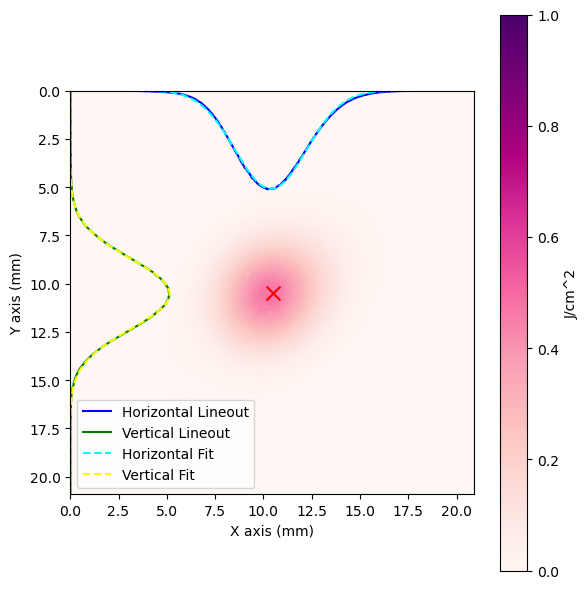

File: G2M14n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.3647 mm
Vertical 1/e^2 Diameter: 7.3319 mm


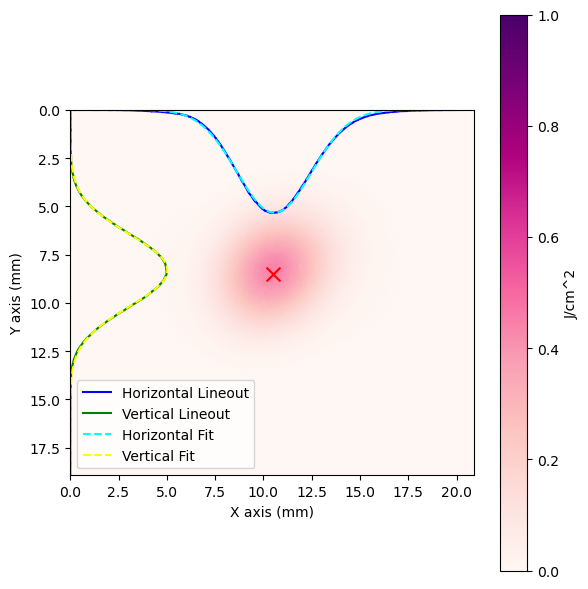

File: G2M13n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.7079 mm
Vertical 1/e^2 Diameter: 7.5404 mm


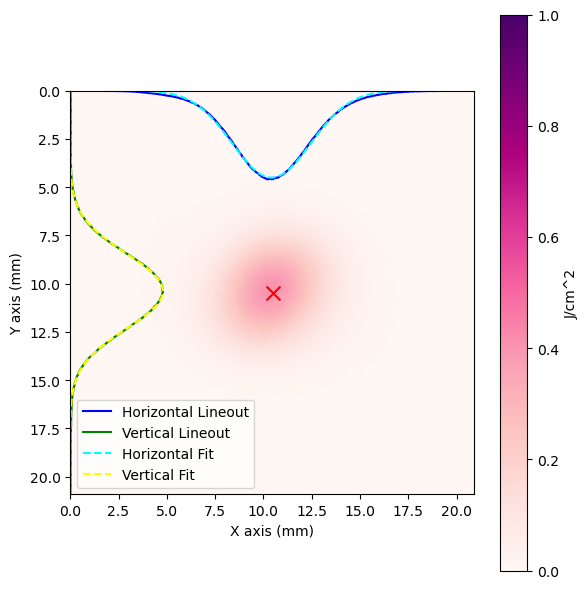

File: G2M12n2_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.1344 mm
Vertical 1/e^2 Diameter: 7.7833 mm


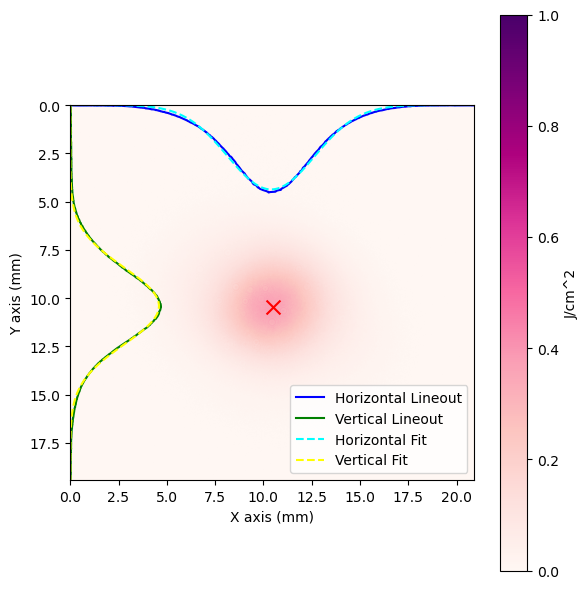

File: G2M11n2_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.0141 mm
Vertical 1/e^2 Diameter: 7.9803 mm


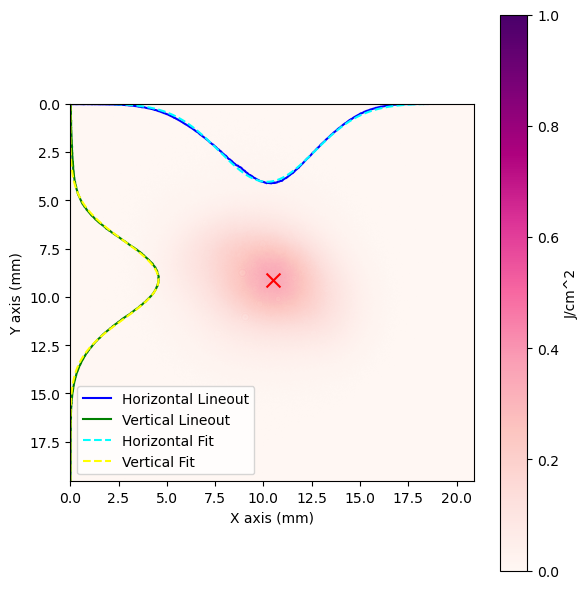

File: G2M10n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.9098 mm
Vertical 1/e^2 Diameter: 8.0928 mm


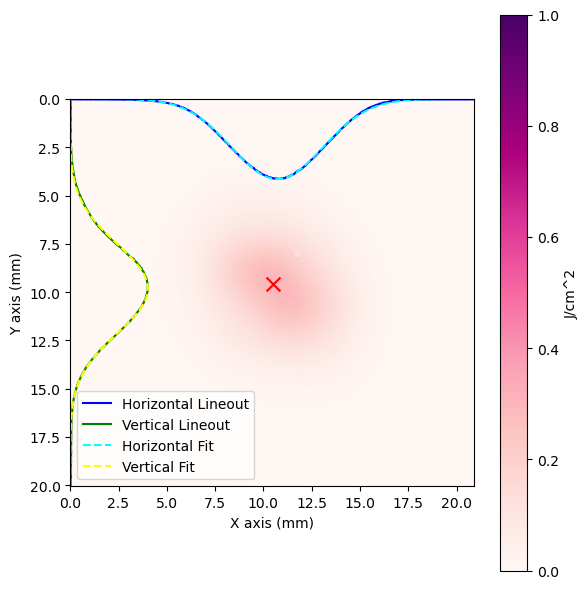

File: G2M9n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 9.4120 mm
Vertical 1/e^2 Diameter: 9.2246 mm


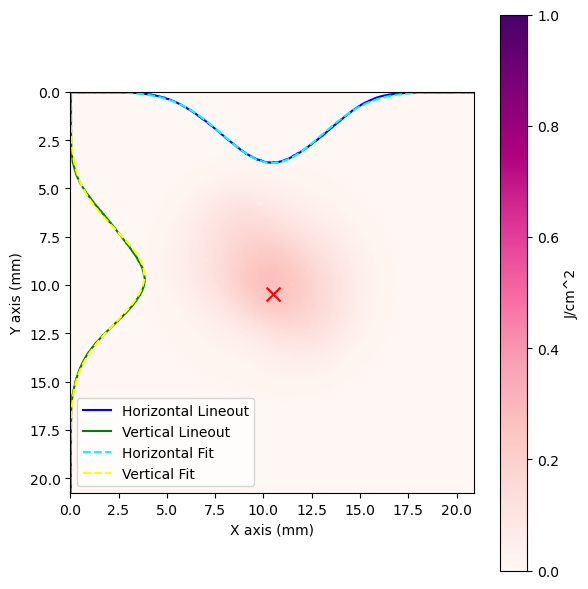

File: G2M8n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 10.2364 mm
Vertical 1/e^2 Diameter: 9.7042 mm


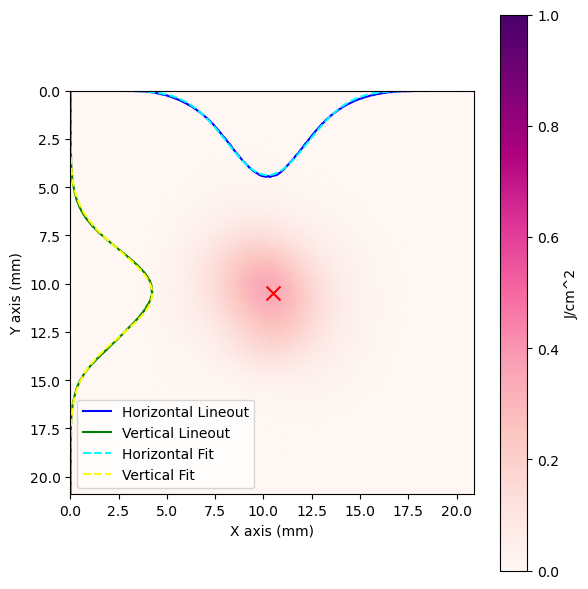

File: G2M7n2_0001.ascii.csv
Horizontal 1/e^2 Diameter: 8.4498 mm
Vertical 1/e^2 Diameter: 8.8393 mm


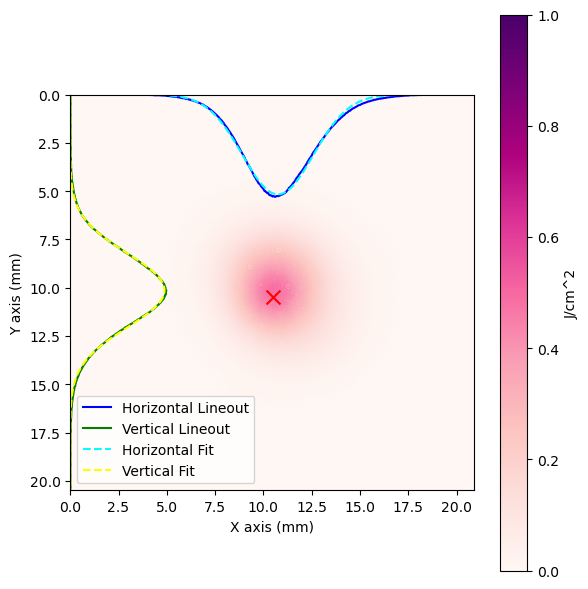

File: G2M6n1_0001.ascii.csv
Horizontal 1/e^2 Diameter: 7.3293 mm
Vertical 1/e^2 Diameter: 7.6584 mm


In [364]:
folder_path_fri = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/beam diameter on grids 28-06-2024'
ascii_csv_files_2_fri =['G2M17n1_0001.ascii.csv',
                        'G2M16n1_0001.ascii.csv',
                        'G2M15n1_0001.ascii.csv',
                        'G2M14n1_0001.ascii.csv',
                        'G2M13n1_0001.ascii.csv',
                        'G2M12n2_0001.ascii.csv',
                        'G2M11n2_0001.ascii.csv',
                        'G2M10n1_0001.ascii.csv',
                        'G2M9n1_0001.ascii.csv',
                        'G2M8n1_0001.ascii.csv',
                        'G2M7n2_0001.ascii.csv',
                        'G2M6n1_0001.ascii.csv']
max_fluences_grid_2_fri,h_diams_grid_2_fri,v_diams_grid_2_fri = plot_ascii_csv_files_with_peak(folder_path_fri, ascii_csv_files_2_fri)

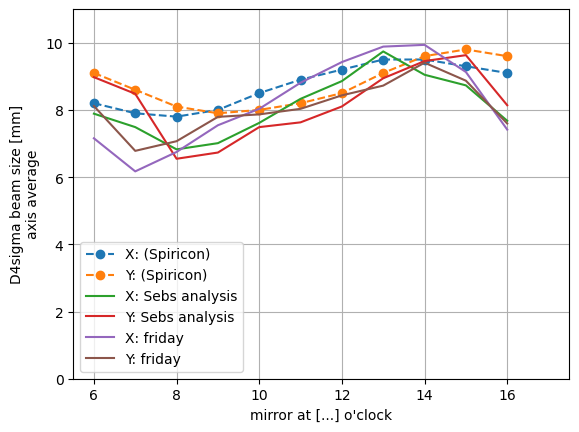

In [365]:
mirrs_42 = [6,7,8,9,10,11,12,13,14,15,16]
x42 = [8.2,7.9,7.8,8.0,8.5,8.9,9.2,9.5,9.5,9.3,9.1]
y42 = [9.1,8.6,8.1,7.9,8.0,8.2,8.5,9.1,9.6,9.8,9.6]

plt.plot(mirrs_42,x42,'--o',label='X: (Spiricon)')
plt.plot(mirrs_42,y42,'--o',label='Y: (Spiricon)')

plt.plot(mirrs_42,h_diams_1,label='X: Sebs analysis')
plt.plot(mirrs_42,v_diams_1,label='Y: Sebs analysis')

plt.plot(mirrs_42,h_diams_grid_1_fri,label='X: friday')
plt.plot(mirrs_42,v_diams_grid_1_fri,label='Y: friday')


plt.xlim(5.5,17.5)
plt.ylim(0,11)
plt.grid()

plt.xlabel("mirror at [...] o'clock")
plt.ylabel('D4sigma beam size [mm]\naxis average')
plt.legend()

(0.0, 0.5)

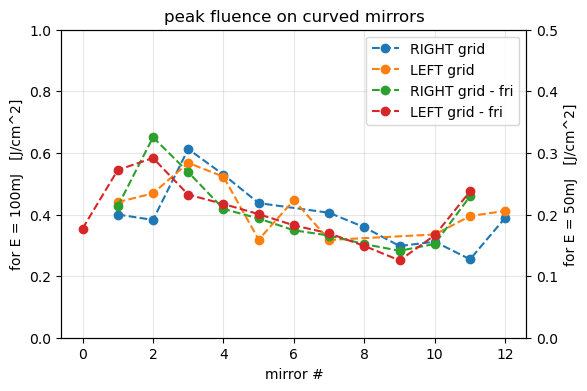

In [366]:
fig, ax = plt.subplots(figsize=(6, 4))

mirrs_1 = [1,2,3,4,5,7,8,9,10,11,12]
mirrs_2 = [1,2,3,4,5,6,7,10,11,12]

ax.plot(mirrs_1,max_fluences_1,'--o',label='RIGHT grid')
ax.plot(mirrs_2,max_fluences_2,'--o',label='LEFT grid')

mirrs_fri_1 = [1,2,3,4,5,6,7,8,9,10,11]
mirrs_fri_2 = [1,2,3,4,5,6,7,8,9,10,11,12]
ax.plot(mirrs_fri_1,max_fluences_grid_1_fri,'--o',label='RIGHT grid - fri')
ax.plot(max_fluences_grid_2_fri,'--o',label='LEFT grid - fri')

ax.set_xlabel('mirror #')
ax.set_ylabel(r'for E = 100mJ   [J/cm^2]')
ax.set_ylim(0,1)
ax.set_title('peak fluence on curved mirrors')
ax.grid(alpha=0.3)
ax.legend()

ax1 = ax.twinx()
ax1.plot(np.array(max_fluences_1)/2,alpha=0)
ax1.plot(np.array(max_fluences_2)/2,alpha=0)
ax1.set_ylabel(r'for E = 50mJ   [J/cm^2]')

ax1.set_ylim(0,0.5)



In [273]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from PIL import Image
import matplotlib.colors as mcolors
from matplotlib.cm import get_cmap

E_beam = 100e-3  # 100 mJ in a pulse
dx = 4.8e-6  # pixel size in meters (of the Basler camera, and with no binning!)
A_pix_cm = dx**2 * 1e4  # pixel area in cm^2

def gaussian(x, a, x0, sigma):
    return a * np.exp(-(x - x0)**2 / (2 * sigma**2))

def fit_gaussian(data):
    x = np.arange(len(data))
    initial_guess = [np.max(data), len(data) // 2, len(data) / 10]
    try:
        popt, _ = curve_fit(gaussian, x, data, p0=initial_guess)
        return popt
    except RuntimeError:
        return None

def read_image_file(file_path):
    image = Image.open(file_path)
    data = np.array(image, dtype=np.float64)
    
    # Remove background
    background = data[:10, :10].mean()  # Assuming the top-left 10x10 pixels represent the background
    data -= background
    
    # Ensure no negative values after background subtraction
    data[data < 0] = 0
    
    return data


def plot_image_files_with_peak(folder_path, image_files, count):
    max_fluences = []
    h_diams = []
    v_diams = []

    # Plot each image file
    for image_file in image_files:
        cropped_imgs = []
        imnum_path = os.path.join(folder_path, image_file)
        if count:
            imnums = [' 01',' 02',' 03',' 04',' 05',' 06',' 07',' 08',' 09',' 10']
        else: imnums = ['']

        for imnum in imnums:
            file_path = imnum_path+imnum+'.tiff'
        
            # Load the image file into a numpy array
            data = read_image_file(file_path)

            # Find the peak value in the data
            peak_value = np.max(data)

            # Replace all pixel values less than 3% of the peak value with zeros
            threshold = 0.01 * peak_value
            data[data < threshold] = 0

            # Find the peak in the data
            max_loc = np.unravel_index(np.argmax(data), data.shape)

            size = 200 #size of the cropped region (or rather half of it)

            # Create a mask for a circle with radius 5 pixels around the peak location
            y, x = np.ogrid[:data.shape[0], :data.shape[1]]
            center_y, center_x = max_loc

            # Crop the data to a 600x600 pixel square centered on the peak
            start_x = max(center_x - size, 0)
            end_x = min(center_x + size, data.shape[1])
            start_y = max(center_y - size, 0)
            end_y = min(center_y + size, data.shape[0])
            cropped_data = data[start_y:end_y, start_x:end_x]

            cropped_imgs.append(cropped_data)

        data = np.mean(np.array(cropped_imgs),axis=0)

        sum_vals = np.sum(data)  # sum of all the pixel counts
        E_per_pixcount = E_beam / sum_vals  # energy per one pixel count

        flat_list = [item for sublist in data for item in sublist]
    
        # Sort the list in descending order
        flat_list.sort(reverse=True)
        
        # Select the top 100 values
        top_100_values = flat_list[:100]
    
        # Calculate the average of the top 100 values
        avg_peak = sum(top_100_values) / 100

        max_fluences.append(avg_peak * E_per_pixcount / A_pix_cm)

        fluence_map = cropped_data * E_per_pixcount / A_pix_cm

        # Extract the lineouts
        horizontal_lineout = np.mean(fluence_map, axis=0)
        vertical_lineout = np.mean(fluence_map, axis=1)

        # Fit Gaussian to the lineouts
        h_fit_params = fit_gaussian(horizontal_lineout)
        v_fit_params = fit_gaussian(vertical_lineout)

        # Calculate the 1/e^2 diameters
        if h_fit_params is not None:
            h_fwhm = 2 * np.sqrt(2) * np.sqrt(np.log(2)) * h_fit_params[2]
            h_esqr_mm = 1.699 * h_fwhm * dx * 1e3  # convert to mm
            h_diams.append(h_esqr_mm)
        else:
            h_esqr_mm = None

        if v_fit_params is not None:
            v_fwhm = 2 * np.sqrt(2) * np.sqrt(np.log(2)) * v_fit_params[2]
            v_esqr_mm = 1.699 * v_fwhm * dx * 1e3  # convert to mm
            v_diams.append(v_esqr_mm)
        else:
            v_esqr_mm = None

        # Create mm scales for the axes
        x_mm = np.arange(fluence_map.shape[1]) * dx * 1e3
        y_mm = np.arange(fluence_map.shape[0]) * dx * 1e3

        # Plot the data using matplotlib
        fig, ax = plt.subplots(figsize=(6, 6))

        # Plot the fluence map
        im = ax.imshow(fluence_map, extent=[x_mm[0], x_mm[-1], y_mm[-1], y_mm[0]], cmap='RdPu')
        ax.scatter((center_x - start_x) * dx * 1e3, (center_y - start_y) * dx * 1e3, color='red', s=100, marker='x')
        ax.set_title(f"{image_file} - Peak at {max_loc}")
        ax.set_xlabel('X axis (mm)')
        ax.set_ylabel('Y axis (mm)')
        plt.colorbar(im, ax=ax, label='J/cm^2')

        fact = 0.01

        # Overlay the lineouts
        ax.plot(x_mm, horizontal_lineout * fact, color='blue', label='Horizontal Lineout')
        ax.plot(vertical_lineout * fact, y_mm, color='green', label='Vertical Lineout')

        # Overlay the Gaussian fits
        if h_fit_params is not None:
            ax.plot(x_mm, gaussian(np.arange(len(x_mm)), *h_fit_params) * fact, color='cyan', linestyle='--', label='Horizontal Fit')
        if v_fit_params is not None:
            ax.plot(gaussian(np.arange(len(y_mm)), *v_fit_params) * fact, y_mm, color='yellow', linestyle='--', label='Vertical Fit')

        ax.legend()

        plt.tight_layout()
        plt.show()

        print(f"File: {image_file}")
        print(f"Horizontal 1/e^2 Diameter: {h_esqr_mm:.4f} mm" if h_esqr_mm else "Horizontal fit failed")
        print(f"Vertical 1/e^2 Diameter: {v_esqr_mm:.4f} mm" if v_esqr_mm else "Vertical fit failed")

    return np.array(max_fluences), h_diams, v_diams


def plot_image_files_with_peak_crop(folder_path, image_files, count, roi):
    max_fluences = []
    h_diams = []
    v_diams = []

    # Plot each image file
    for image_file in image_files:
        cropped_imgs = []
        imnum_path = os.path.join(folder_path, image_file)
        if count:
            imnums = [' 01', ' 02', ' 03', ' 04', ' 05', ' 06', ' 07', ' 08', ' 09', ' 10']
        else:
            imnums = ['']

        for imnum in imnums:
            file_path = imnum_path + imnum + '.tiff'
        
            # Load the image file into a numpy array
            data = read_image_file(file_path)

            # Store the original data for plotting the full image with ROI
            original_data = data.copy()

            # Crop the data to the specified ROI
            x_start, x_end, y_start, y_end = roi
            data = data[y_start:y_end, x_start:x_end]

            # Find the peak value in the data
            peak_value = np.max(data)

            # Replace all pixel values less than 1% of the peak value with zeros
            threshold = 0.01 * peak_value
            data[data < threshold] = 0

            # Find the peak in the data
            max_loc = np.unravel_index(np.argmax(data), data.shape)

            size = 200  # size of the cropped region (or rather half of it)

            # Create a mask for a circle with radius 5 pixels around the peak location
            y, x = np.ogrid[:data.shape[0], :data.shape[1]]
            center_y, center_x = max_loc

            # Crop the data to a 600x600 pixel square centered on the peak
            start_x = max(center_x - size, 0)
            end_x = min(center_x + size, data.shape[1])
            start_y = max(center_y - size, 0)
            end_y = min(center_y + size, data.shape[0])
            cropped_data = data[start_y:end_y, start_x:end_x]

            cropped_imgs.append(cropped_data)

        # Ensure all cropped images have the same shape
        if not all(c.shape == cropped_imgs[0].shape for c in cropped_imgs):
            # Handle case where shapes are not the same (you can pad or resize images as needed)
            raise ValueError("All cropped images must have the same shape.")

        # Convert list of cropped images to numpy array and calculate mean
        data = np.mean(np.array(cropped_imgs), axis=0)

        sum_vals = np.sum(data)  # sum of all the pixel counts
        E_per_pixcount = E_beam / sum_vals  # energy per one pixel count

        flat_list = [item for sublist in data for item in sublist]
    
        # Sort the list in descending order
        flat_list.sort(reverse=True)
        
        # Select the top 100 values
        top_100_values = flat_list[:100]
    
        # Calculate the average of the top 100 values
        avg_peak = sum(top_100_values) / 100

        max_fluences.append(avg_peak * E_per_pixcount / A_pix_cm)

        fluence_map = cropped_data * E_per_pixcount / A_pix_cm

        # Extract the lineouts
        horizontal_lineout = np.mean(fluence_map, axis=0)
        vertical_lineout = np.mean(fluence_map, axis=1)

        # Fit Gaussian to the lineouts
        h_fit_params = fit_gaussian(horizontal_lineout)
        v_fit_params = fit_gaussian(vertical_lineout)

        # Calculate the 1/e^2 diameters
        if h_fit_params is not None:
            h_fwhm = 2 * np.sqrt(2) * np.sqrt(np.log(2)) * h_fit_params[2]
            h_esqr_mm = 1.699 * h_fwhm * dx * 1e3  # convert to mm
            h_diams.append(h_esqr_mm)
        else:
            h_esqr_mm = None

        if v_fit_params is not None:
            v_fwhm = 2 * np.sqrt(2) * np.sqrt(np.log(2)) * v_fit_params[2]
            v_esqr_mm = 1.699 * v_fwhm * dx * 1e3  # convert to mm
            v_diams.append(v_esqr_mm)
        else:
            v_esqr_mm = None

        # Create mm scales for the axes
        x_mm = np.arange(fluence_map.shape[1]) * dx * 1e3
        y_mm = np.arange(fluence_map.shape[0]) * dx * 1e3

        # Plot the data using matplotlib
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

        # Plot the original image with ROI
        ax1.imshow(original_data, cmap='gray')
        ax1.add_patch(plt.Rectangle((x_start, y_start), x_end-x_start, y_end-y_start, edgecolor='magenta', facecolor='none', lw=2))
        ax1.set_title(f"{image_file} - Original with ROI")
        ax1.set_xlabel('X axis (pixels)')
        ax1.set_ylabel('Y axis (pixels)')

        # Plot the fluence map
        im = ax2.imshow(fluence_map, extent=[x_mm[0], x_mm[-1], y_mm[-1], y_mm[0]], cmap='RdPu')
        ax2.scatter((center_x - start_x) * dx * 1e3, (center_y - start_y) * dx * 1e3, color='red', s=100, marker='x')
        ax2.set_title(f"{image_file} - Peak at {max_loc}")
        ax2.set_xlabel('X axis (mm)')
        ax2.set_ylabel('Y axis (mm)')
        plt.colorbar(im, ax=ax2, label='J/cm^2')

        fact = 0.01

        # Overlay the lineouts
        ax2.plot(x_mm, horizontal_lineout * fact, color='blue', label='Horizontal Lineout')
        ax2.plot(vertical_lineout * fact, y_mm, color='green', label='Vertical Lineout')

        # Overlay the Gaussian fits
        if h_fit_params is not None:
            ax2.plot(x_mm, gaussian(np.arange(len(x_mm)), *h_fit_params) * fact, color='cyan', linestyle='--', label='Horizontal Fit')
        if v_fit_params is not None:
            ax2.plot(gaussian(np.arange(len(y_mm)), *v_fit_params) * fact, y_mm, color='yellow', linestyle='--', label='Vertical Fit')

        ax2.legend()

        plt.tight_layout()
        plt.show()

        print(f"File: {image_file}")
        print(f"Horizontal 1/e^2 Diameter: {h_esqr_mm:.4f} mm" if h_esqr_mm else "Horizontal fit failed")
        print(f"Vertical 1/e^2 Diameter: {v_esqr_mm:.4f} mm" if v_esqr_mm else "Vertical fit failed")

    return np.array(max_fluences), h_diams, v_diams

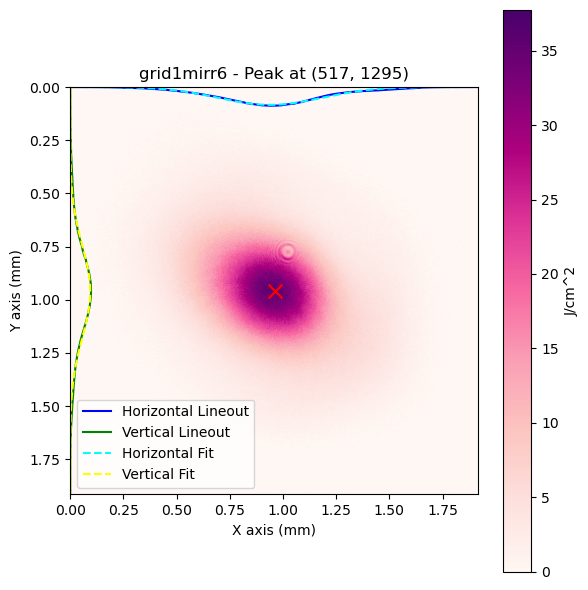

File: grid1mirr6
Horizontal 1/e^2 Diameter: 0.9724 mm
Vertical 1/e^2 Diameter: 0.8623 mm


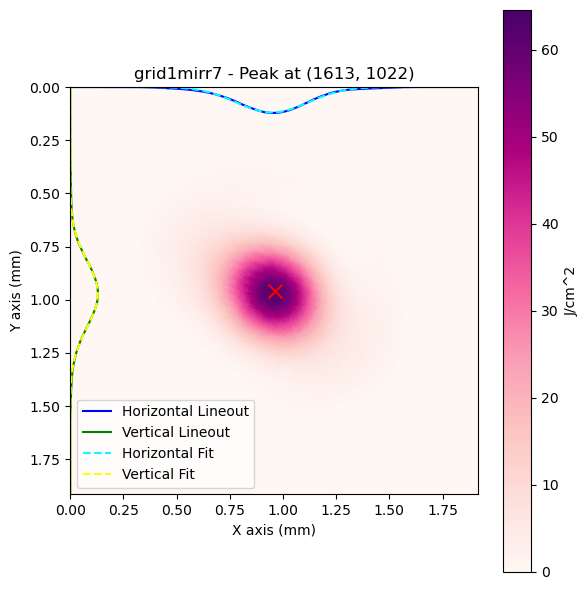

File: grid1mirr7
Horizontal 1/e^2 Diameter: 0.6699 mm
Vertical 1/e^2 Diameter: 0.6299 mm


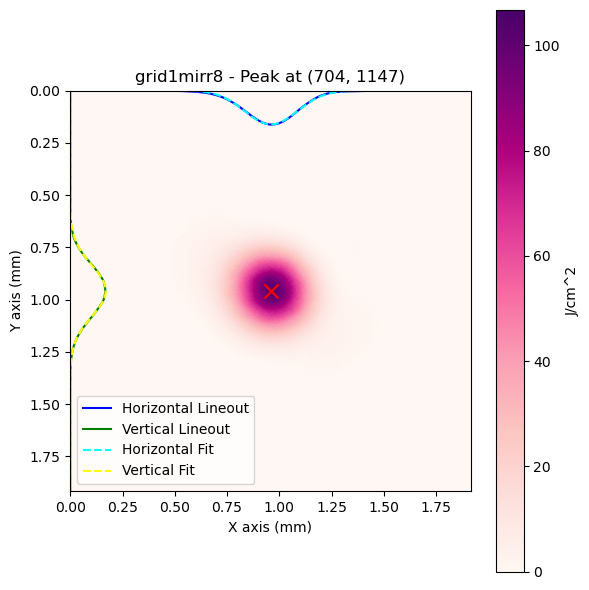

File: grid1mirr8
Horizontal 1/e^2 Diameter: 0.5049 mm
Vertical 1/e^2 Diameter: 0.4917 mm


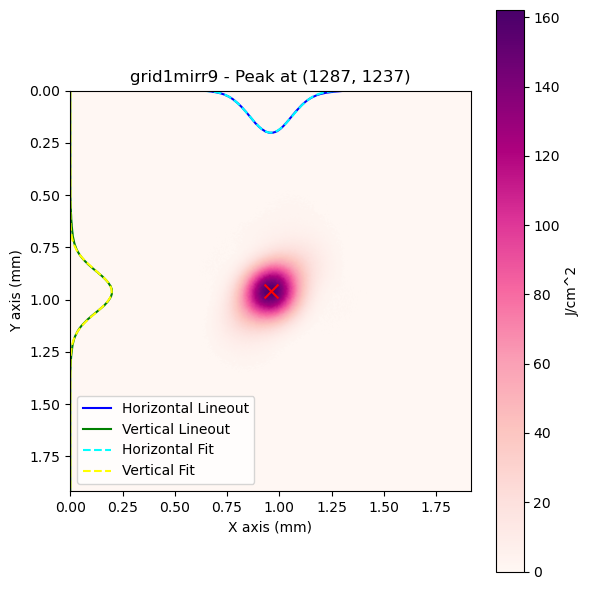

File: grid1mirr9
Horizontal 1/e^2 Diameter: 0.4092 mm
Vertical 1/e^2 Diameter: 0.4102 mm


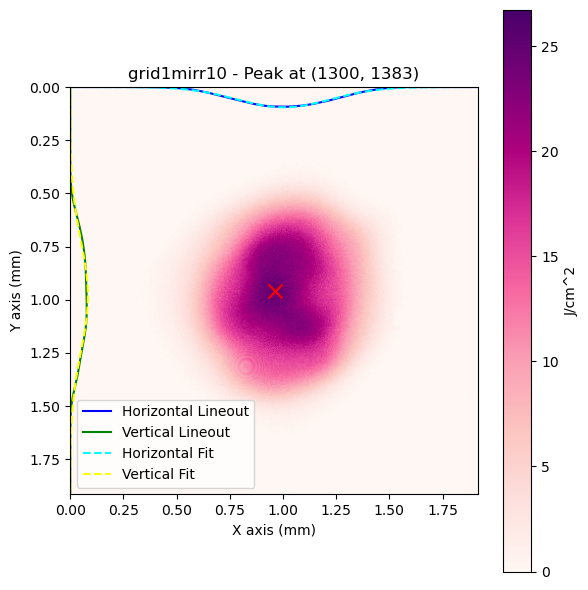

File: grid1mirr10
Horizontal 1/e^2 Diameter: 0.8873 mm
Vertical 1/e^2 Diameter: 1.0393 mm


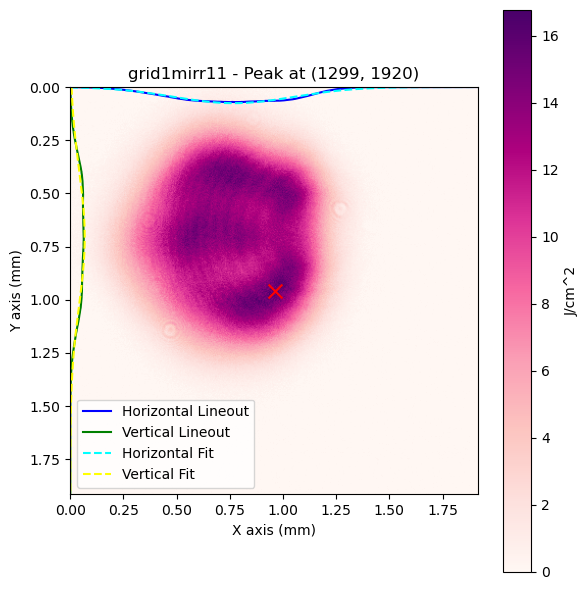

File: grid1mirr11
Horizontal 1/e^2 Diameter: 1.1350 mm
Vertical 1/e^2 Diameter: 1.2846 mm


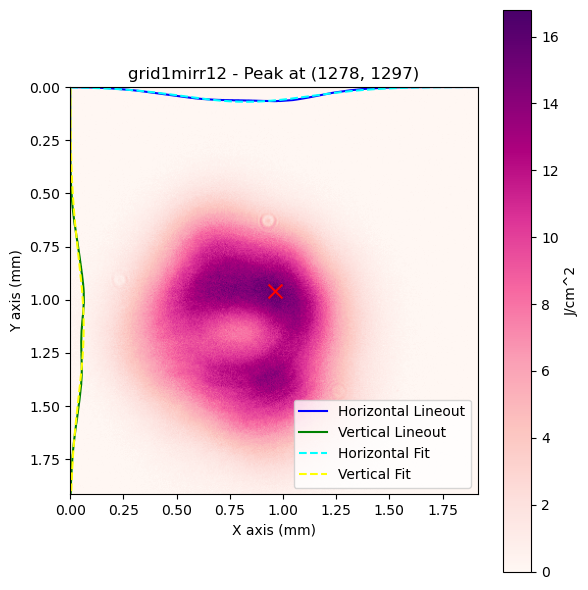

File: grid1mirr12
Horizontal 1/e^2 Diameter: 1.2209 mm
Vertical 1/e^2 Diameter: 1.3561 mm


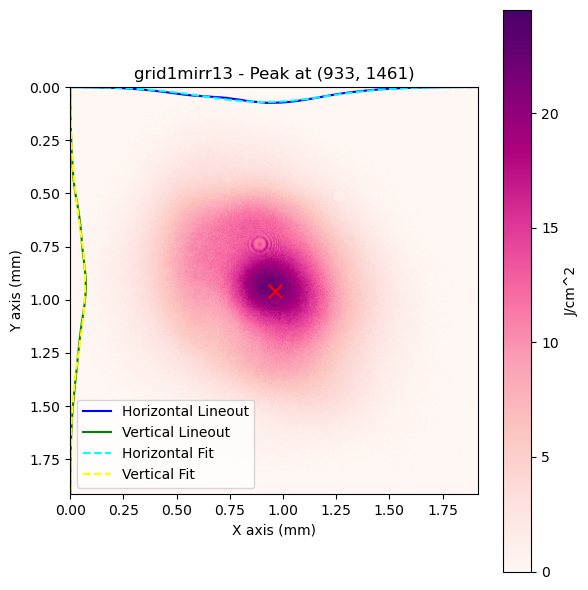

File: grid1mirr13
Horizontal 1/e^2 Diameter: 1.1717 mm
Vertical 1/e^2 Diameter: 1.1885 mm


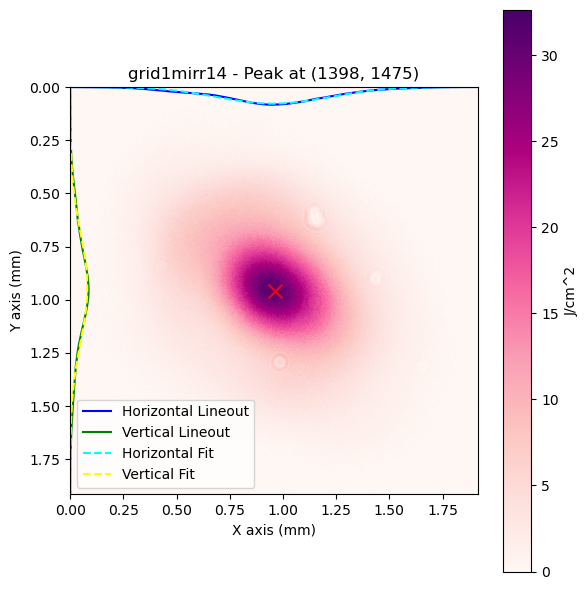

File: grid1mirr14
Horizontal 1/e^2 Diameter: 1.0498 mm
Vertical 1/e^2 Diameter: 1.0240 mm


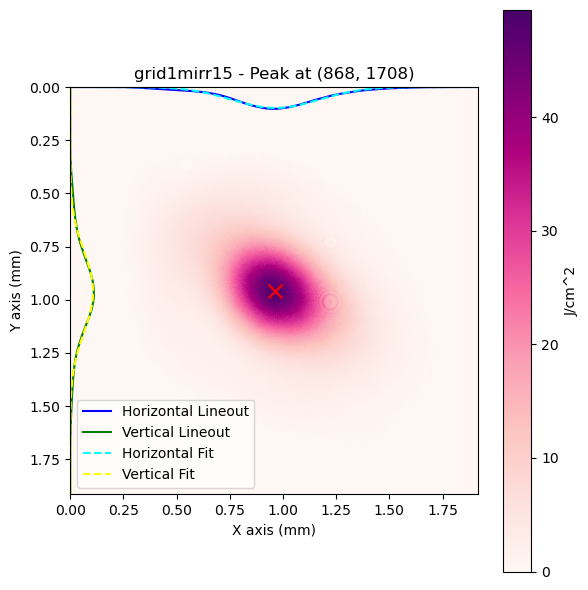

File: grid1mirr15
Horizontal 1/e^2 Diameter: 0.8212 mm
Vertical 1/e^2 Diameter: 0.7522 mm


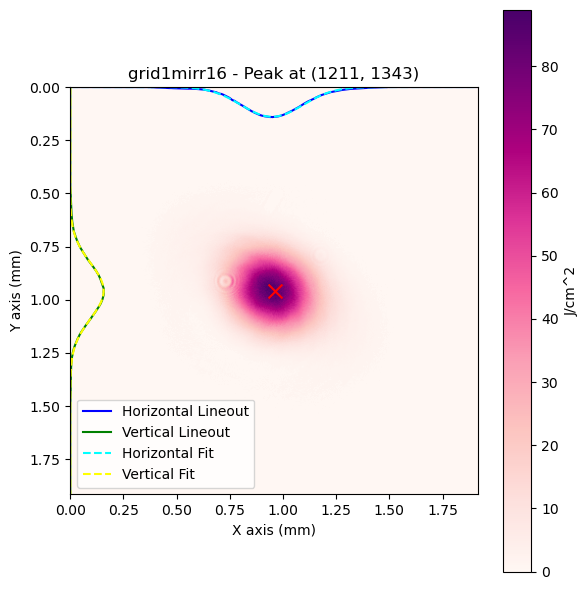

File: grid1mirr16
Horizontal 1/e^2 Diameter: 0.5778 mm
Vertical 1/e^2 Diameter: 0.5245 mm


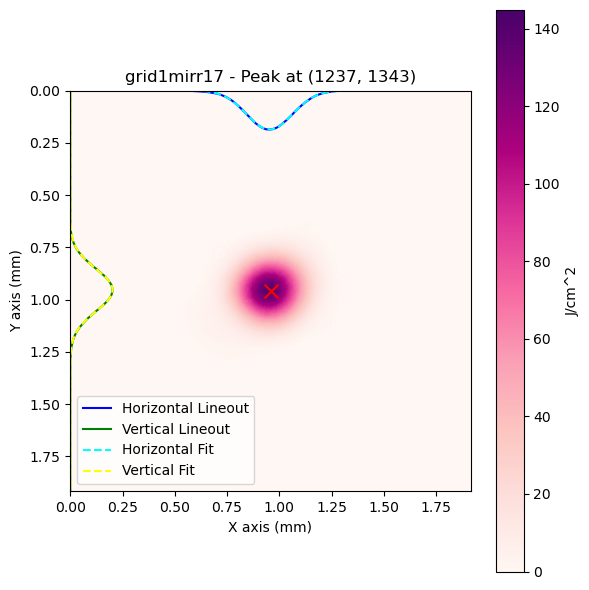

File: grid1mirr17
Horizontal 1/e^2 Diameter: 0.4403 mm
Vertical 1/e^2 Diameter: 0.4084 mm


In [274]:
foc_files_1 = ['grid1mirr6',
               'grid1mirr7',
               'grid1mirr8',
               'grid1mirr9',
               'grid1mirr10',
               'grid1mirr11',
               'grid1mirr12',
               'grid1mirr13',
               'grid1mirr14',
               'grid1mirr15',
               'grid1mirr16',
               'grid1mirr17']

folder_path = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/hc_focus_240625'
max_fluences_1_foc, h_diams_1_foc, v_diams_1_foc = plot_image_files_with_peak(folder_path, foc_files_1,True)

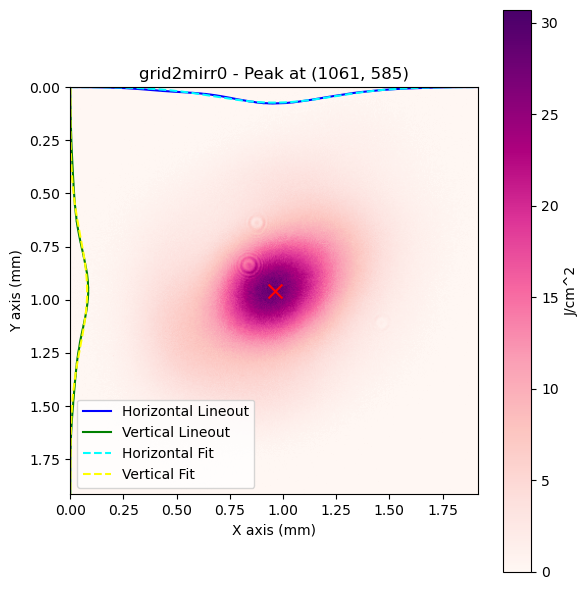

File: grid2mirr0
Horizontal 1/e^2 Diameter: 1.1116 mm
Vertical 1/e^2 Diameter: 1.0185 mm


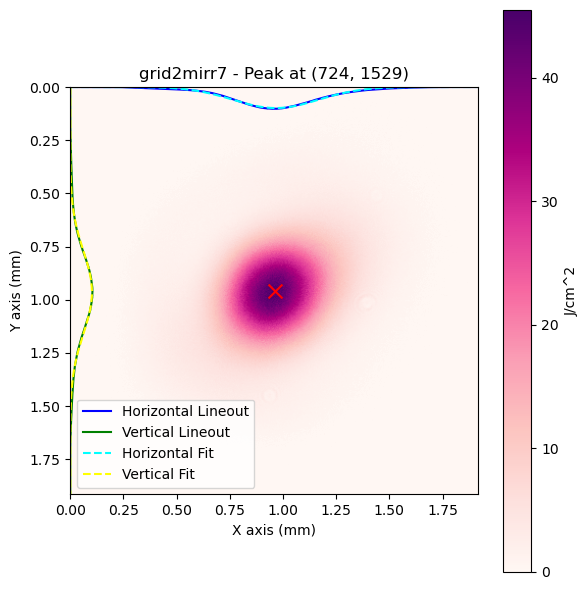

File: grid2mirr7
Horizontal 1/e^2 Diameter: 0.8031 mm
Vertical 1/e^2 Diameter: 0.7804 mm


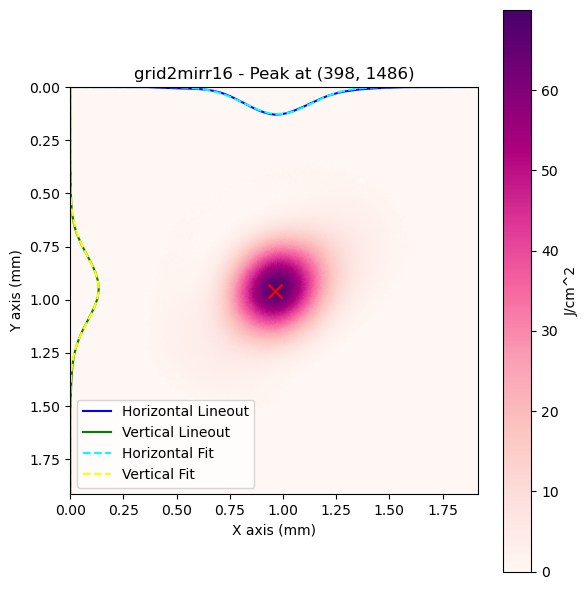

File: grid2mirr16
Horizontal 1/e^2 Diameter: 0.6307 mm
Vertical 1/e^2 Diameter: 0.6145 mm


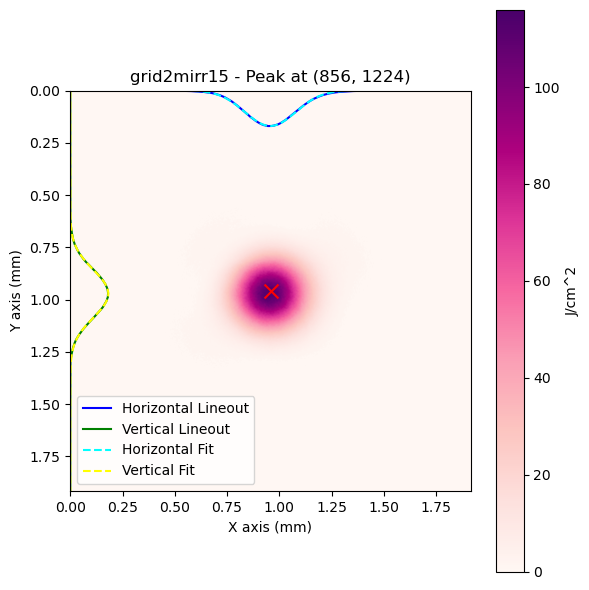

File: grid2mirr15
Horizontal 1/e^2 Diameter: 0.4861 mm
Vertical 1/e^2 Diameter: 0.4590 mm


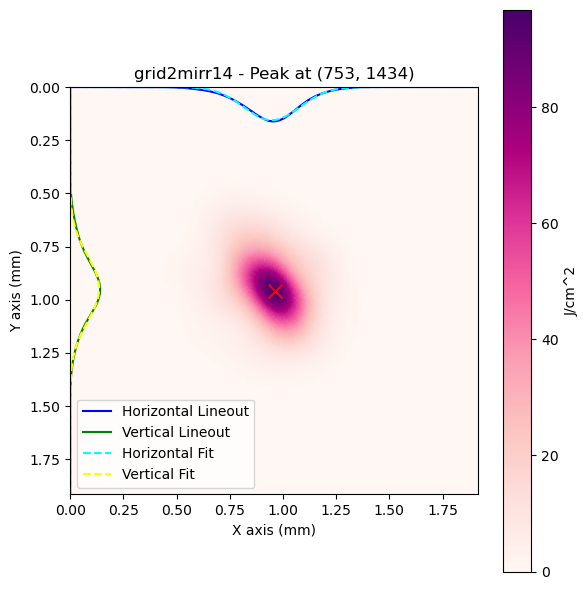

File: grid2mirr14
Horizontal 1/e^2 Diameter: 0.5242 mm
Vertical 1/e^2 Diameter: 0.6077 mm


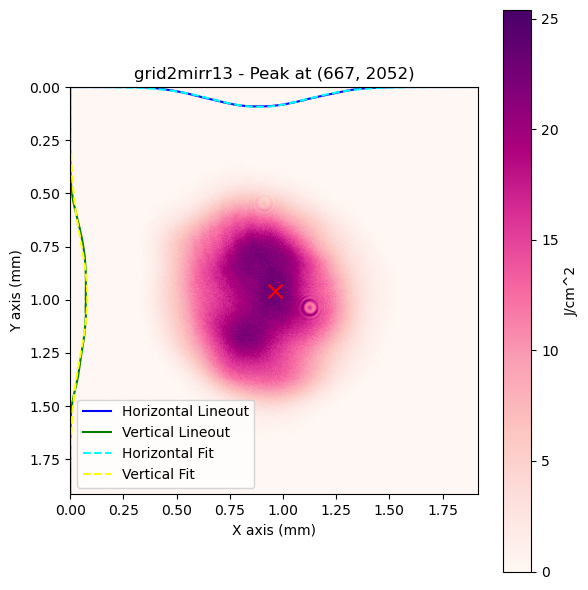

File: grid2mirr13
Horizontal 1/e^2 Diameter: 0.8986 mm
Vertical 1/e^2 Diameter: 1.0714 mm


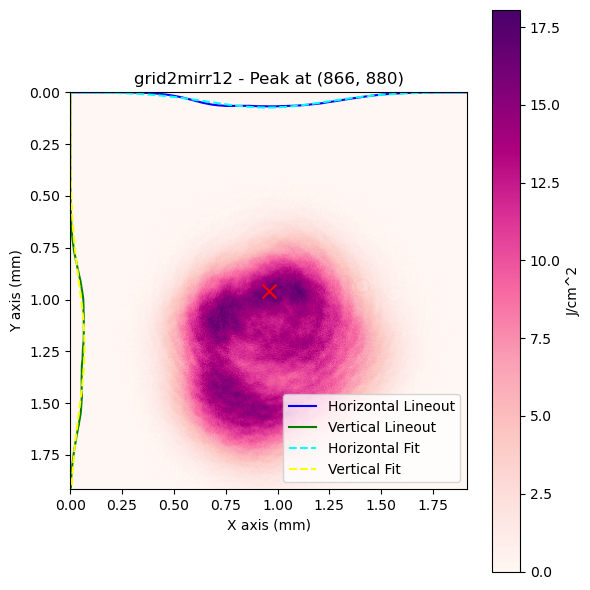

File: grid2mirr12
Horizontal 1/e^2 Diameter: 1.1658 mm
Vertical 1/e^2 Diameter: 1.2638 mm


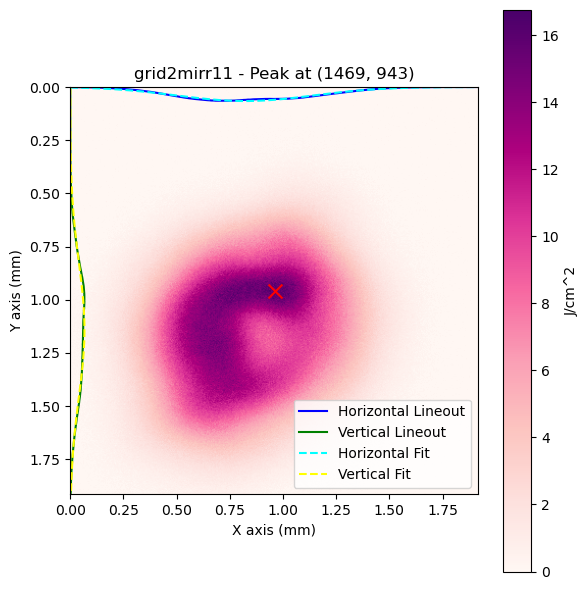

File: grid2mirr11
Horizontal 1/e^2 Diameter: 1.2810 mm
Vertical 1/e^2 Diameter: 1.2677 mm


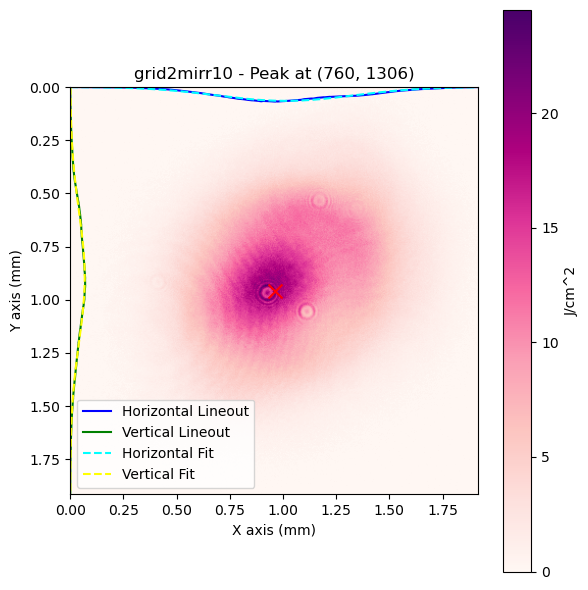

File: grid2mirr10
Horizontal 1/e^2 Diameter: 1.2816 mm
Vertical 1/e^2 Diameter: 1.2234 mm


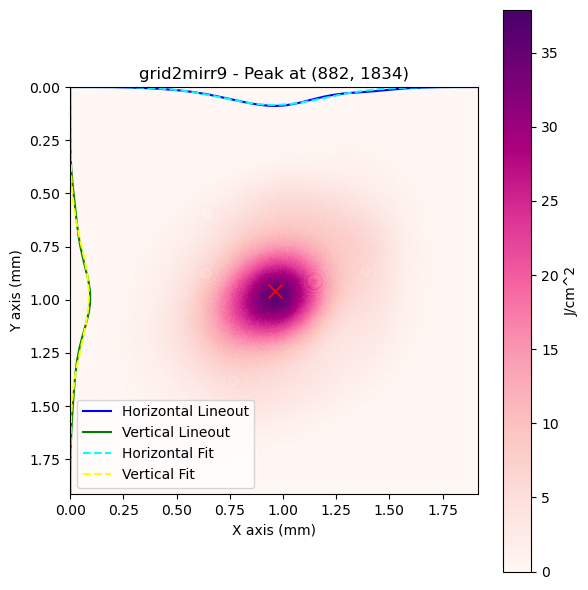

File: grid2mirr9
Horizontal 1/e^2 Diameter: 0.9664 mm
Vertical 1/e^2 Diameter: 0.9280 mm


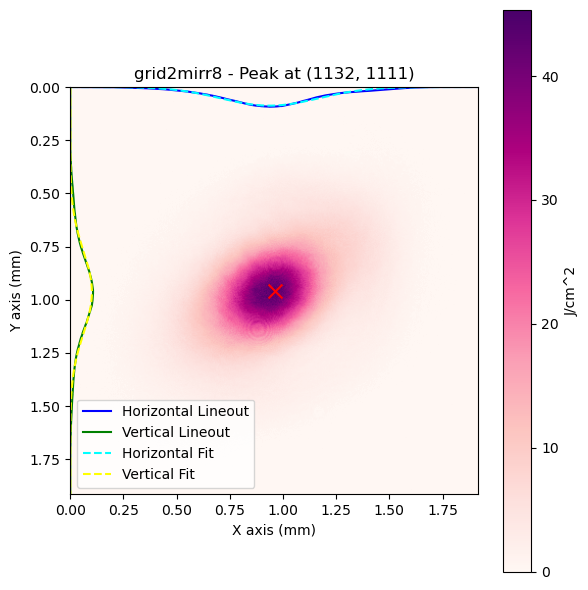

File: grid2mirr8
Horizontal 1/e^2 Diameter: 0.9162 mm
Vertical 1/e^2 Diameter: 0.7802 mm


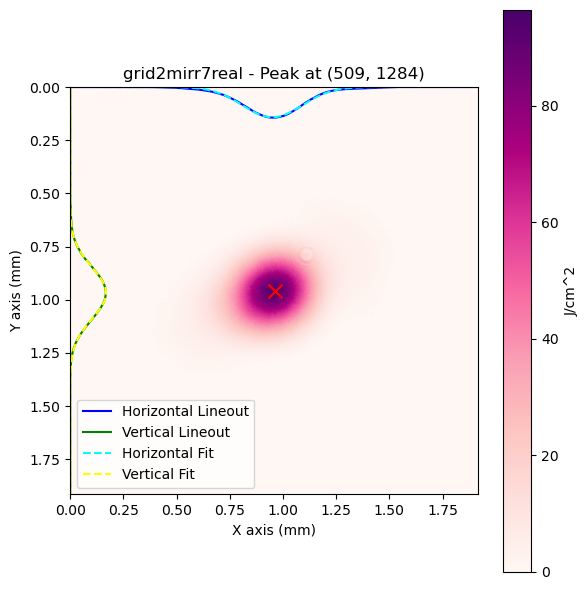

File: grid2mirr7real
Horizontal 1/e^2 Diameter: 0.5585 mm
Vertical 1/e^2 Diameter: 0.4893 mm


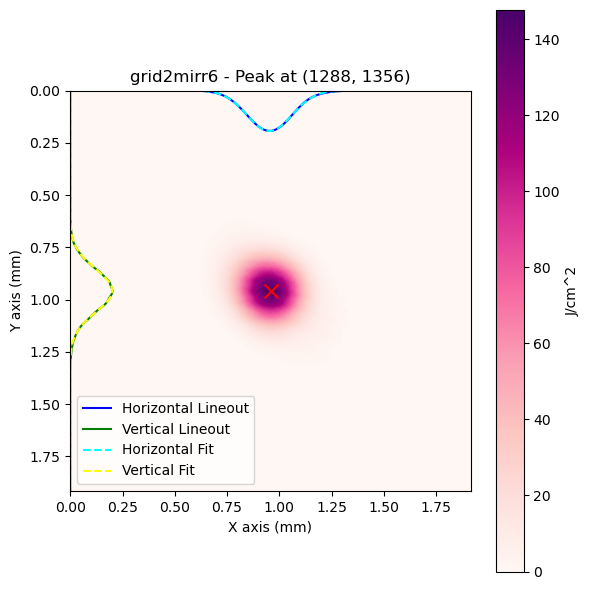

File: grid2mirr6
Horizontal 1/e^2 Diameter: 0.4298 mm
Vertical 1/e^2 Diameter: 0.4152 mm


In [275]:
foc_files_2 = ['grid2mirr0',
               'grid2mirr7',
               'grid2mirr16',
               'grid2mirr15',
               'grid2mirr14',
               'grid2mirr13',
               'grid2mirr12',
               'grid2mirr11',
               'grid2mirr10',
               'grid2mirr9',
               'grid2mirr8',
               'grid2mirr7real',
               'grid2mirr6']

folder_path = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/hc_focus_240625'
max_fluences_2_foc, h_diams_2_foc, v_diams_2_foc = plot_image_files_with_peak(folder_path, foc_files_2, True)

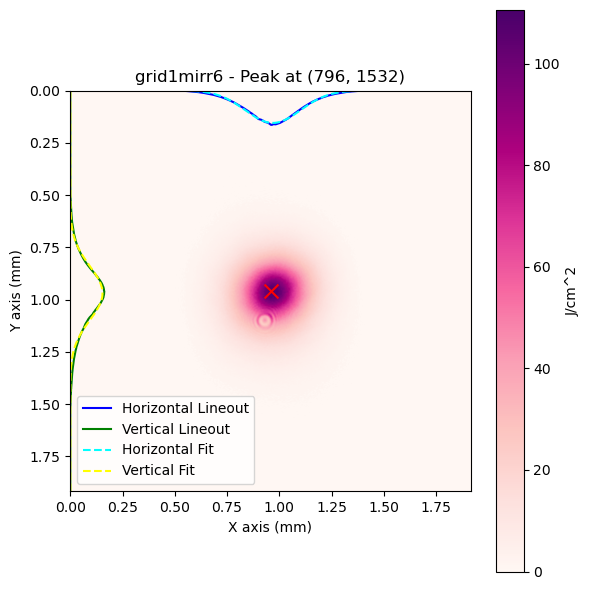

File: grid1mirr6
Horizontal 1/e^2 Diameter: 0.5295 mm
Vertical 1/e^2 Diameter: 0.5188 mm


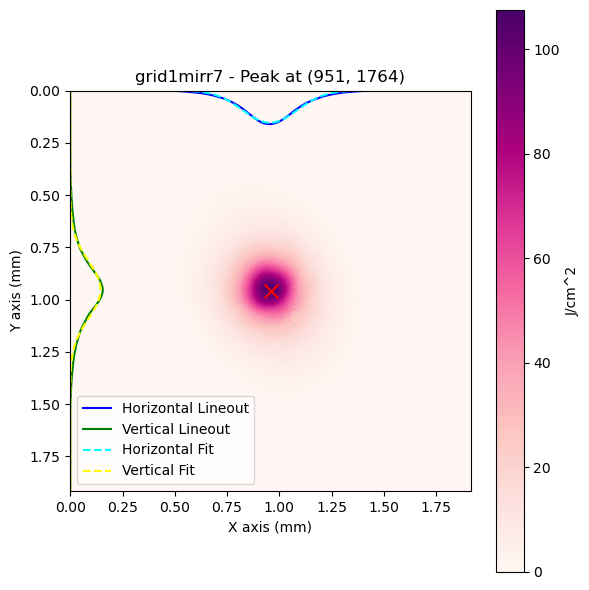

File: grid1mirr7
Horizontal 1/e^2 Diameter: 0.5227 mm
Vertical 1/e^2 Diameter: 0.5432 mm


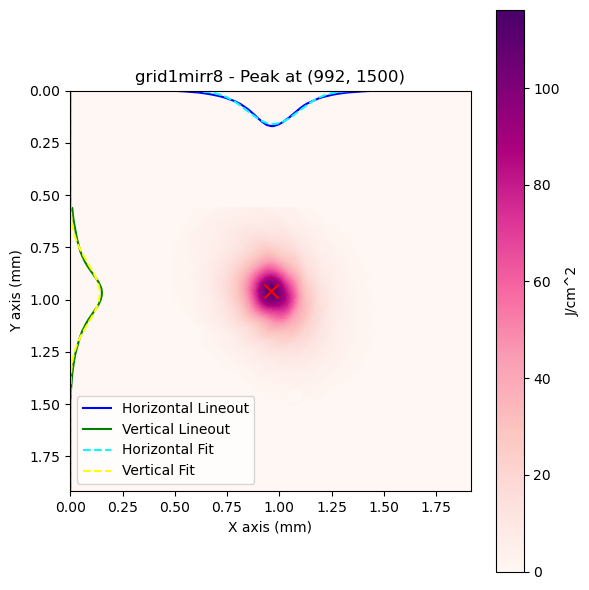

File: grid1mirr8
Horizontal 1/e^2 Diameter: 0.4970 mm
Vertical 1/e^2 Diameter: 0.5695 mm


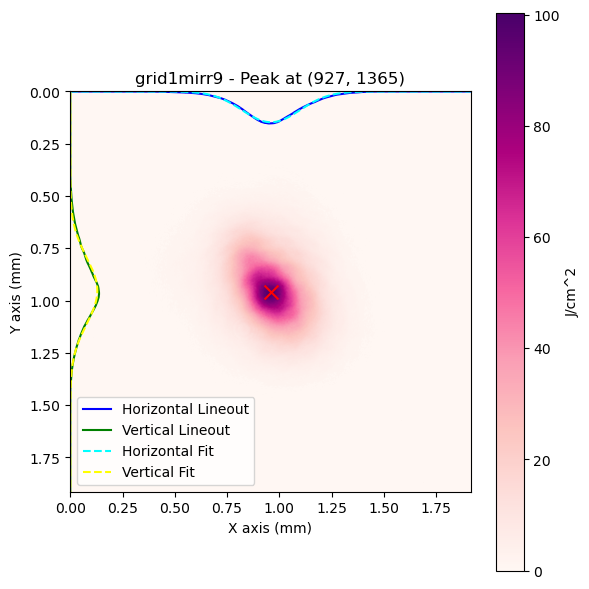

File: grid1mirr9
Horizontal 1/e^2 Diameter: 0.5519 mm
Vertical 1/e^2 Diameter: 0.6339 mm


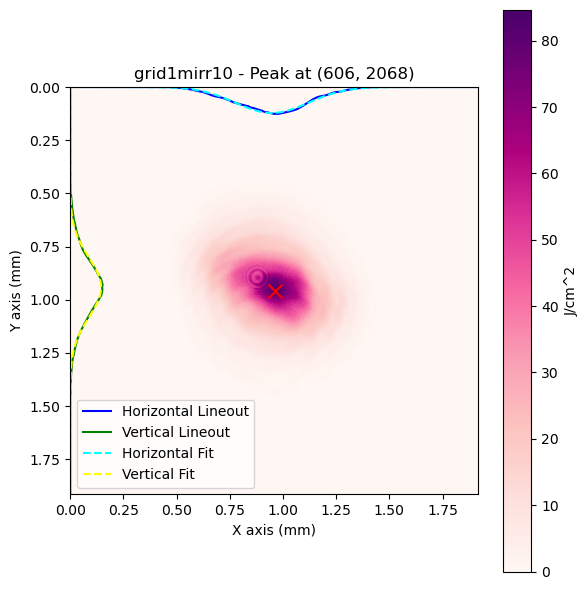

File: grid1mirr10
Horizontal 1/e^2 Diameter: 0.6850 mm
Vertical 1/e^2 Diameter: 0.5620 mm


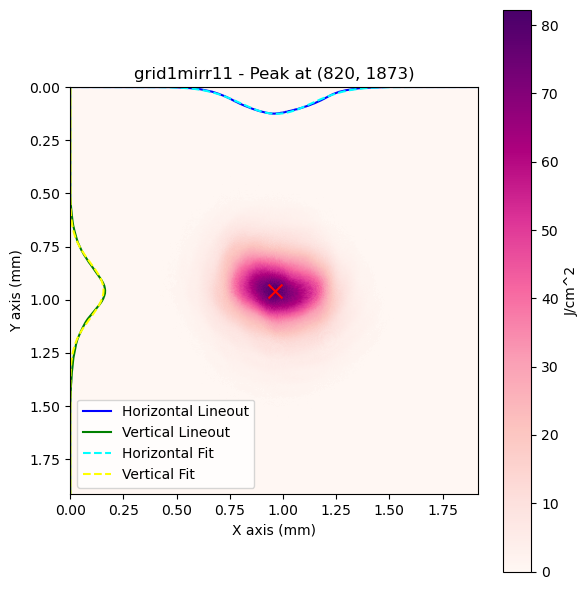

File: grid1mirr11
Horizontal 1/e^2 Diameter: 0.6689 mm
Vertical 1/e^2 Diameter: 0.5150 mm


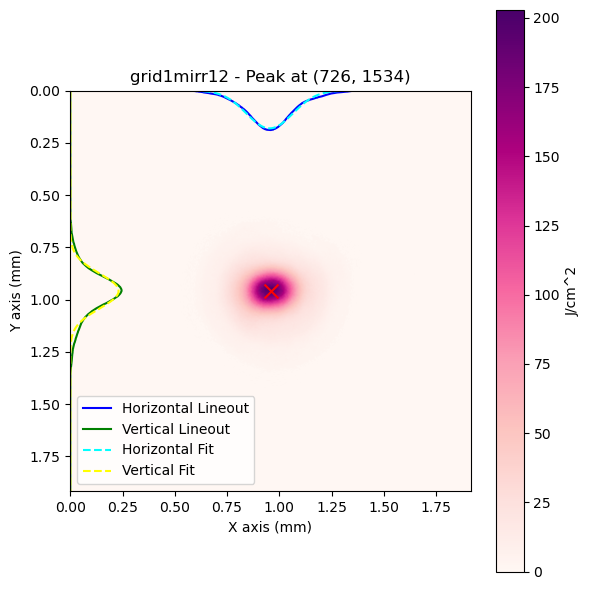

File: grid1mirr12
Horizontal 1/e^2 Diameter: 0.4439 mm
Vertical 1/e^2 Diameter: 0.3357 mm


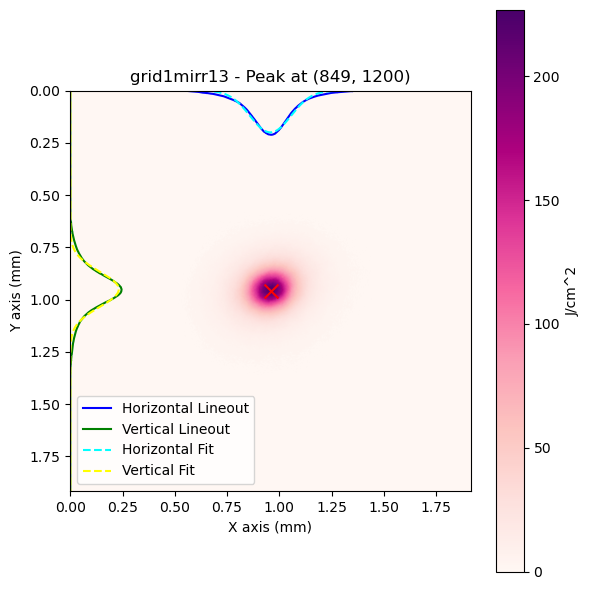

File: grid1mirr13
Horizontal 1/e^2 Diameter: 0.3909 mm
Vertical 1/e^2 Diameter: 0.3379 mm


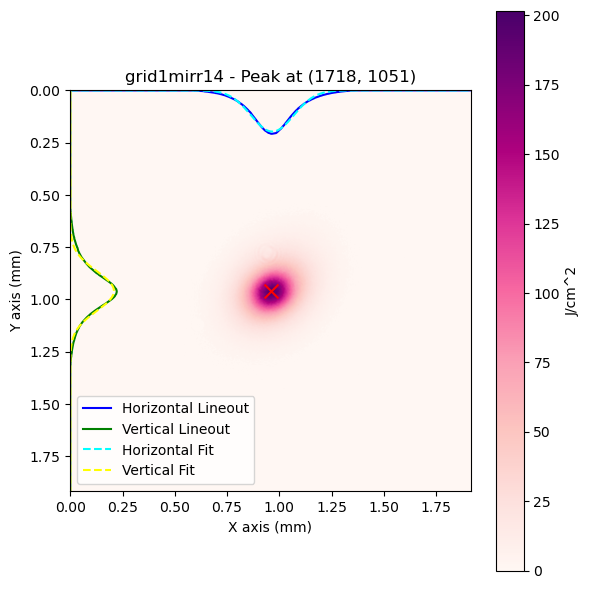

File: grid1mirr14
Horizontal 1/e^2 Diameter: 0.4077 mm
Vertical 1/e^2 Diameter: 0.3803 mm


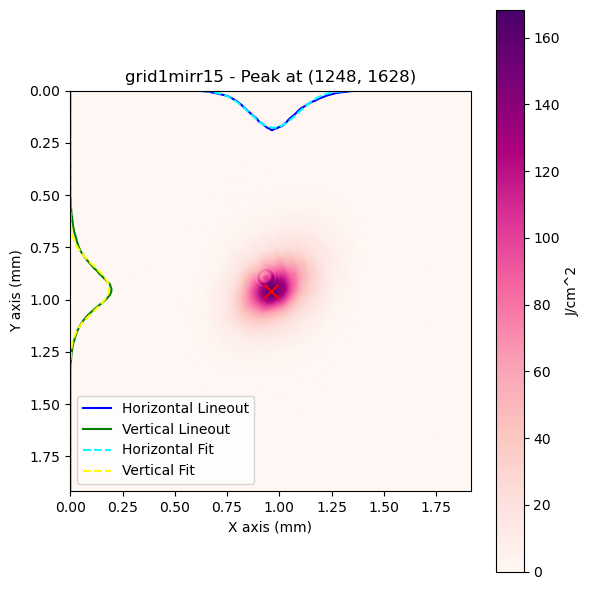

File: grid1mirr15
Horizontal 1/e^2 Diameter: 0.4600 mm
Vertical 1/e^2 Diameter: 0.4309 mm


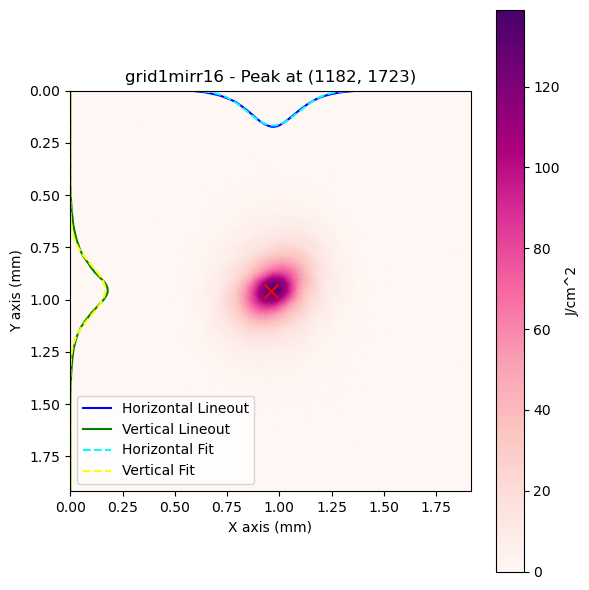

File: grid1mirr16
Horizontal 1/e^2 Diameter: 0.4890 mm
Vertical 1/e^2 Diameter: 0.4744 mm


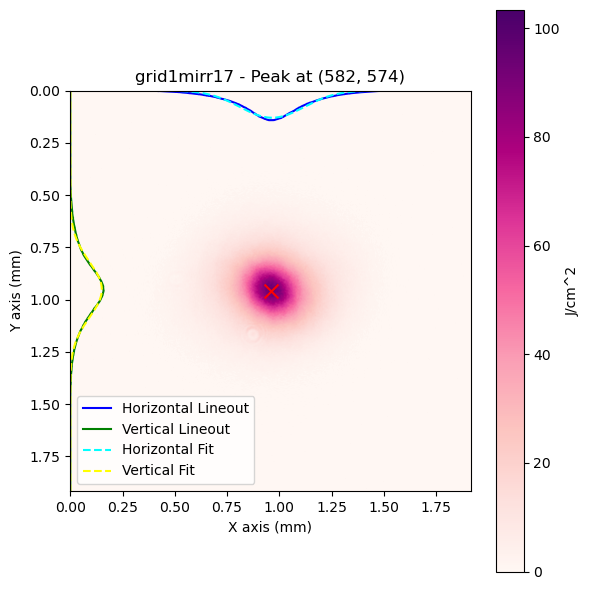

File: grid1mirr17
Horizontal 1/e^2 Diameter: 0.6113 mm
Vertical 1/e^2 Diameter: 0.5343 mm


In [276]:
foc_files_1_orig = ['grid1mirr6',
               'grid1mirr7',
               'grid1mirr8',
               'grid1mirr9',
               'grid1mirr10',
               'grid1mirr11',
               'grid1mirr12',
               'grid1mirr13',
               'grid1mirr14',
               'grid1mirr15',
               'grid1mirr16',
               'grid1mirr17']

folder_path = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/hc_focus'
max_fluences_1_foc_orig, h_diams_1_foc_orig, v_diams_1_foc_orig = plot_image_files_with_peak(folder_path, foc_files_1_orig,False)

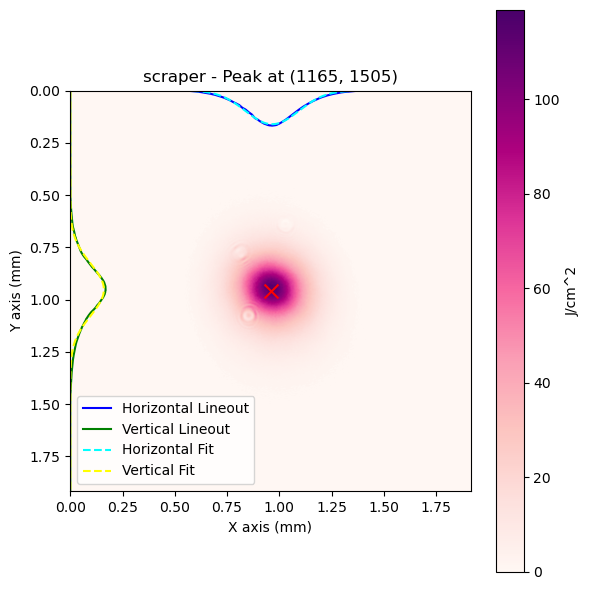

File: scraper
Horizontal 1/e^2 Diameter: 0.5088 mm
Vertical 1/e^2 Diameter: 0.4986 mm


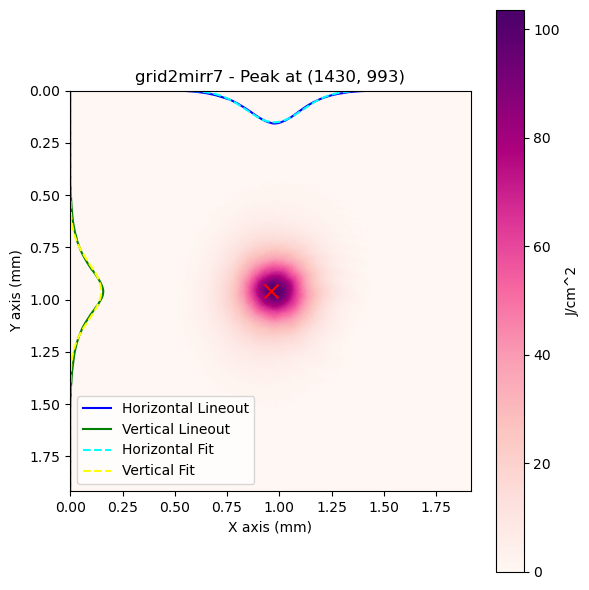

File: grid2mirr7
Horizontal 1/e^2 Diameter: 0.5387 mm
Vertical 1/e^2 Diameter: 0.5397 mm


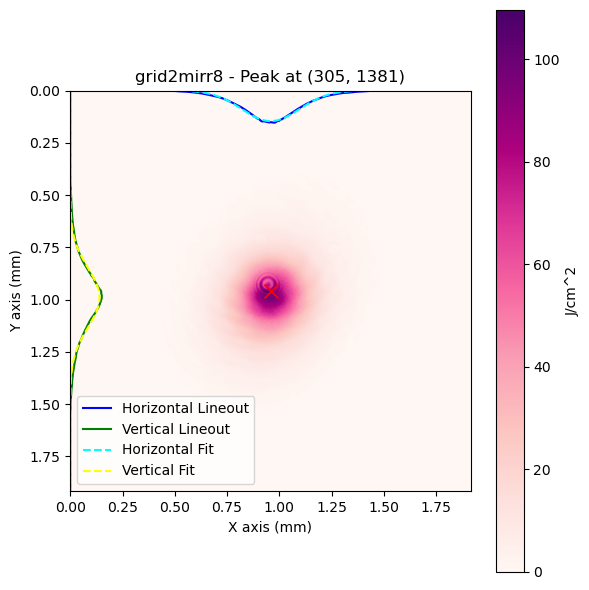

File: grid2mirr8
Horizontal 1/e^2 Diameter: 0.5524 mm
Vertical 1/e^2 Diameter: 0.5706 mm


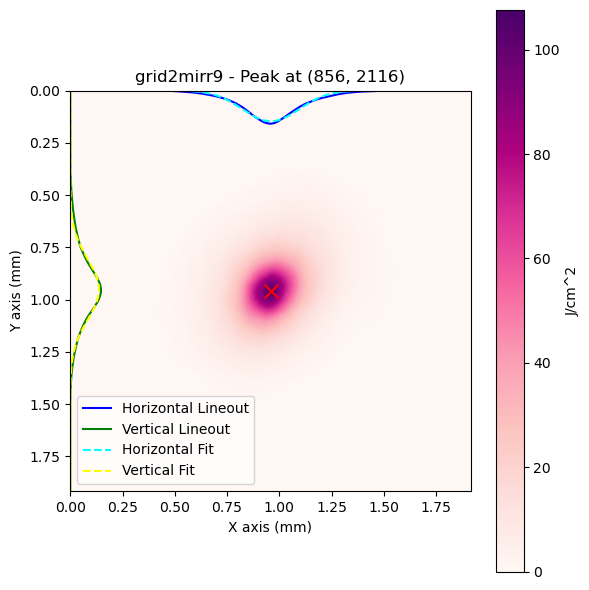

File: grid2mirr9
Horizontal 1/e^2 Diameter: 0.5422 mm
Vertical 1/e^2 Diameter: 0.5827 mm


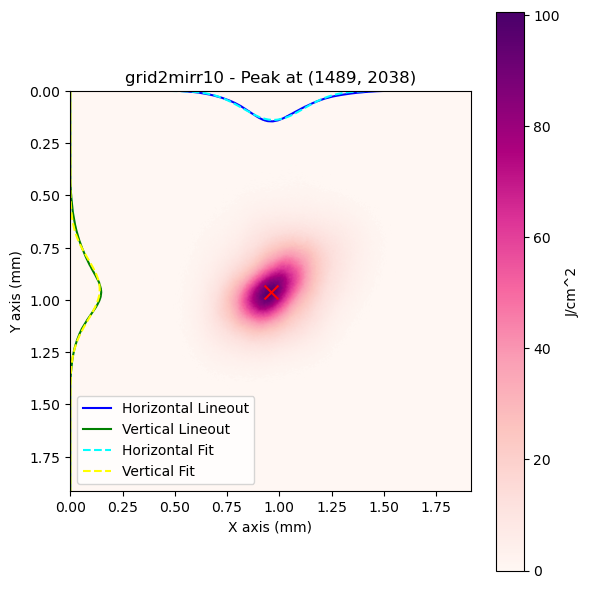

File: grid2mirr10
Horizontal 1/e^2 Diameter: 0.5840 mm
Vertical 1/e^2 Diameter: 0.5804 mm


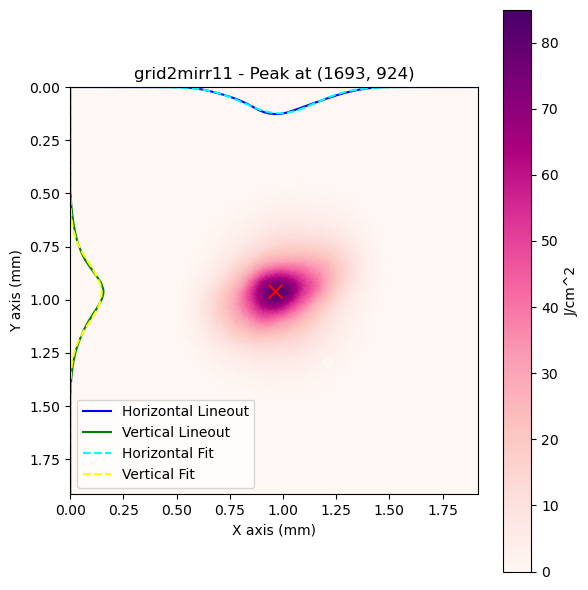

File: grid2mirr11
Horizontal 1/e^2 Diameter: 0.6754 mm
Vertical 1/e^2 Diameter: 0.5511 mm


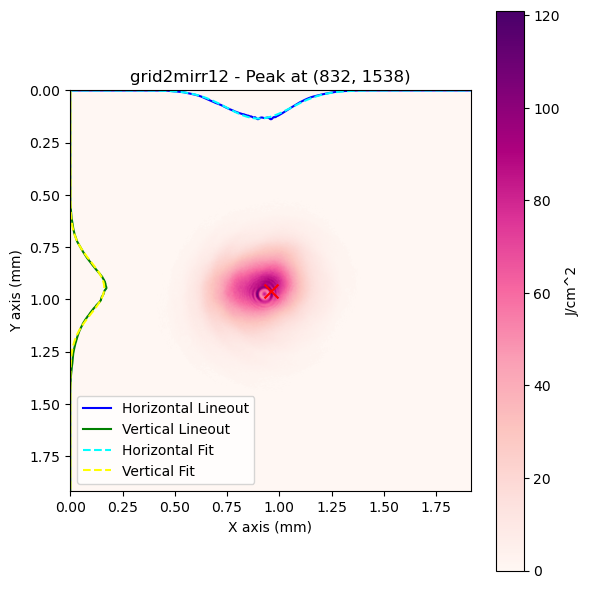

File: grid2mirr12
Horizontal 1/e^2 Diameter: 0.6216 mm
Vertical 1/e^2 Diameter: 0.4993 mm


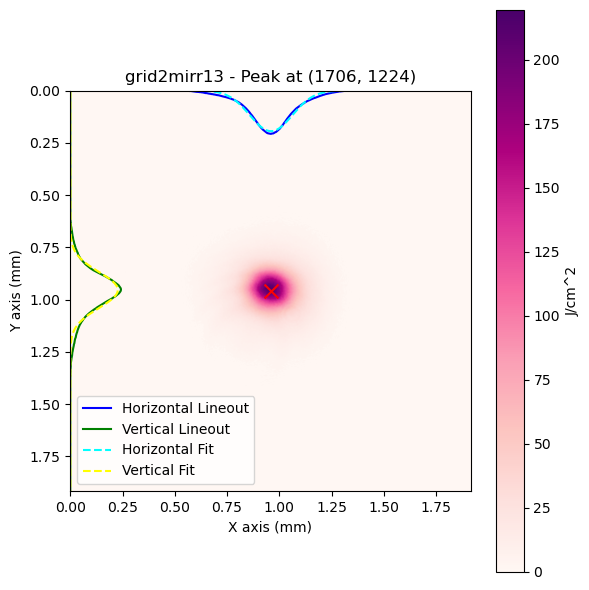

File: grid2mirr13
Horizontal 1/e^2 Diameter: 0.4069 mm
Vertical 1/e^2 Diameter: 0.3440 mm


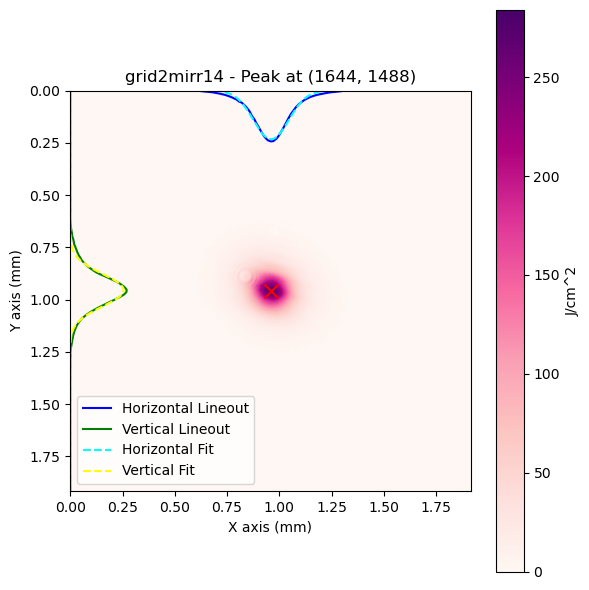

File: grid2mirr14
Horizontal 1/e^2 Diameter: 0.3385 mm
Vertical 1/e^2 Diameter: 0.3107 mm


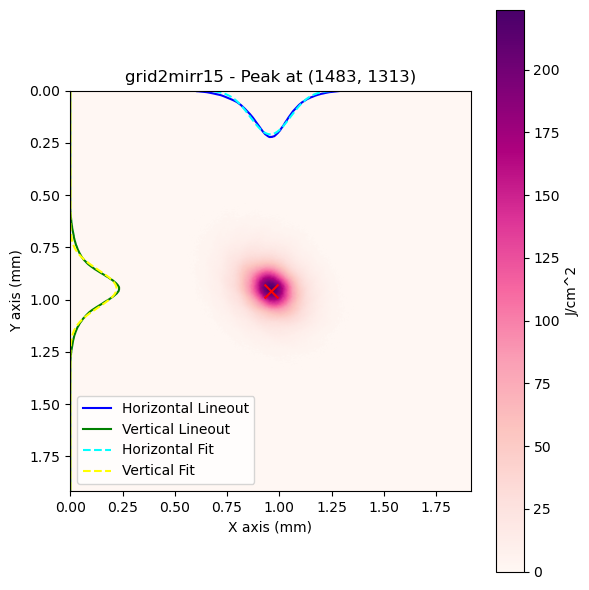

File: grid2mirr15
Horizontal 1/e^2 Diameter: 0.3813 mm
Vertical 1/e^2 Diameter: 0.3589 mm


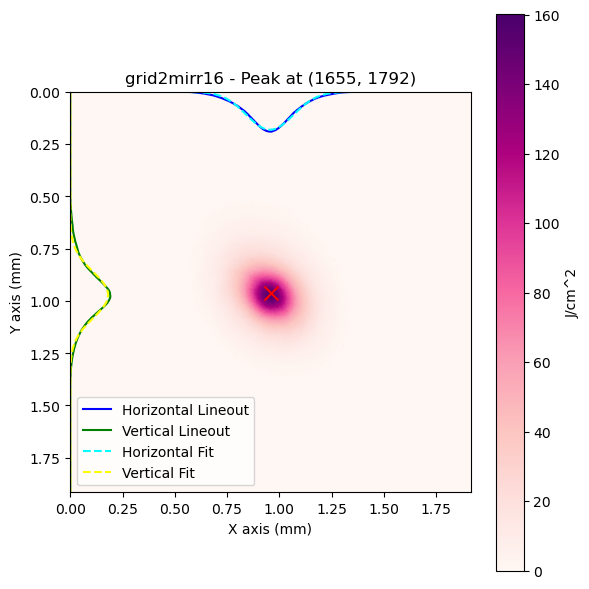

File: grid2mirr16
Horizontal 1/e^2 Diameter: 0.4493 mm
Vertical 1/e^2 Diameter: 0.4409 mm


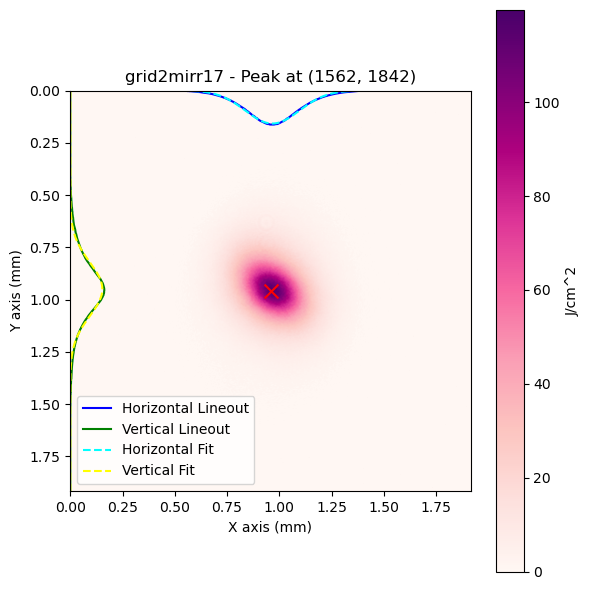

File: grid2mirr17
Horizontal 1/e^2 Diameter: 0.5181 mm
Vertical 1/e^2 Diameter: 0.5184 mm


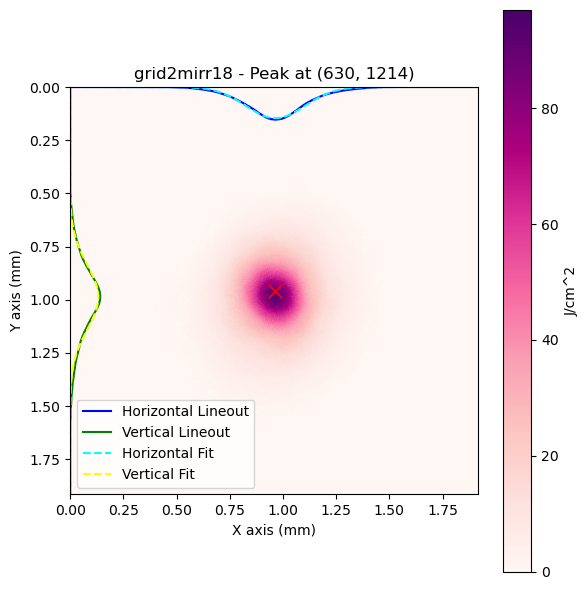

File: grid2mirr18
Horizontal 1/e^2 Diameter: 0.5518 mm
Vertical 1/e^2 Diameter: 0.6114 mm


In [277]:
foc_files_2_orig = ['scraper',
               'grid2mirr7',
               'grid2mirr8',
               'grid2mirr9',
               'grid2mirr10',
               'grid2mirr11',
               'grid2mirr12',
               'grid2mirr13',
               'grid2mirr14',
               'grid2mirr15',
               'grid2mirr16',
               'grid2mirr17',
               'grid2mirr18']

folder_path = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/hc_focus'
max_fluences_2_foc_orig, h_diams_2_foc_orig, v_diams_2_foc_orig = plot_image_files_with_peak(folder_path, foc_files_2_orig,False)

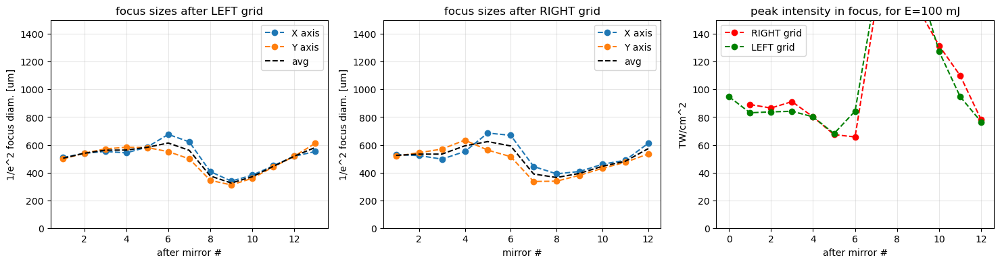

In [133]:
fig, ax = plt.subplots(1,3,figsize=(18, 4))

mirrs_1_foc_orig = [1,2,3,4,5,6,7,8,9,10,11,12]
mirrs_2_foc_orig = [1,2,3,4,5,6,7,8,9,10,11,12,13]

avg_foc_1_orig = (np.array(h_diams_1_foc_orig)+np.array(v_diams_1_foc_orig))/2 #find avg 
avg_foc_2_orig = (np.array(h_diams_2_foc_orig)+np.array(v_diams_2_foc_orig))/2

ax[0].plot(mirrs_2_foc_orig,np.array(h_diams_2_foc_orig)*1000,'--o',label='X axis')
ax[0].plot(mirrs_2_foc_orig,np.array(v_diams_2_foc_orig)*1000,'--o',label='Y axis')
ax[0].plot(mirrs_2_foc_orig,avg_foc_2_orig*1000,color='black',ls='dashed',label='avg')

ax[0].set_ylabel('1/e^2 focus diam. [um]')
ax[0].set_xlabel('after mirror #')
ax[0].legend()
ax[0].set_ylim(0,1500)
ax[0].set_title('focus sizes after LEFT grid')
ax[0].grid(alpha=0.3)

ax[1].plot(mirrs_1_foc_orig,np.array(h_diams_1_foc_orig)*1000,'--o',label='X axis')
ax[1].plot(mirrs_1_foc_orig,np.array(v_diams_1_foc_orig)*1000,'--o',label='Y axis')
ax[1].plot(mirrs_1_foc_orig,avg_foc_1_orig*1000,color='black',ls='dashed',label='avg')

ax[1].set_ylabel('1/e^2 focus diam. [um]')
ax[1].set_xlabel('mirror #')
ax[1].legend()
ax[1].set_ylim(0,1500)
ax[1].set_title('focus sizes after RIGHT grid')
ax[1].grid(alpha=0.3)

beam_t = 1.2e-12 #ps pulse duration

ax[2].plot(mirrs_1_foc_orig,max_fluences_1_foc_orig/beam_t*1e-12,'--o',color='red',label='RIGHT grid')
ax[2].plot(np.array(mirrs_2_foc_orig)-1,max_fluences_2_foc_orig/beam_t*1e-12,'--o',color='green',label='LEFT grid')
ax[2].set_ylim(0,150)
ax[2].set_xlabel('after mirror #')
ax[2].set_title('peak intensity in focus, for E={:.0f} mJ'.format(E_beam*1000))
ax[2].set_ylabel('TW/cm^2')
ax[2].grid(alpha=0.3)
ax[2].legend()

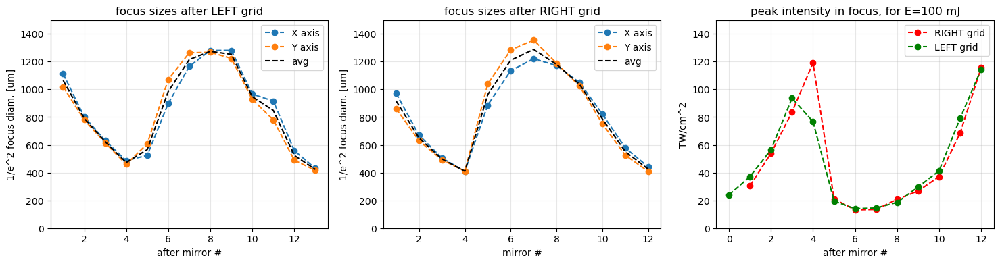

In [134]:
fig, ax = plt.subplots(1,3,figsize=(18, 4))

mirrs_1_foc = [1,2,3,4,5,6,7,8,9,10,11,12]
mirrs_2_foc = [1,2,3,4,5,6,7,8,9,10,11,12,13]

avg_foc_1 = (np.array(h_diams_1_foc)+np.array(v_diams_1_foc))/2 #find avg 
avg_foc_2 = (np.array(h_diams_2_foc)+np.array(v_diams_2_foc))/2

ax[0].plot(mirrs_2_foc,np.array(h_diams_2_foc)*1000,'--o',label='X axis')
ax[0].plot(mirrs_2_foc,np.array(v_diams_2_foc)*1000,'--o',label='Y axis')
ax[0].plot(mirrs_2_foc,avg_foc_2*1000,color='black',ls='dashed',label='avg')

ax[0].set_ylabel('1/e^2 focus diam. [um]')
ax[0].set_xlabel('after mirror #')
ax[0].legend()
ax[0].set_ylim(0,1500)
ax[0].set_title('focus sizes after LEFT grid')
ax[0].grid(alpha=0.3)

ax[1].plot(mirrs_1_foc,np.array(h_diams_1_foc)*1000,'--o',label='X axis')
ax[1].plot(mirrs_1_foc,np.array(v_diams_1_foc)*1000,'--o',label='Y axis')
ax[1].plot(mirrs_1_foc,avg_foc_1*1000,color='black',ls='dashed',label='avg')

ax[1].set_ylabel('1/e^2 focus diam. [um]')
ax[1].set_xlabel('mirror #')
ax[1].legend()
ax[1].set_ylim(0,1500)
ax[1].set_title('focus sizes after RIGHT grid')
ax[1].grid(alpha=0.3)

beam_t = 1.2e-12 #ps pulse duration

ax[2].plot(mirrs_1_foc,max_fluences_1_foc/beam_t*1e-12,'--o',color='red',label='RIGHT grid')
ax[2].plot(np.array(mirrs_2_foc)-1,max_fluences_2_foc/beam_t*1e-12,'--o',color='green',label='LEFT grid')
ax[2].set_ylim(0,150)
ax[2].set_xlabel('after mirror #')
ax[2].set_title('peak intensity in focus, for E={:.0f} mJ'.format(E_beam*1000))
ax[2].set_ylabel('TW/cm^2')
ax[2].grid(alpha=0.3)
ax[2].legend()

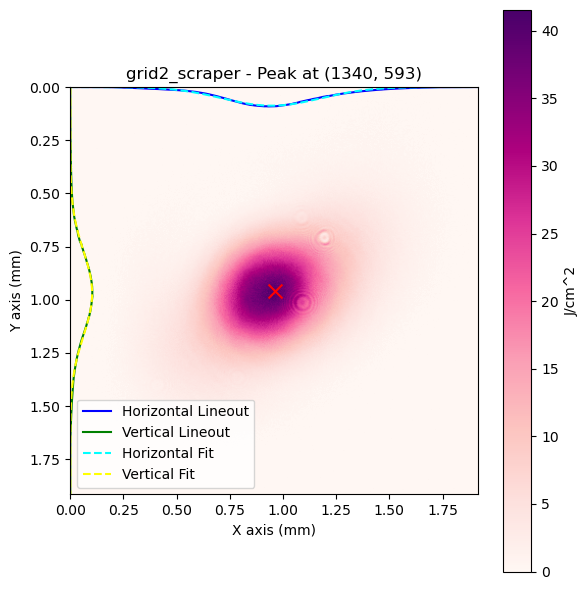

File: grid2_scraper
Horizontal 1/e^2 Diameter: 0.9213 mm
Vertical 1/e^2 Diameter: 0.7935 mm


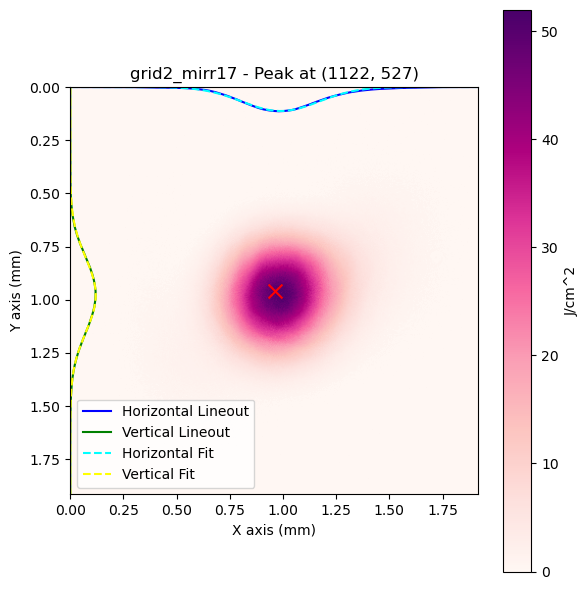

File: grid2_mirr17
Horizontal 1/e^2 Diameter: 0.7239 mm
Vertical 1/e^2 Diameter: 0.7028 mm


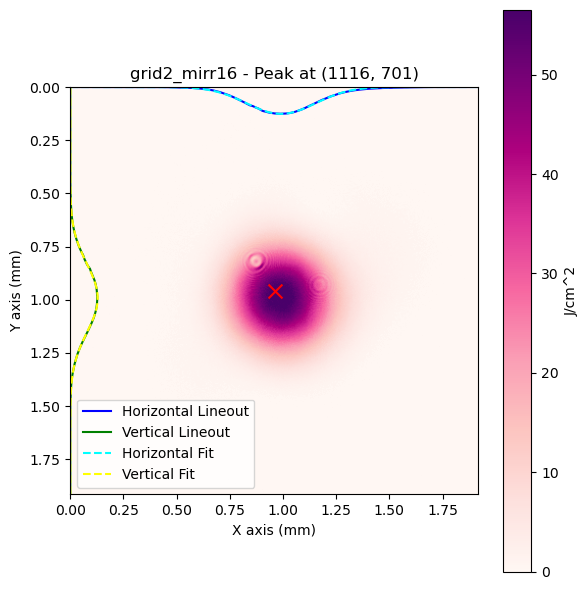

File: grid2_mirr16
Horizontal 1/e^2 Diameter: 0.6472 mm
Vertical 1/e^2 Diameter: 0.6461 mm


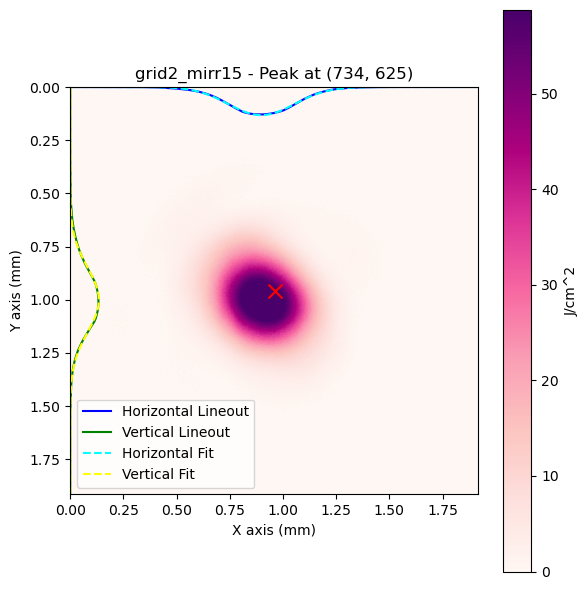

File: grid2_mirr15
Horizontal 1/e^2 Diameter: 0.6227 mm
Vertical 1/e^2 Diameter: 0.6105 mm


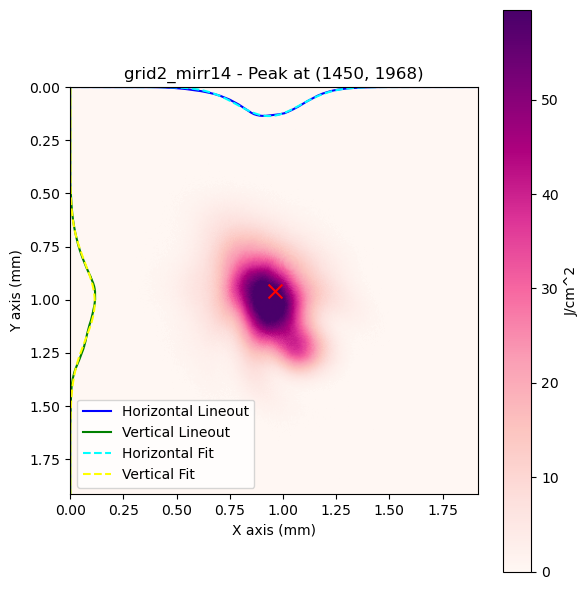

File: grid2_mirr14
Horizontal 1/e^2 Diameter: 0.6011 mm
Vertical 1/e^2 Diameter: 0.7257 mm


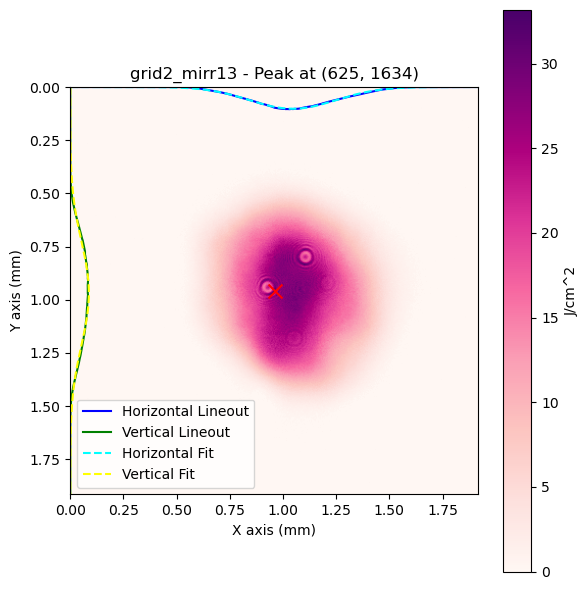

File: grid2_mirr13
Horizontal 1/e^2 Diameter: 0.8073 mm
Vertical 1/e^2 Diameter: 0.9642 mm


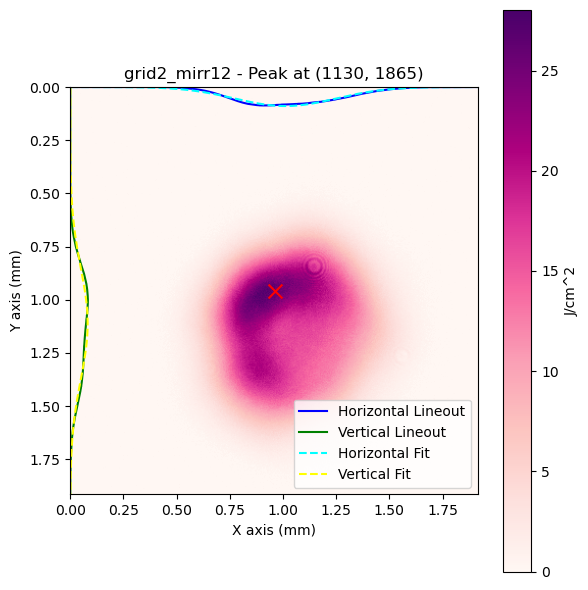

File: grid2_mirr12
Horizontal 1/e^2 Diameter: 0.9504 mm
Vertical 1/e^2 Diameter: 1.0476 mm


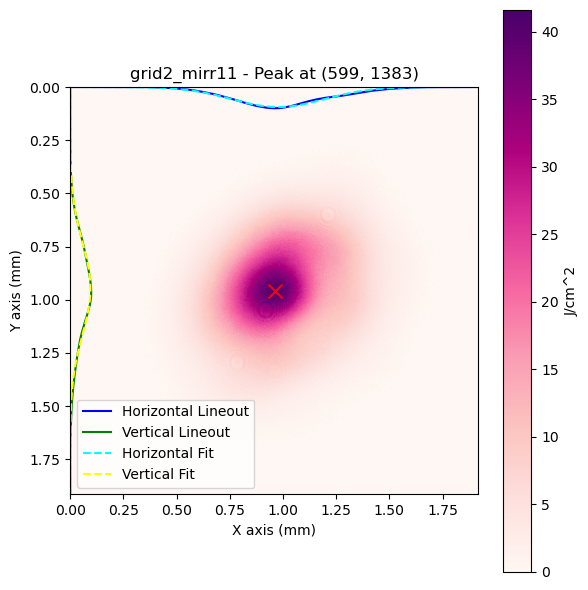

File: grid2_mirr11
Horizontal 1/e^2 Diameter: 0.8738 mm
Vertical 1/e^2 Diameter: 0.8677 mm


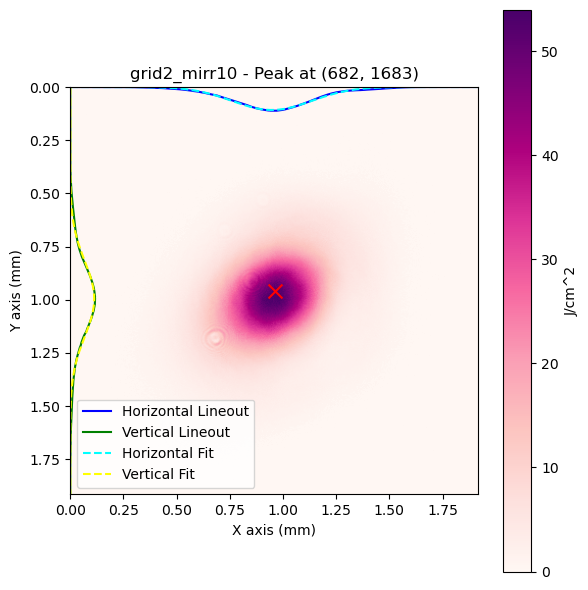

File: grid2_mirr10
Horizontal 1/e^2 Diameter: 0.7464 mm
Vertical 1/e^2 Diameter: 0.7096 mm


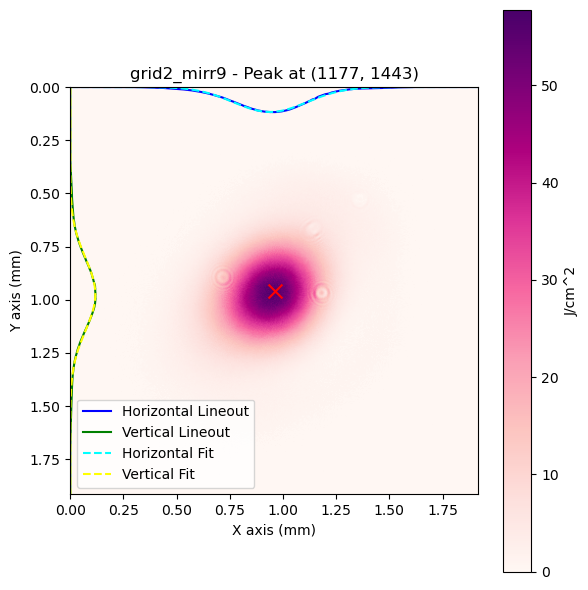

File: grid2_mirr9
Horizontal 1/e^2 Diameter: 0.6932 mm
Vertical 1/e^2 Diameter: 0.6842 mm


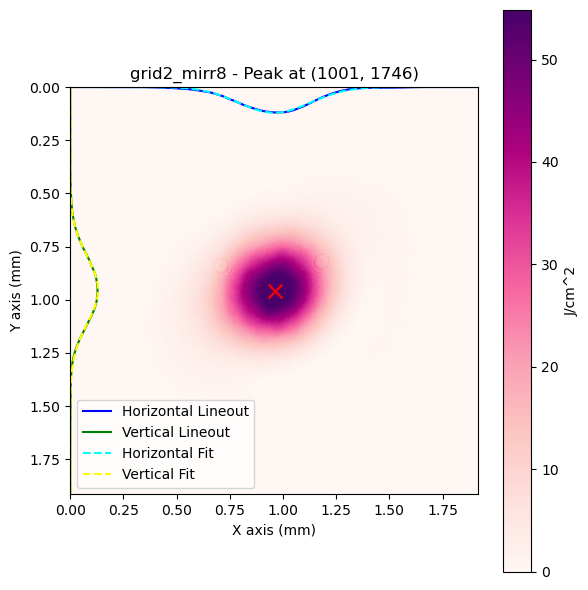

File: grid2_mirr8
Horizontal 1/e^2 Diameter: 0.6776 mm
Vertical 1/e^2 Diameter: 0.6364 mm


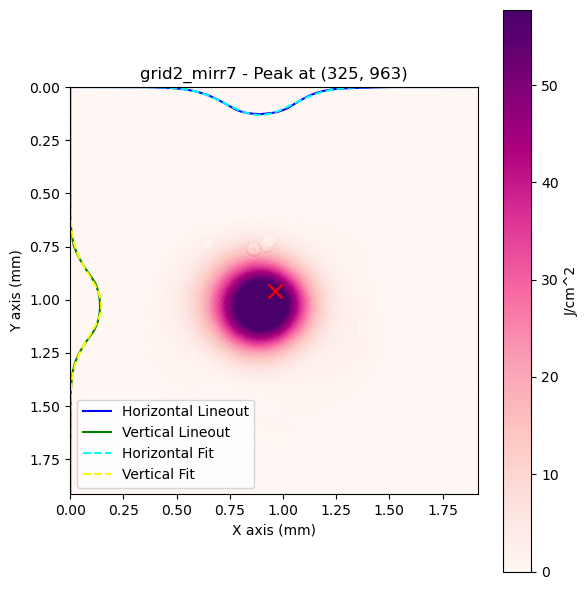

File: grid2_mirr7
Horizontal 1/e^2 Diameter: 0.6303 mm
Vertical 1/e^2 Diameter: 0.5746 mm


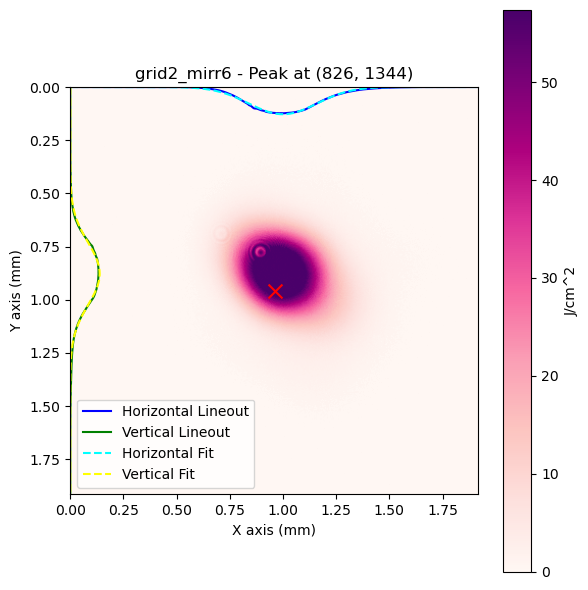

File: grid2_mirr6
Horizontal 1/e^2 Diameter: 0.6390 mm
Vertical 1/e^2 Diameter: 0.5850 mm


In [135]:
foc_files_2_thu = ['grid2_scraper',
               'grid2_mirr17',
               'grid2_mirr16',
               'grid2_mirr15',
               'grid2_mirr14',
               'grid2_mirr13',
               'grid2_mirr12',
               'grid2_mirr11',
               'grid2_mirr10',
               'grid2_mirr9',
               'grid2_mirr8',
               'grid2_mirr7',
               'grid2_mirr6']

folder_path = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/hc_focus_240627'
max_fluences_2_foc_thu, h_diams_2_foc_thu, v_diams_2_foc_thu = plot_image_files_with_peak(folder_path, foc_files_2_fri,True)

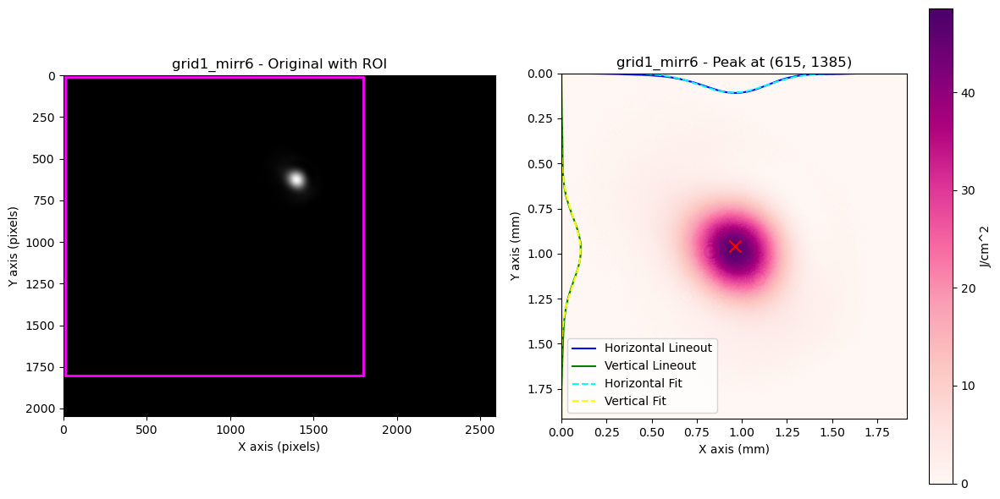

File: grid1_mirr6
Horizontal 1/e^2 Diameter: 0.7445 mm
Vertical 1/e^2 Diameter: 0.7441 mm


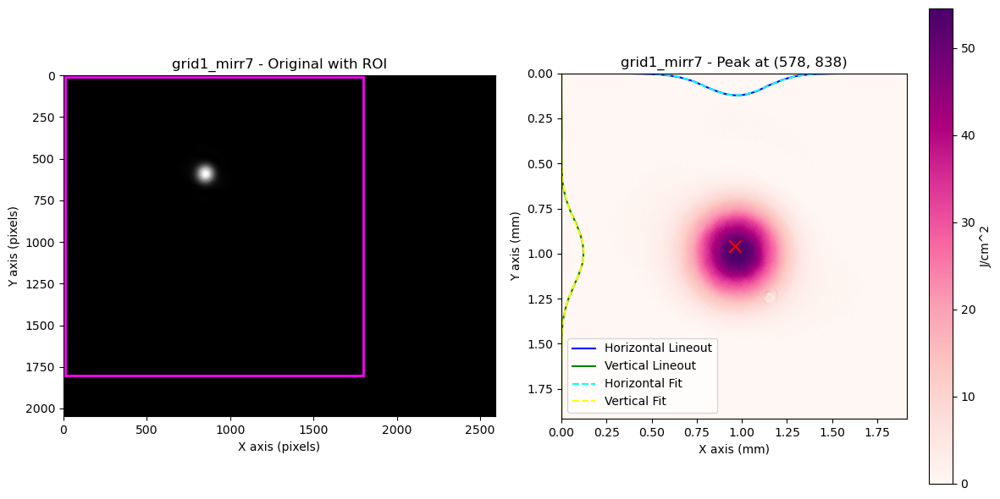

File: grid1_mirr7
Horizontal 1/e^2 Diameter: 0.6715 mm
Vertical 1/e^2 Diameter: 0.6748 mm


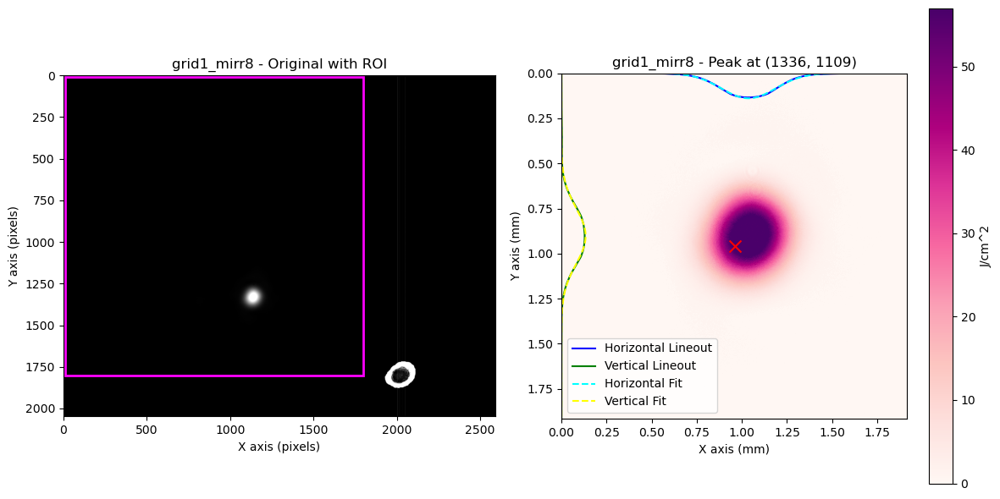

File: grid1_mirr8
Horizontal 1/e^2 Diameter: 0.5992 mm
Vertical 1/e^2 Diameter: 0.6213 mm


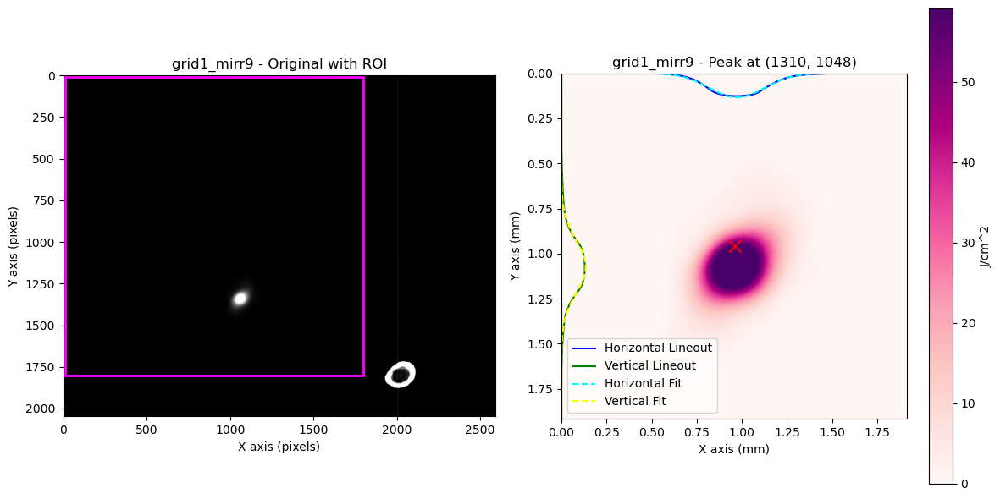

File: grid1_mirr9
Horizontal 1/e^2 Diameter: 0.6134 mm
Vertical 1/e^2 Diameter: 0.5914 mm


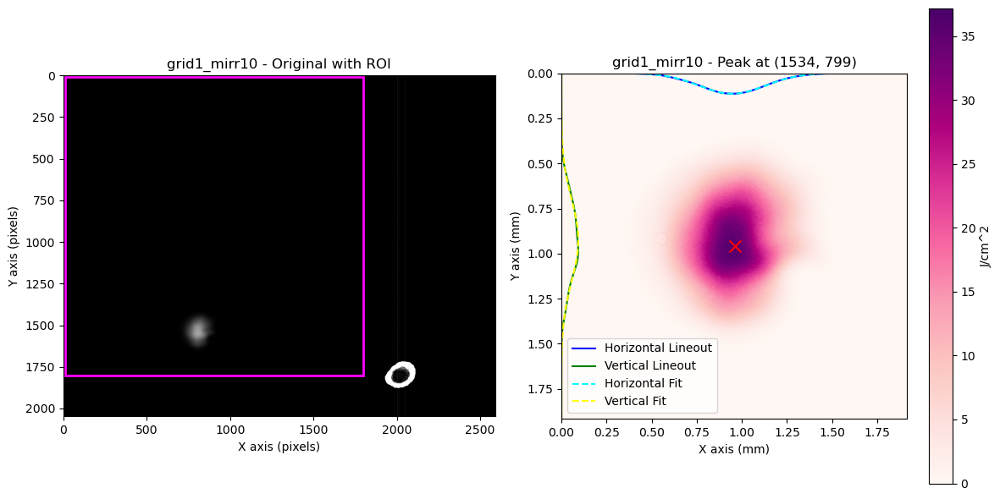

File: grid1_mirr10
Horizontal 1/e^2 Diameter: 0.7322 mm
Vertical 1/e^2 Diameter: 0.9047 mm


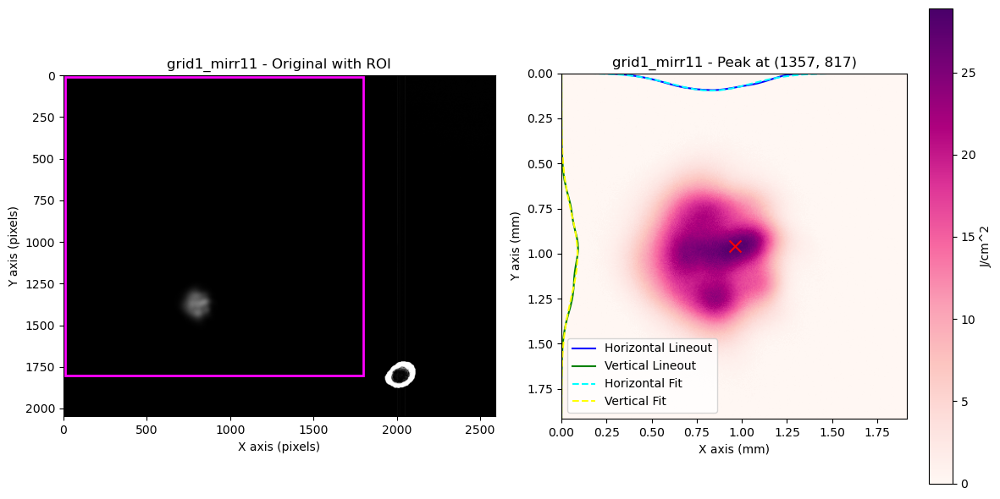

File: grid1_mirr11
Horizontal 1/e^2 Diameter: 0.8893 mm
Vertical 1/e^2 Diameter: 0.9565 mm


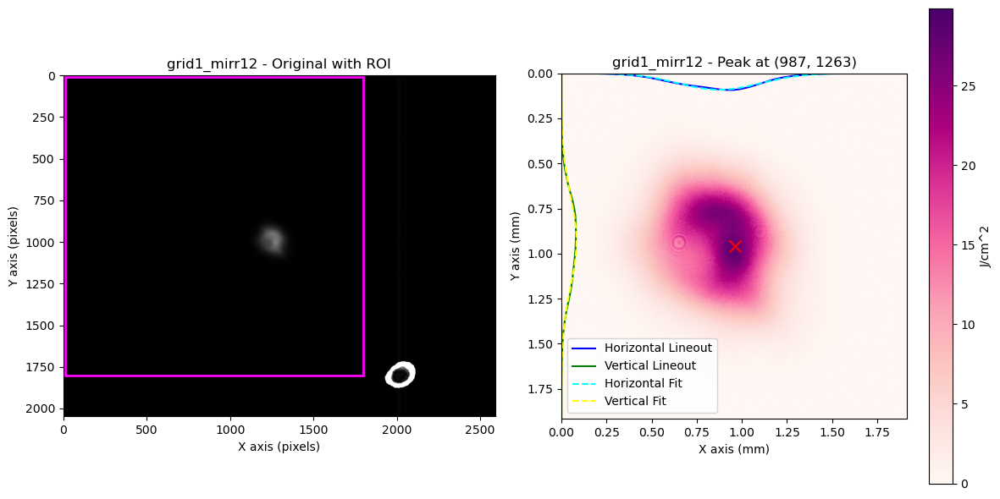

File: grid1_mirr12
Horizontal 1/e^2 Diameter: 0.9135 mm
Vertical 1/e^2 Diameter: 1.0095 mm


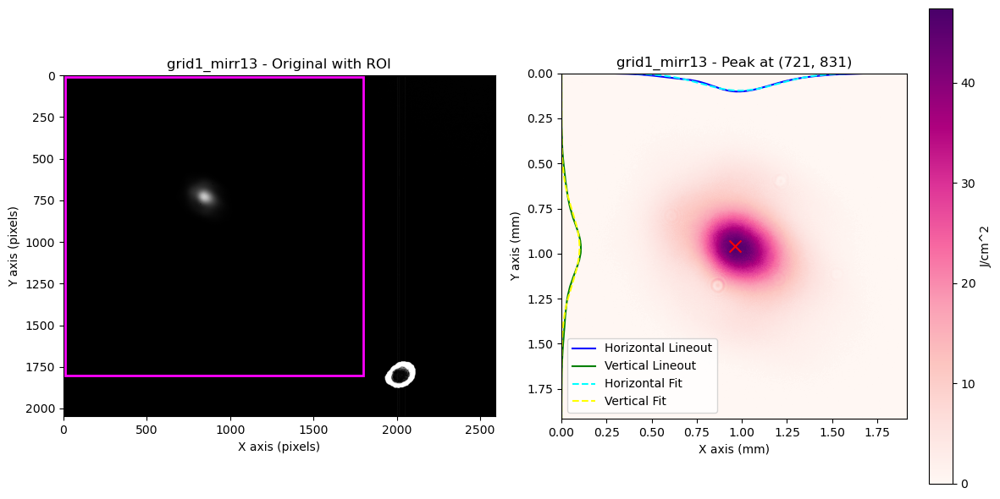

File: grid1_mirr13
Horizontal 1/e^2 Diameter: 0.8432 mm
Vertical 1/e^2 Diameter: 0.7945 mm


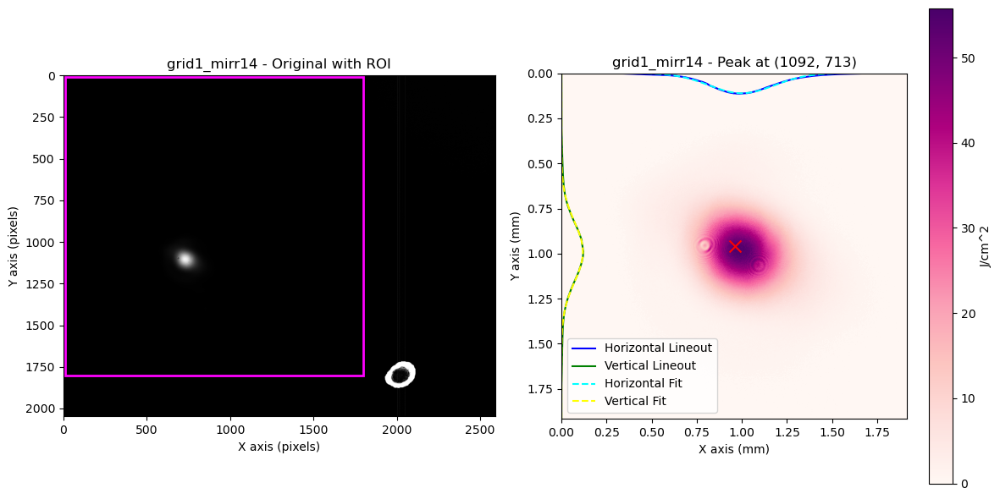

File: grid1_mirr14
Horizontal 1/e^2 Diameter: 0.7170 mm
Vertical 1/e^2 Diameter: 0.6702 mm


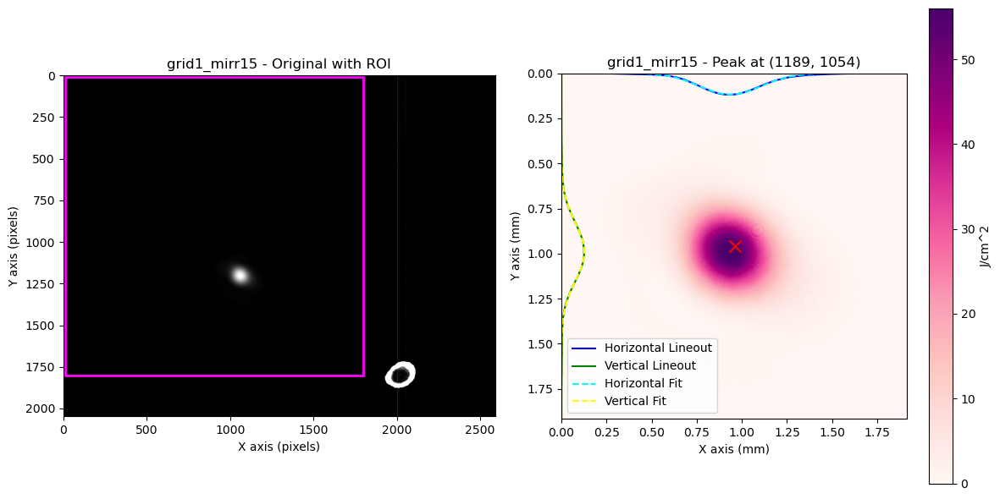

File: grid1_mirr15
Horizontal 1/e^2 Diameter: 0.6834 mm
Vertical 1/e^2 Diameter: 0.6474 mm


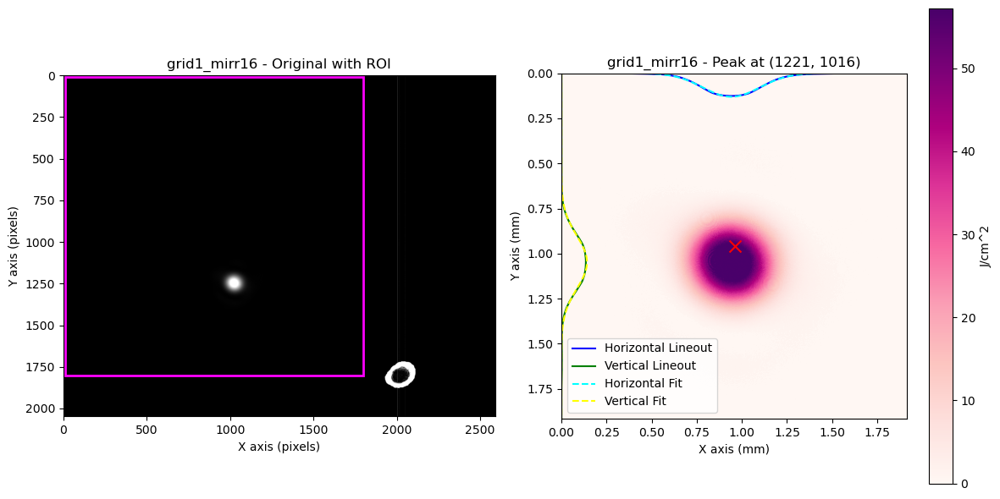

File: grid1_mirr16
Horizontal 1/e^2 Diameter: 0.6260 mm
Vertical 1/e^2 Diameter: 0.5828 mm


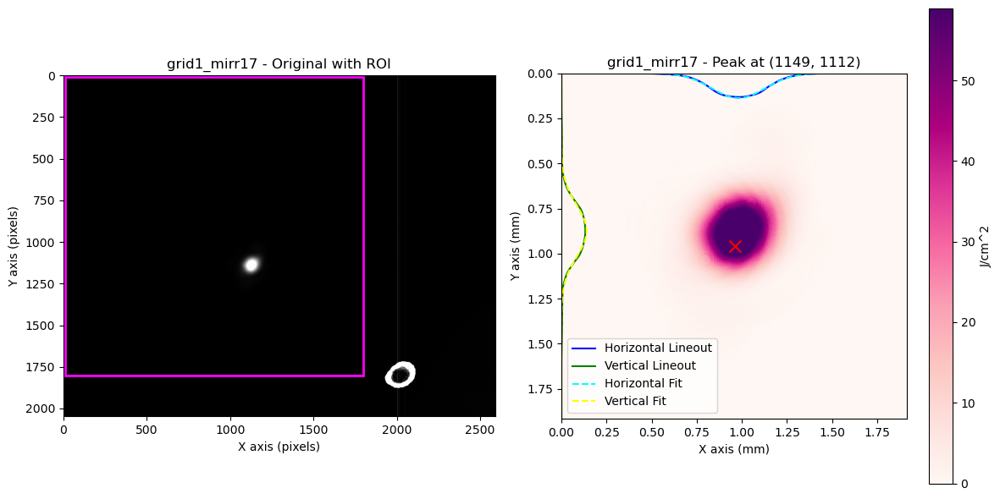

File: grid1_mirr17
Horizontal 1/e^2 Diameter: 0.5908 mm
Vertical 1/e^2 Diameter: 0.5739 mm


In [136]:
foc_files_1_fri = [
    'grid1_mirr6',
    'grid1_mirr7',
    'grid1_mirr8',
    'grid1_mirr9',
    'grid1_mirr10',
    'grid1_mirr11',
    'grid1_mirr12',
    'grid1_mirr13',
    'grid1_mirr14',
    'grid1_mirr15',
    'grid1_mirr16',
    'grid1_mirr17'
]

roi = (10, 1800, 10, 1800)  # Example ROI in pixels (x_start, x_end, y_start, y_end)

folder_path = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/hc_focus_240627'
max_fluences_1_foc_fri, h_diams_1_foc_fri, v_diams_1_foc_fri = plot_image_files_with_peak_crop(folder_path, foc_files_1_fri, True, roi)


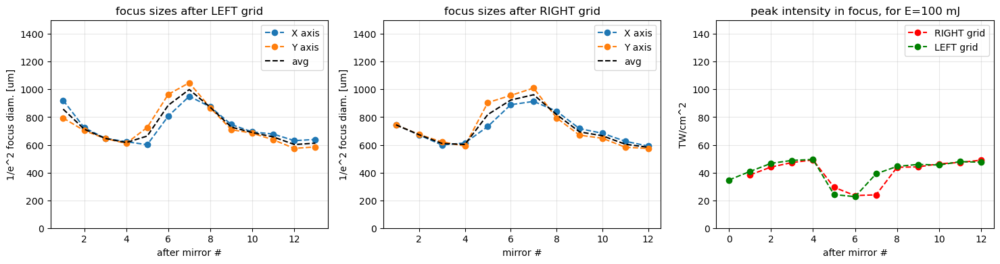

In [236]:
fig, ax = plt.subplots(1,3,figsize=(18, 4))

mirrs_1_foc_thu = [1,2,3,4,5,6,7,8,9,10,11,12]
mirrs_2_foc_thu = [1,2,3,4,5,6,7,8,9,10,11,12,13]

avg_foc_1_thu = (np.array(h_diams_1_foc_thu)+np.array(v_diams_1_foc_thu))/2 #find avg 
avg_foc_2_thu = (np.array(h_diams_2_foc_thu)+np.array(v_diams_2_foc_thu))/2

ax[0].plot(mirrs_2_foc_thu,np.array(h_diams_2_foc_thu)*1000,'--o',label='X axis')
ax[0].plot(mirrs_2_foc_thu,np.array(v_diams_2_foc_thu)*1000,'--o',label='Y axis')
ax[0].plot(mirrs_2_foc_thu,avg_foc_2_thu*1000,color='black',ls='dashed',label='avg')

ax[0].set_ylabel('1/e^2 focus diam. [um]')
ax[0].set_xlabel('after mirror #')
ax[0].legend()
ax[0].set_ylim(0,1500)
ax[0].set_title('focus sizes after LEFT grid')
ax[0].grid(alpha=0.3)

ax[1].plot(mirrs_1_foc_thu,np.array(h_diams_1_foc_thu)*1000,'--o',label='X axis')
ax[1].plot(mirrs_1_foc_thu,np.array(v_diams_1_foc_thu)*1000,'--o',label='Y axis')
ax[1].plot(mirrs_1_foc_thu,avg_foc_1_thu*1000,color='black',ls='dashed',label='avg')

ax[1].set_ylabel('1/e^2 focus diam. [um]')
ax[1].set_xlabel('mirror #')
ax[1].legend()
ax[1].set_ylim(0,1500)
ax[1].set_title('focus sizes after RIGHT grid')
ax[1].grid(alpha=0.3)

beam_t = 1.2e-12 #ps pulse duration

ax[2].plot(mirrs_1_foc_thu,max_fluences_1_foc_thu/beam_t*1e-12,'--o',color='red',label='RIGHT grid')
ax[2].plot(np.array(mirrs_2_foc_thu)-1,max_fluences_2_foc_thu/beam_t*1e-12,'--o',color='green',label='LEFT grid')
ax[2].set_ylim(0,150)
ax[2].set_xlabel('after mirror #')
ax[2].set_title('peak intensity in focus, for E={:.0f} mJ'.format(E_beam*1000))
ax[2].set_ylabel('TW/cm^2')
ax[2].grid(alpha=0.3)
ax[2].legend()

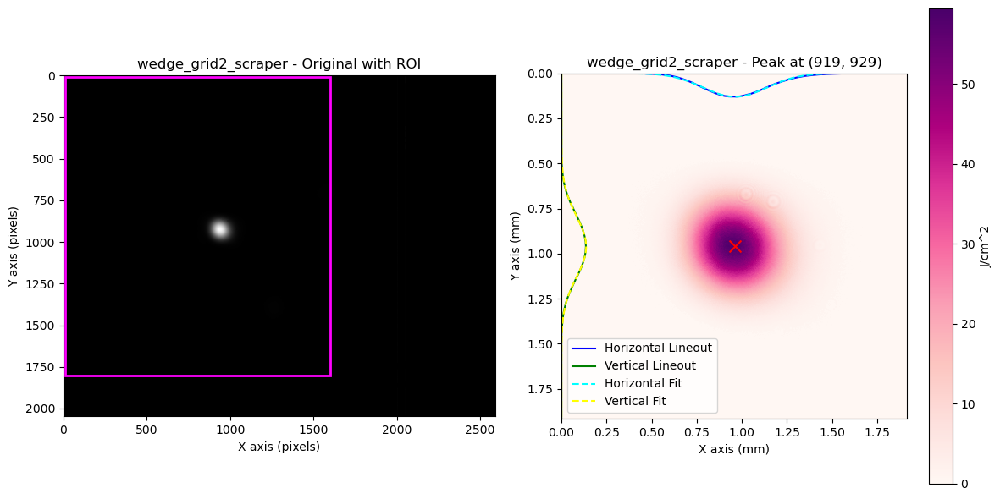

File: wedge_grid2_scraper
Horizontal 1/e^2 Diameter: 0.7073 mm
Vertical 1/e^2 Diameter: 0.6823 mm


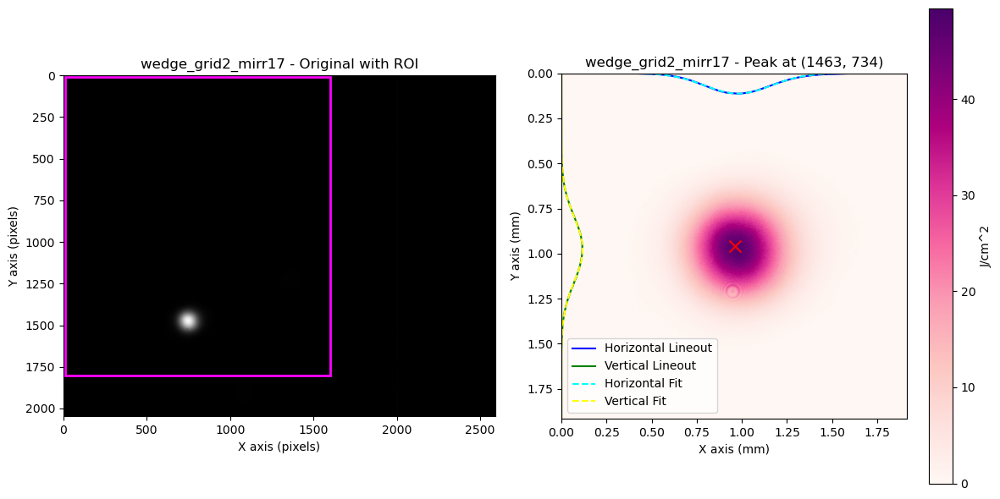

File: wedge_grid2_mirr17
Horizontal 1/e^2 Diameter: 0.7353 mm
Vertical 1/e^2 Diameter: 0.7170 mm


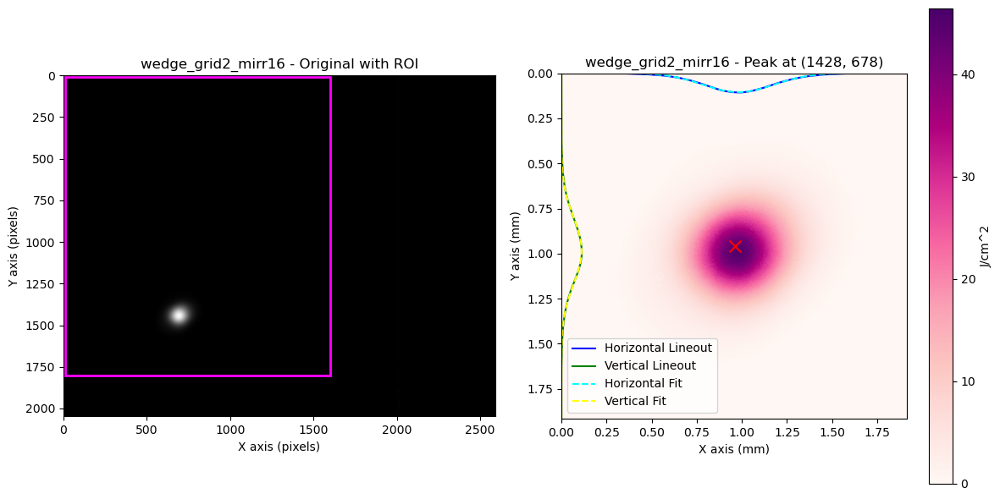

File: wedge_grid2_mirr16
Horizontal 1/e^2 Diameter: 0.7795 mm
Vertical 1/e^2 Diameter: 0.7347 mm


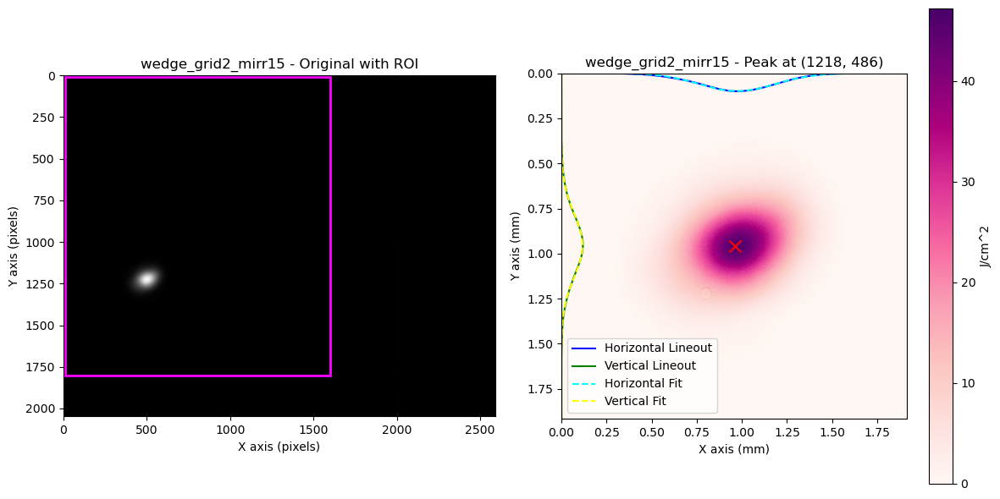

File: wedge_grid2_mirr15
Horizontal 1/e^2 Diameter: 0.8406 mm
Vertical 1/e^2 Diameter: 0.7048 mm


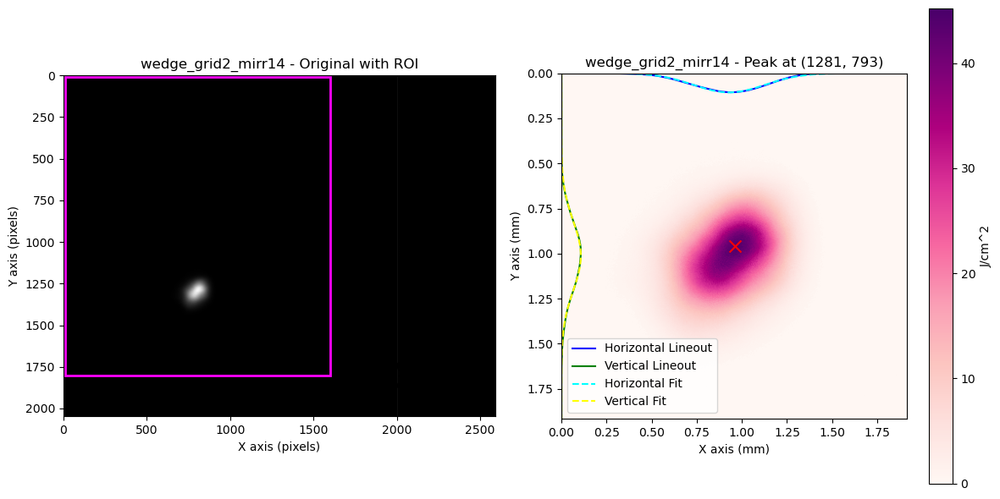

File: wedge_grid2_mirr14
Horizontal 1/e^2 Diameter: 0.7887 mm
Vertical 1/e^2 Diameter: 0.7748 mm


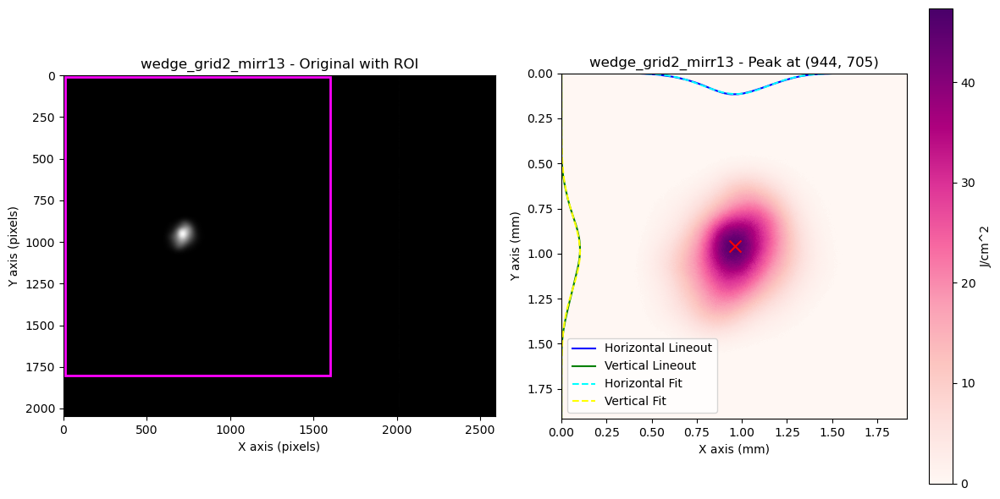

File: wedge_grid2_mirr13
Horizontal 1/e^2 Diameter: 0.7209 mm
Vertical 1/e^2 Diameter: 0.8182 mm


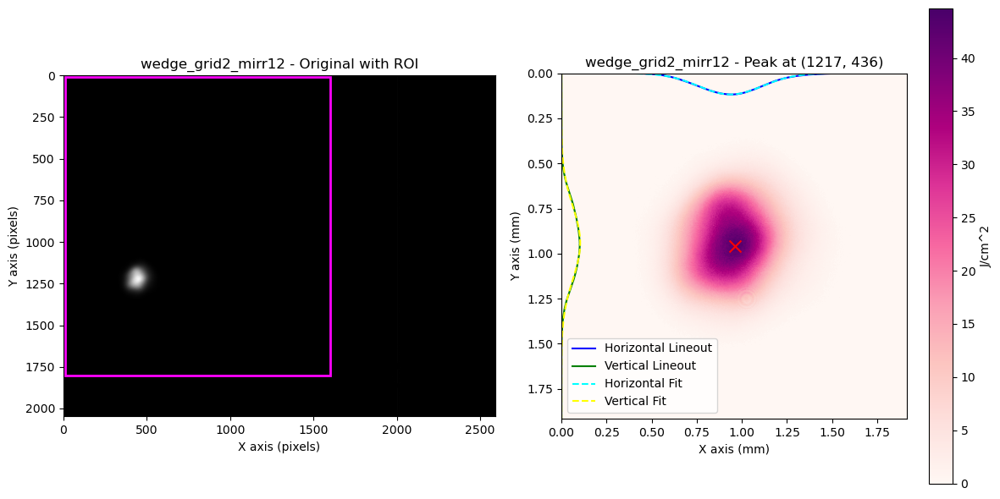

File: wedge_grid2_mirr12
Horizontal 1/e^2 Diameter: 0.7065 mm
Vertical 1/e^2 Diameter: 0.8141 mm


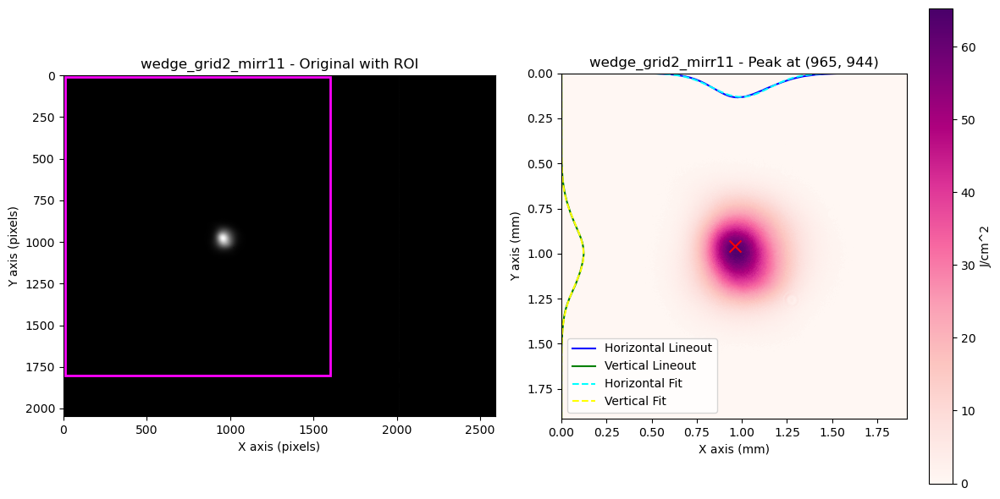

File: wedge_grid2_mirr11
Horizontal 1/e^2 Diameter: 0.6351 mm
Vertical 1/e^2 Diameter: 0.6877 mm


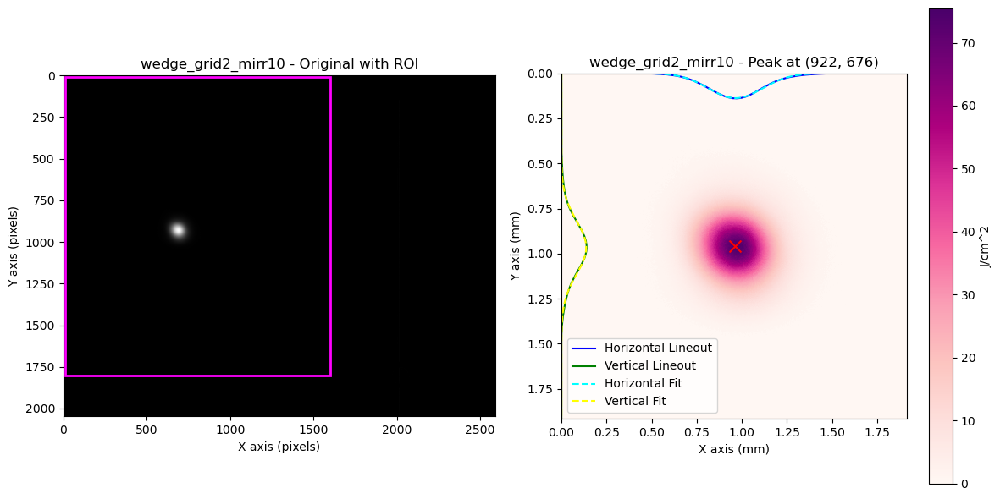

File: wedge_grid2_mirr10
Horizontal 1/e^2 Diameter: 0.6005 mm
Vertical 1/e^2 Diameter: 0.6004 mm


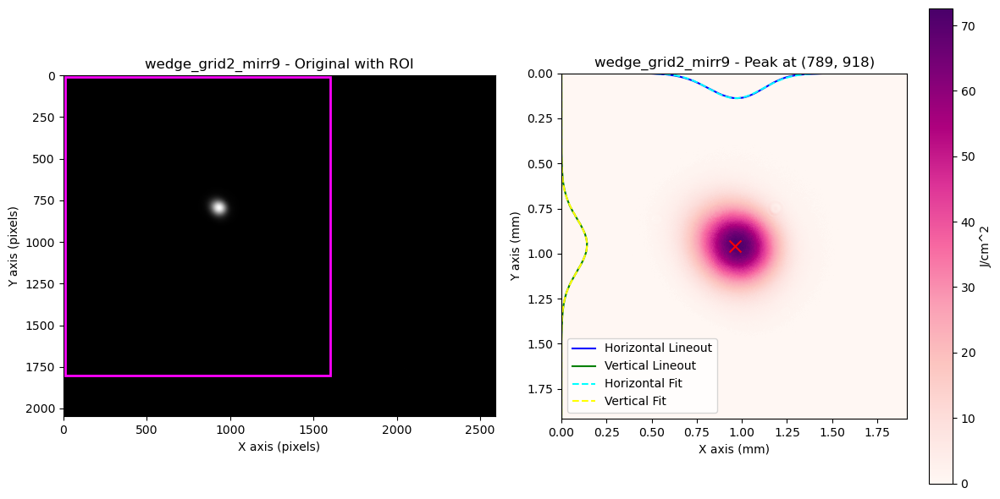

File: wedge_grid2_mirr9
Horizontal 1/e^2 Diameter: 0.6049 mm
Vertical 1/e^2 Diameter: 0.5892 mm


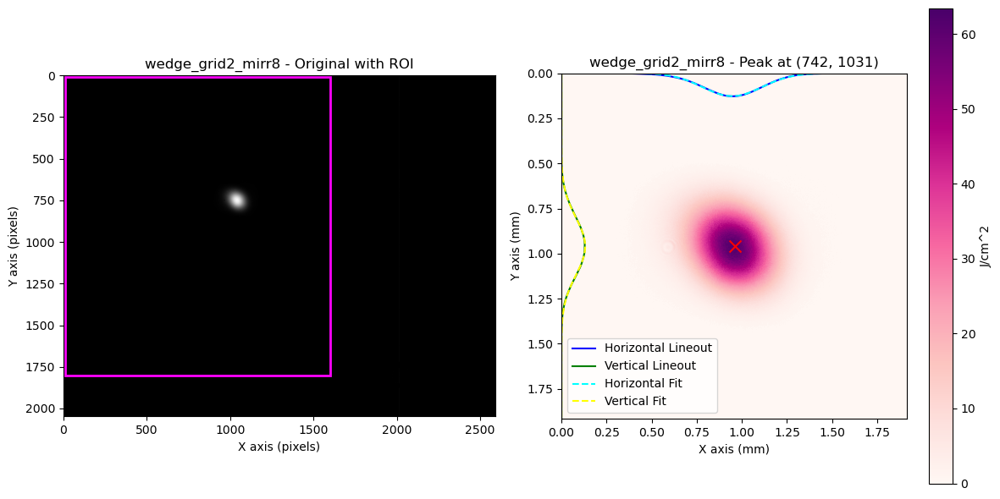

File: wedge_grid2_mirr8
Horizontal 1/e^2 Diameter: 0.6547 mm
Vertical 1/e^2 Diameter: 0.6431 mm


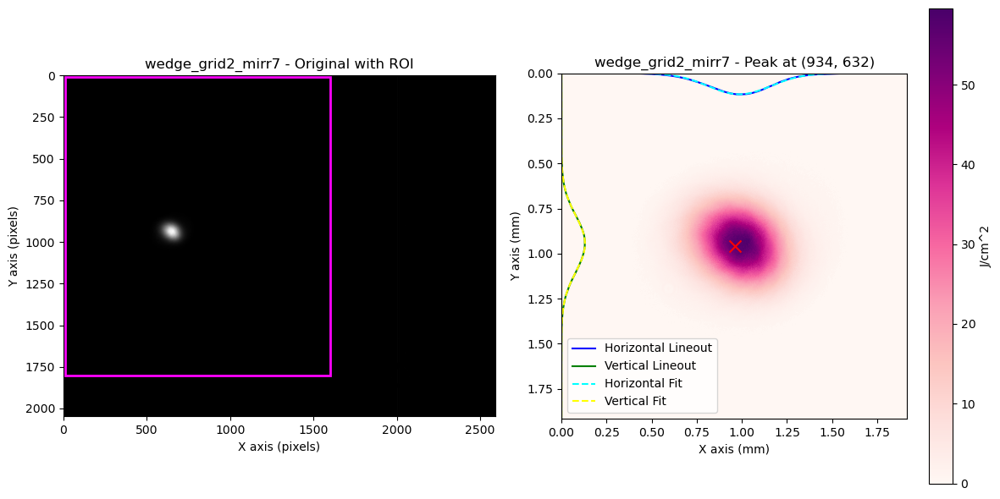

File: wedge_grid2_mirr7
Horizontal 1/e^2 Diameter: 0.6970 mm
Vertical 1/e^2 Diameter: 0.6283 mm


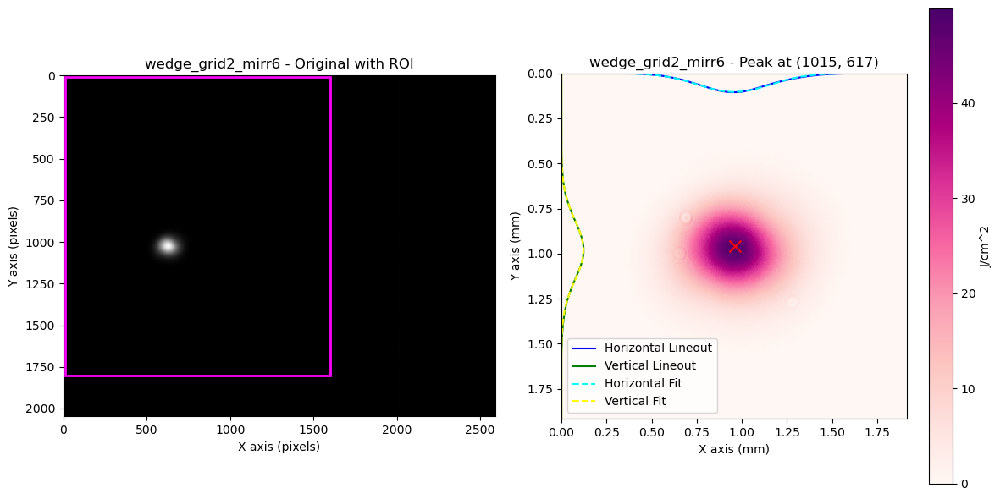

File: wedge_grid2_mirr6
Horizontal 1/e^2 Diameter: 0.8011 mm
Vertical 1/e^2 Diameter: 0.6798 mm


In [235]:
foc_files_2_fri = [
    'wedge_grid2_scraper',
    'wedge_grid2_mirr17',
    'wedge_grid2_mirr16',
    'wedge_grid2_mirr15',
    'wedge_grid2_mirr14',
    'wedge_grid2_mirr13',
    'wedge_grid2_mirr12',
    'wedge_grid2_mirr11',
    'wedge_grid2_mirr10',
    'wedge_grid2_mirr9',
    'wedge_grid2_mirr8',
    'wedge_grid2_mirr7',
    'wedge_grid2_mirr6'
]

roi = (10, 1600, 10, 1800)  # Example ROI in pixels (x_start, x_end, y_start, y_end)

folder_path = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/hc_focus_240628'
max_fluences_2_foc_fri, h_diams_2_foc_fri, v_diams_2_foc_fri = plot_image_files_with_peak_crop(folder_path, foc_files_2_fri, True, roi)


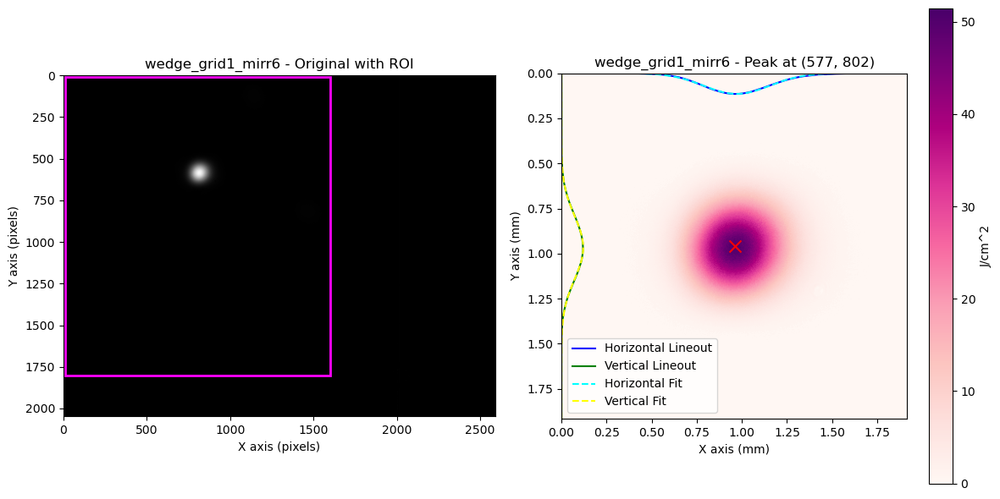

File: wedge_grid1_mirr6
Horizontal 1/e^2 Diameter: 0.7275 mm
Vertical 1/e^2 Diameter: 0.7005 mm


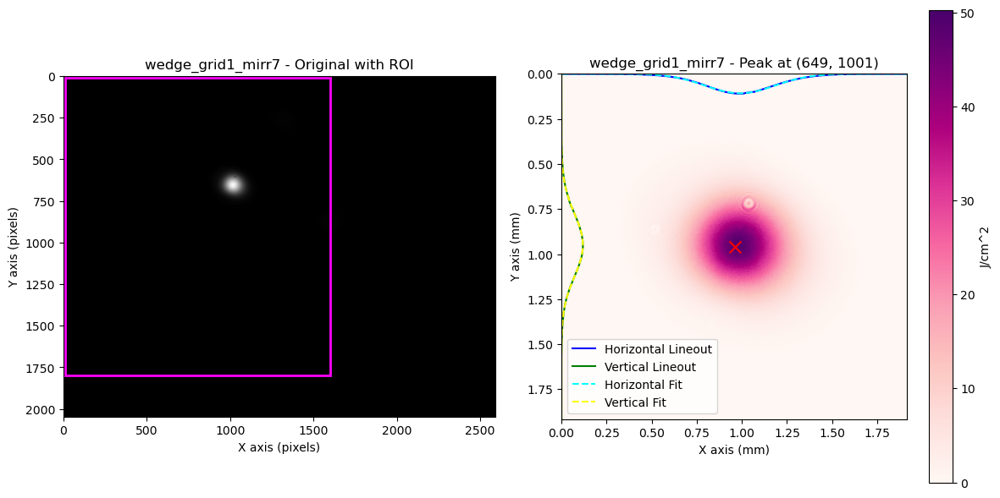

File: wedge_grid1_mirr7
Horizontal 1/e^2 Diameter: 0.7682 mm
Vertical 1/e^2 Diameter: 0.7012 mm


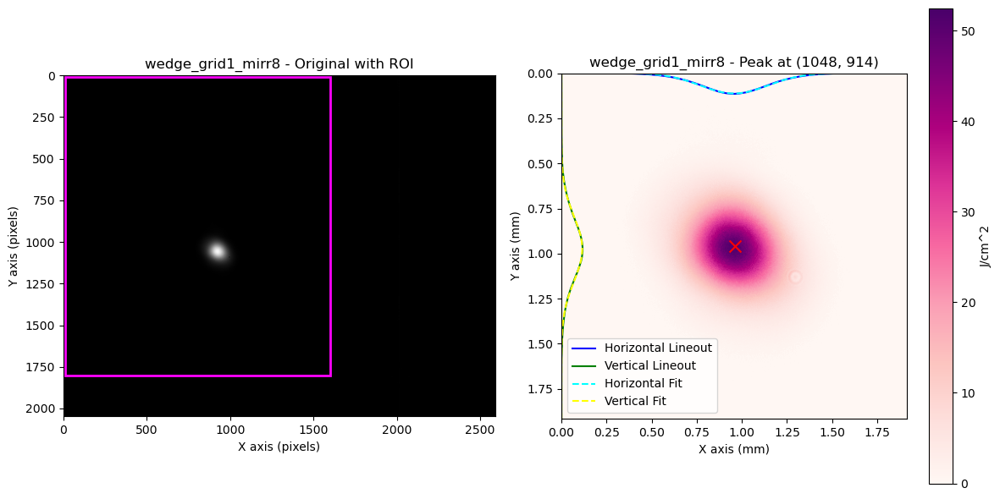

File: wedge_grid1_mirr8
Horizontal 1/e^2 Diameter: 0.7419 mm
Vertical 1/e^2 Diameter: 0.7180 mm


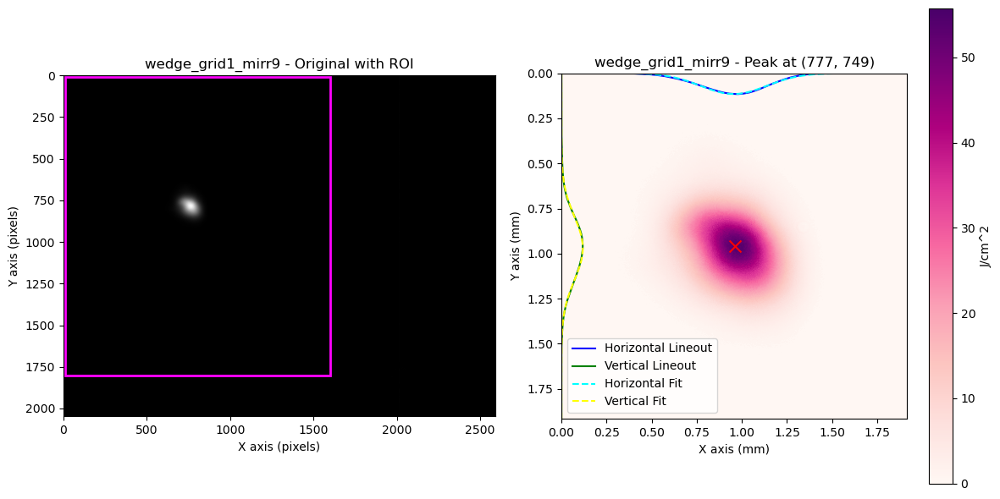

File: wedge_grid1_mirr9
Horizontal 1/e^2 Diameter: 0.7324 mm
Vertical 1/e^2 Diameter: 0.7072 mm


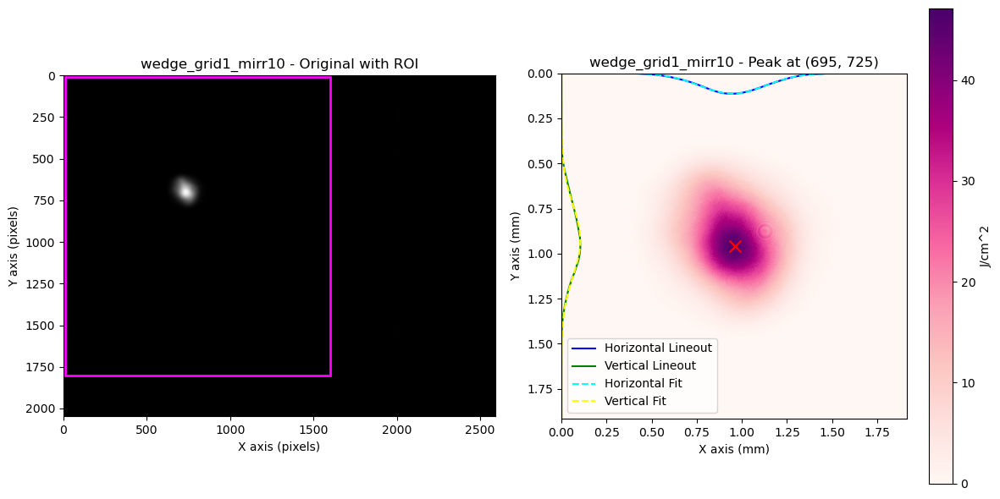

File: wedge_grid1_mirr10
Horizontal 1/e^2 Diameter: 0.7291 mm
Vertical 1/e^2 Diameter: 0.7987 mm


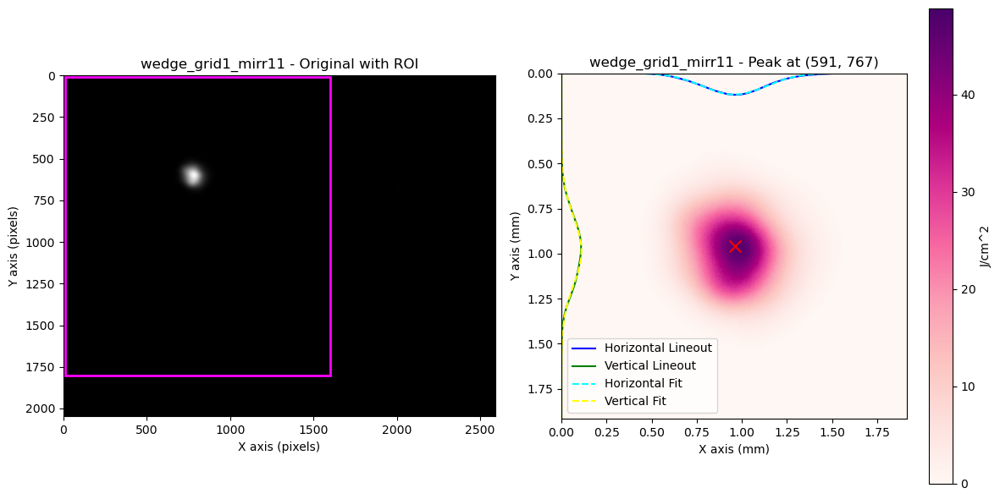

File: wedge_grid1_mirr11
Horizontal 1/e^2 Diameter: 0.7033 mm
Vertical 1/e^2 Diameter: 0.7631 mm


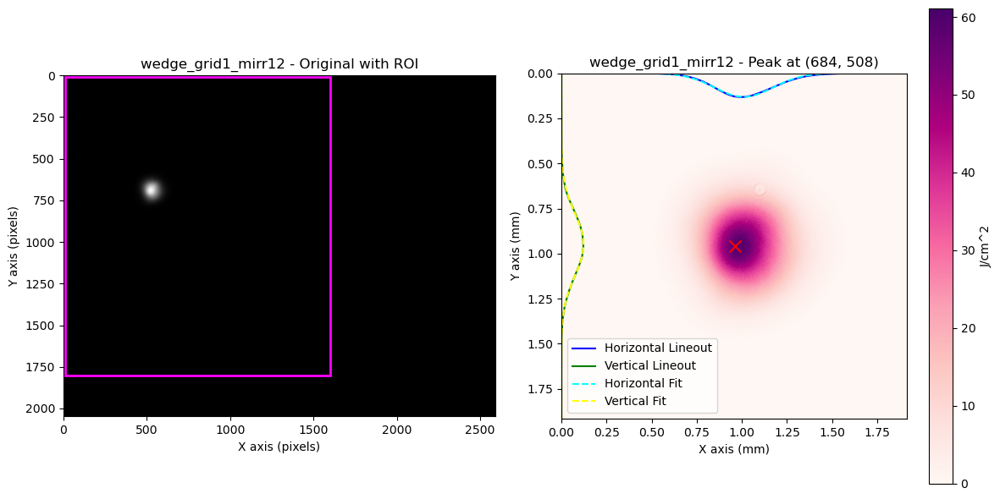

File: wedge_grid1_mirr12
Horizontal 1/e^2 Diameter: 0.6457 mm
Vertical 1/e^2 Diameter: 0.6962 mm


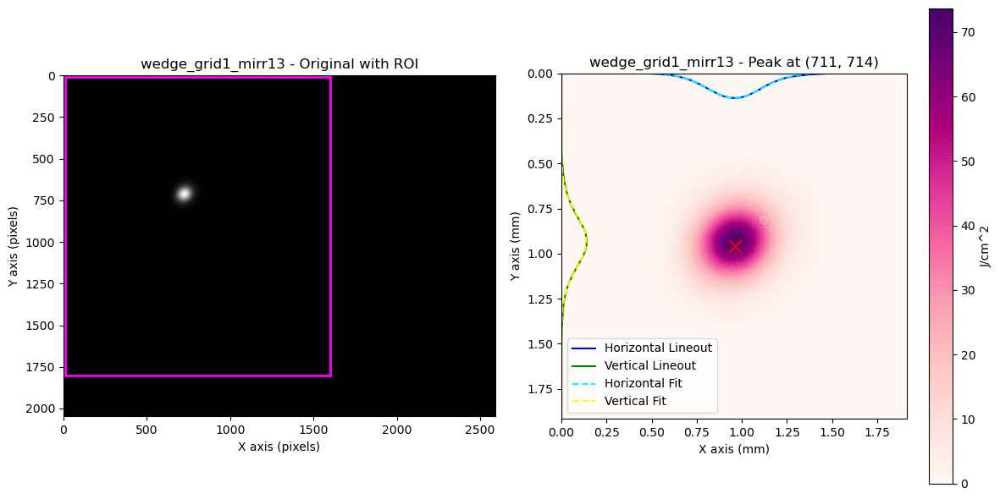

File: wedge_grid1_mirr13
Horizontal 1/e^2 Diameter: 0.6146 mm
Vertical 1/e^2 Diameter: 0.6055 mm


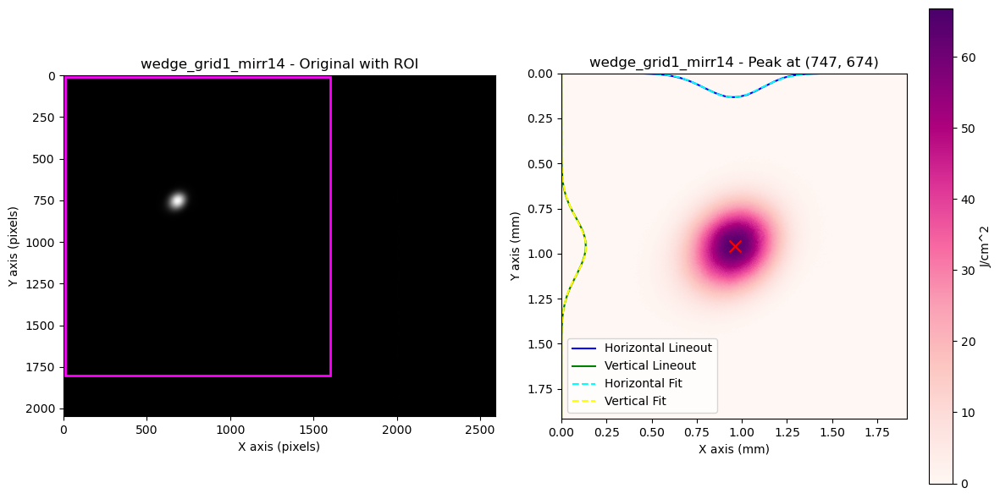

File: wedge_grid1_mirr14
Horizontal 1/e^2 Diameter: 0.6331 mm
Vertical 1/e^2 Diameter: 0.6238 mm


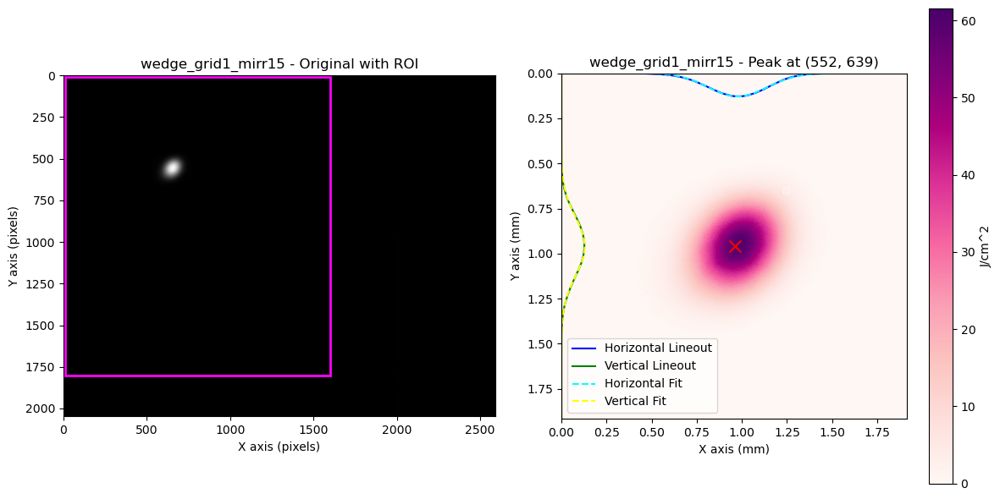

File: wedge_grid1_mirr15
Horizontal 1/e^2 Diameter: 0.6481 mm
Vertical 1/e^2 Diameter: 0.6526 mm


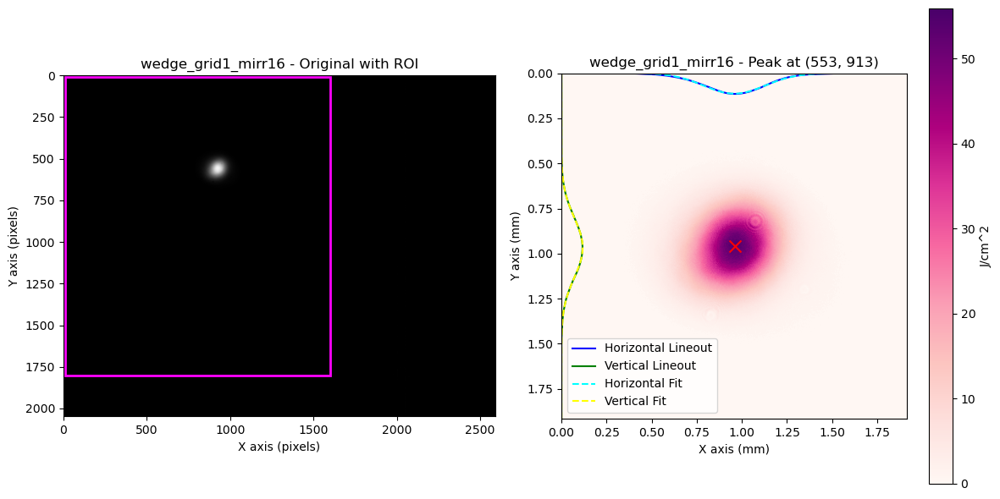

File: wedge_grid1_mirr16
Horizontal 1/e^2 Diameter: 0.6784 mm
Vertical 1/e^2 Diameter: 0.6633 mm


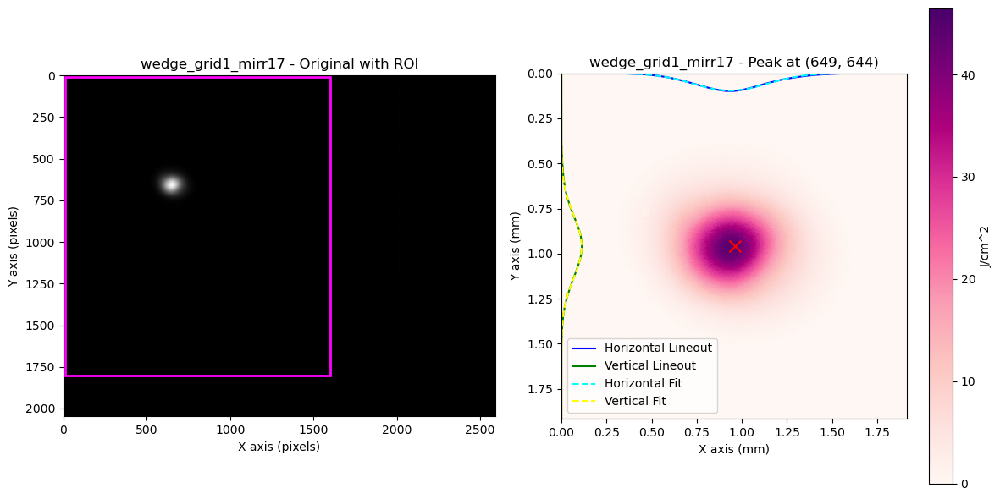

File: wedge_grid1_mirr17
Horizontal 1/e^2 Diameter: 0.8101 mm
Vertical 1/e^2 Diameter: 0.6980 mm


In [247]:
foc_files_1_fri = [
    'wedge_grid1_mirr6',
    'wedge_grid1_mirr7',
    'wedge_grid1_mirr8',
    'wedge_grid1_mirr9',
    'wedge_grid1_mirr10',
    'wedge_grid1_mirr11',
    'wedge_grid1_mirr12',
    'wedge_grid1_mirr13',
    'wedge_grid1_mirr14',
    'wedge_grid1_mirr15',
    'wedge_grid1_mirr16',
    'wedge_grid1_mirr17'
]

roi = (10, 1600, 10, 1800)  # Example ROI in pixels (x_start, x_end, y_start, y_end)

folder_path = '/Users/sebastiankalos/Documents/OXFORD/HerriottCell/beam_sizes/hc_focus_240628'
max_fluences_1_foc_fri, h_diams_1_foc_fri, v_diams_1_foc_fri = plot_image_files_with_peak_crop(folder_path, foc_files_1_fri, True, roi)


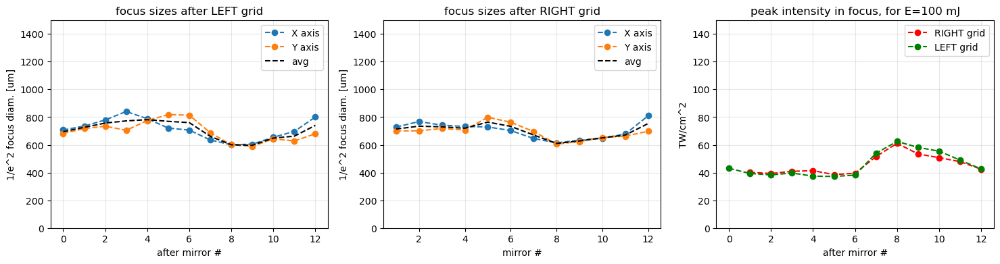

In [250]:
fig, ax = plt.subplots(1,3,figsize=(18, 4))

mirrs_1_foc_fri = [1,2,3,4,5,6,7,8,9,10,11,12]
mirrs_2_foc_fri = [0,1,2,3,4,5,6,7,8,9,10,11,12]

avg_foc_1_fri = (np.array(h_diams_1_foc_fri)+np.array(v_diams_1_foc_fri))/2
avg_foc_2_fri = (np.array(h_diams_2_foc_fri)+np.array(v_diams_2_foc_fri))/2

ax[0].plot(mirrs_2_foc_fri,np.array(h_diams_2_foc_fri)*1000,'--o',label='X axis')
ax[0].plot(mirrs_2_foc_fri,np.array(v_diams_2_foc_fri)*1000,'--o',label='Y axis')
ax[0].plot(mirrs_2_foc_fri,avg_foc_2_fri*1000,color='black',ls='dashed',label='avg')

ax[0].set_ylabel('1/e^2 focus diam. [um]')
ax[0].set_xlabel('after mirror #')
ax[0].legend()
ax[0].set_ylim(0,1500)
ax[0].set_title('focus sizes after LEFT grid')
ax[0].grid(alpha=0.3)

ax[1].plot(mirrs_1_foc_fri,np.array(h_diams_1_foc_fri)*1000,'--o',label='X axis')
ax[1].plot(mirrs_1_foc_fri,np.array(v_diams_1_foc_fri)*1000,'--o',label='Y axis')
ax[1].plot(mirrs_1_foc_fri,avg_foc_1_fri*1000,color='black',ls='dashed',label='avg')

ax[1].set_ylabel('1/e^2 focus diam. [um]')
ax[1].set_xlabel('mirror #')
ax[1].legend()
ax[1].set_ylim(0,1500)
ax[1].set_title('focus sizes after RIGHT grid')
ax[1].grid(alpha=0.3)

beam_t = 1.2e-12 #ps pulse duration

ax[2].plot(mirrs_1_foc_fri,max_fluences_1_foc_fri/beam_t*1e-12,'--o',color='red',label='RIGHT grid')
ax[2].plot(np.array(mirrs_2_foc_fri),max_fluences_2_foc_fri/beam_t*1e-12,'--o',color='green',label='LEFT grid')
ax[2].set_ylim(0,150)
ax[2].set_xlabel('after mirror #')
ax[2].set_title('peak intensity in focus, for E={:.0f} mJ'.format(E_beam*1000))
ax[2].set_ylabel('TW/cm^2')
ax[2].grid(alpha=0.3)
ax[2].legend()

In [48]:
print(max_fluences_1_foc_orig)
print(np.insert(max_fluences_1_foc_orig,0,max_fluences_2_foc_orig[0],axis=0))

[106.91114281 103.86186391 109.40767085  96.22561189  80.83347519
  78.85180158 192.31542828 214.94375546 190.24185249 157.77935857
 132.017501    93.73160447]
[113.71817011 106.91114281 103.86186391 109.40767085  96.22561189
  80.83347519  78.85180158 192.31542828 214.94375546 190.24185249
 157.77935857 132.017501    93.73160447]


In [252]:
avg_fluence_foc_thu = (np.array(np.insert(max_fluences_1_foc_thu,0,max_fluences_2_foc_thu[0],axis=0))+np.array(max_fluences_2_foc_thu))/2 #find avg 
avg_fluence_foc_orig = (np.array(np.insert(max_fluences_1_foc_orig,0,max_fluences_2_foc_orig[0],axis=0))+np.array(max_fluences_2_foc_orig))/2 #find avg 
avg_fluence_foc = (np.array(np.insert(max_fluences_1_foc,0,max_fluences_2_foc[0],axis=0))+np.array(max_fluences_2_foc))/2 #find avg 
avg_fluence_foc_fri = (np.array(np.insert(max_fluences_1_foc_fri,0,max_fluences_2_foc_fri[0],axis=0))+np.array(max_fluences_2_foc_fri))/2 #find avg 

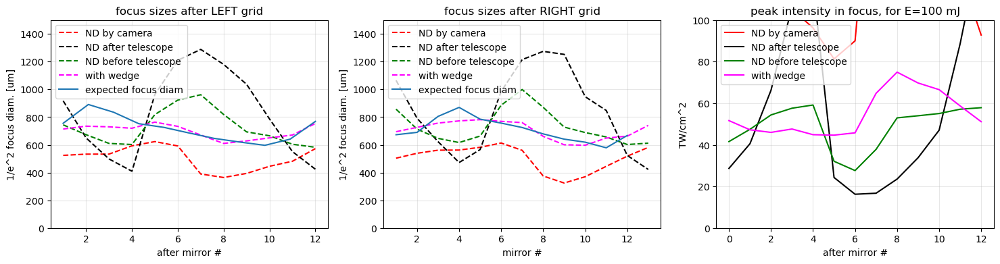

In [308]:
fig, ax = plt.subplots(1,3,figsize=(18, 4))

E_mJ = 100

f = 4000e-3
wavelength = 1030e-9
M2 = 1.1 #M squared quality factor
D1 = (np.array(h_diams_grid_1_fri)+np.array(v_diams_grid_1_fri))/2*1e-3 #diameter of the beam on the right grid (from measurement)
D2 = (np.array(h_diams_grid_2_fri)+np.array(v_diams_grid_2_fri))/2*1e-3 #diameter of the beam on the right grid (from measurement)
w0_1 = 2*M2*wavelength*f/(np.pi*D1) #waist size (radius)
w0_2 = 2*M2*wavelength*f/(np.pi*D2) #waist size (radius)

ax[0].plot(mirrs_1_foc_orig,avg_foc_1_orig*1000,color='red',ls='dashed',label='ND by camera')
ax[0].plot(mirrs_1_foc,avg_foc_1*1000,color='black',ls='dashed',label='ND after telescope')
ax[0].plot(mirrs_1_foc_thu,avg_foc_1_thu*1000,color='green',ls='dashed',label='ND before telescope')
ax[0].plot(mirrs_1_foc_fri,avg_foc_1_fri*1000,color='magenta',ls='dashed',label='with wedge')

ax[0].plot(np.linspace(1,12,11),2*w0_1*1e6,label='expected focus diam')

ax[0].set_ylabel('1/e^2 focus diam. [um]')
ax[0].set_xlabel('after mirror #')
ax[0].legend()
ax[0].set_ylim(0,1500)
ax[0].set_title('focus sizes after LEFT grid')
ax[0].grid(alpha=0.3)

ax[1].plot(mirrs_2_foc_orig,avg_foc_2_orig*1000,color='red',ls='dashed',label='ND by camera')
ax[1].plot(mirrs_2_foc,avg_foc_2*1000,color='black',ls='dashed',label='ND after telescope')
ax[1].plot(mirrs_2_foc_thu,avg_foc_2_thu*1000,color='green',ls='dashed',label='ND before telescope')
ax[1].plot(np.array(mirrs_2_foc_fri)+1,avg_foc_2_fri*1000,color='magenta',ls='dashed',label='with wedge')

ax[1].plot(np.linspace(1,12,12),2*w0_2*1e6,label='expected focus diam')


ax[1].set_ylabel('1/e^2 focus diam. [um]')
ax[1].set_xlabel('mirror #')
ax[1].legend()
ax[1].set_ylim(0,1500)
ax[1].set_title('focus sizes after RIGHT grid')
ax[1].grid(alpha=0.3)

beam_t = 1.2e-12 #ps pulse duration

ax[2].plot(np.array(avg_fluence_foc_orig)*E_mJ/(E_beam*1000),color='red',label='ND by camera')
ax[2].plot(np.array(avg_fluence_foc)*E_mJ/(E_beam*1000),color='black',label='ND after telescope')
ax[2].plot(np.array(avg_fluence_foc_thu)*E_mJ/(E_beam*1000),color='green',label='ND before telescope')
ax[2].plot(np.array(max_fluences_2_foc_fri)*E_mJ/(E_beam*1000),color='magenta',label='with wedge')

ax[2].set_ylim(0,100)
ax[2].set_xlabel('after mirror #')
ax[2].set_title('peak intensity in focus, for E={:.0f} mJ'.format(E_mJ))
ax[2].set_ylabel('TW/cm^2')
ax[2].grid(alpha=0.3)
ax[2].legend()

(0.0, 50.0)

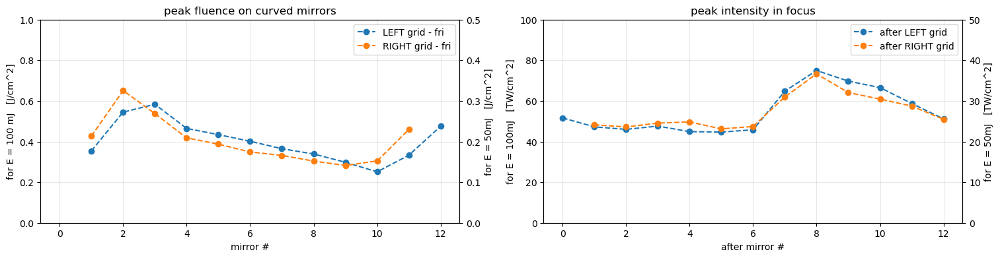

In [371]:
fig, ax = plt.subplots(1,2,figsize=(18, 4))

mJ_used = 100

mirrs_fri_1 = [1,2,3,4,5,6,7,8,9,10,11]
mirrs_fri_2 = [1,2,3,4,5,6,7,8,9,10,11,12]
ax[0].plot(mirrs_fri_2,np.array(max_fluences_grid_2_fri)*mJ_used/100,'--o',label='LEFT grid - fri')
ax[0].plot(mirrs_fri_1,np.array(max_fluences_grid_1_fri)*mJ_used/100,'--o',label='RIGHT grid - fri')

ax[0].set_xlabel('mirror #')
ax[0].set_ylabel('for E = {:.0f} mJ   [J/cm^2]'.format(mJ_used))
ax[0].set_ylim(0,1)
ax[0].set_title('peak fluence on curved mirrors')
ax[0].grid(alpha=0.3)
ax[0].legend()

ax1 = ax[0].twinx()
ax1.plot(np.array(max_fluences_1)/2,alpha=0)
ax1.plot(np.array(max_fluences_2)/2,alpha=0)
ax1.set_ylabel('for E = {:.0f}mJ   [J/cm^2]'.format(mJ_used/2))
ax1.set_ylim(0,0.5)


ax[1].plot(np.linspace(0,12,13),np.array(max_fluences_2_foc_fri)*mJ_used/100,'--o',label='after LEFT grid')
ax[1].plot(np.linspace(1,12,12),np.array(max_fluences_1_foc_fri)*mJ_used/100,'--o',label='after RIGHT grid')

ax[1].set_ylim(0,100)
ax[1].set_xlabel('after mirror #')
ax[1].set_title('peak intensity in focus')
ax[1].set_ylabel('for E = {:.0f}mJ   [TW/cm^2]'.format(mJ_used))
ax[1].grid(alpha=0.3)
ax[1].legend()

ax2 = ax[1].twinx()
ax2.plot(np.array(max_fluences_2_foc_fri)*mJ_used/100,alpha=0)
ax2.set_ylabel('for E = {:.0f}mJ   [TW/cm^2]'.format(mJ_used/2))
ax2.set_ylim(0,50)